In [2]:
import numpy as np
from netCDF4 import Dataset
import xarray as xr
import os
import pandas as pd
import dask.dataframe as dd
import datetime
import matplotlib.pyplot as plt
import sys
from shapely.geometry import LineString, Polygon, MultiPoint, Point
from scipy.interpolate import RegularGridInterpolator
import gsw

from proj_viz.argo_viz import plot_single_ts_profile, compare_profiles

sys.path.append("/home/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/eoas_pyutils/")

from io_utils.coaps_io_data import get_aviso_by_date, get_sst_by_date, get_sss_by_date
# from io_utils.io_netcdf import read_netcdf_xr, read_multiple_netcdf_xarr # read_multiple not working, using my own
from viz_utils.eoa_viz import select_colormap, EOAImageVisualizer
from viz_utils.eoas_viz_3d import ImageVisualizer3D
from viz_utils.constants import PlotMode

def load_join_clean(path, files, variables, num_files=None):
    """Load, joins and remove NaNs from multiple NetCDF files.

    Parameters:
    path (str): The path to the directory containing the files.
    files (list of str): The list of files to load.
    variables (list of str): The variables to extract from each file.
    num_files (int, optional): The maximum number of files to load.

    Returns:
    pandas.DataFrame: The concatenated clean dataset as a DataFrame.
    """
    # Initialize an empty list to store the datasets
    datasets = []

    # Loop over the files
    for file in files[:num_files]:  # Limit the number of files if specified
        # Only process .nc files
        if not file.endswith('.nc'):
            continue

        # Define the file path
        file_path = os.path.join(path, file)

        # Open the dataset without decoding times
        ds = xr.open_dataset(file_path, decode_times=False)

        # Extract the variables of interest
        ds = ds[variables]

        # Append the dataset to the list
        datasets.append(ds)

    # Concatenate all datasets
    ds_combined = xr.concat(datasets, dim='time')

    # Convert the dataset to a DataFrame
    df = ds_combined.to_dataframe()

    # Remove rows with missing values
    df_clean = df.dropna()
    
    # Convert the index to a DatetimeIndex
    df_clean.index = pd.to_datetime(df_clean.index, unit='s')

    # Extract the date for each measurement
    df_clean['date'] = df_clean.index.date

    return df_clean

def plot_profiles(df, day):
    """Plot temperature, salinity, and density profiles for a specific day.

    Parameters:
    df (pandas.DataFrame): The DataFrame containing the data.
    day (datetime.date): The day to plot profiles for.
    """
    # Filter the DataFrame for the chosen day
    df_day = df[df['date'] == day]

    fig, axs = plt.subplots(1, 3, figsize=(20, 6))
    
    variables = ['temperature', 'salinity', 'density']
    titles = ['Temperature Profile', 'Salinity Profile', 'Density Profile']
    ylabels = ['Temperature (°C)', 'Salinity (psu)', 'Density (kg/m³)']
    colormaps = ['RdBu_r', 'Blues', 'viridis']
    
    for i, var in enumerate(variables):
        sc = axs[i].scatter(df_day[var], df_day['depth'], alpha=0.5, s=1)
        axs[i].set_title(f'{titles[i]} on {day}')
        axs[i].set_xlabel(ylabels[i])
        axs[i].set_ylabel('Depth (m)')
        axs[i].invert_yaxis()

    plt.tight_layout()
    plt.show()

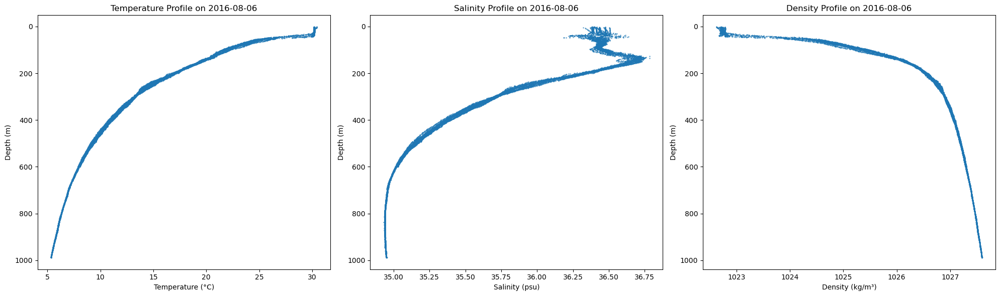

In [3]:
# Glider: load, clean and some plots
# path = "/home/jmiranda/SubsurfaceFields/Data/subset/"
path = "/home/jmiranda/SubsurfaceFields/Data/LCE_Poseidon/"
# Get a list of all files and directories in the folder
all_files = os.listdir(path)
# Filter only the files with the .nc extension
nc_files = [file for file in all_files if file.endswith('.nc')]

variables = ['pressure', 'depth', 'time', 'lat', 'lon', 'salinity', 'temperature', 'density']

# Load and join data
ds = load_join_clean(path, nc_files, variables, num_files=len(nc_files))

# Plot profiles for a specific day
day = pd.to_datetime('2016-08-06').date()  # Modify this to the day you're interested in
plot_profiles(ds, day)

In [4]:
# compare_profiles(p1, p2, depths, title, labelone, labeltwo, figsize)

In [5]:
# Calculate the pressure difference for each row compared to the previous row
ds['pres_diff'] = ds['pressure'].diff()

# Determine whether each row is part of an ascent or descent
ds['direction'] = np.where(ds['pres_diff'] > 0, 'descent', 'ascent')

# Assign a unique profile ID to each ascent/descent
ds['profile_id'] = (ds['direction'] != ds['direction'].shift()).cumsum()

# Get median latitude and longitude for each profile
medians = ds.groupby('profile_id')[['lat', 'lon']].median()

# Get the global minimum and maximum values for temperature, salinity, and depth
temp_min, temp_max = ds['temperature'].min()-1, ds['temperature'].max()+1
salinity_min, salinity_max = ds['salinity'].min()-1, ds['salinity'].max()+1
depth_min, depth_max = ds['depth'].min(), ds['depth'].max()+50

# Function to plot individual profiles
def plot_individual_profiles(df, profile_id):
    df_profile = df[df['profile_id'] == profile_id]
    
    fig, axs = plt.subplots(1, 2, figsize=(10, 6))
    
    variables = ['temperature', 'salinity']
    titles = ['Temperature Profile', 'Salinity Profile']
    ylabels = ['Temperature (°C)', 'Salinity (psu)']
    x_lims = [(temp_min, temp_max), (salinity_min, salinity_max)]
    colors = ['r', 'b']
    
    for i, var in enumerate(variables):
        axs[i].plot(df_profile[var], df_profile['depth'], color=colors[i])
        axs[i].set_title(f'{titles[i]} for Profile {profile_id}')
        axs[i].set_xlabel(ylabels[i])
        axs[i].set_ylabel('Depth (m)')
        axs[i].set_xlim(x_lims[i])
        axs[i].set_ylim(depth_max, depth_min) # Inverted to display depth correctly
        # axs[i].invert_yaxis()
    
    plt.tight_layout()
    plt.show()

# # Test the function with a specific profile_id
# for i in range(max(ds['profile_id'])):
#     plot_individual_profiles(ds, i+1)

In [6]:
def get_altimetry(lat, lon, aviso_data, lats, lons):
    # Create an interpolator for the aviso_data using the lats and lons arrays
    interpolator = RegularGridInterpolator((lats, lons), aviso_data.values, bounds_error=False, fill_value=None)

    # Find the altimetry value for the given coordinate pair using the interpolator
    altimetry_value = interpolator([[lat, lon]])

    return altimetry_value[0]

Closest time index: 5
_show_var_names = True


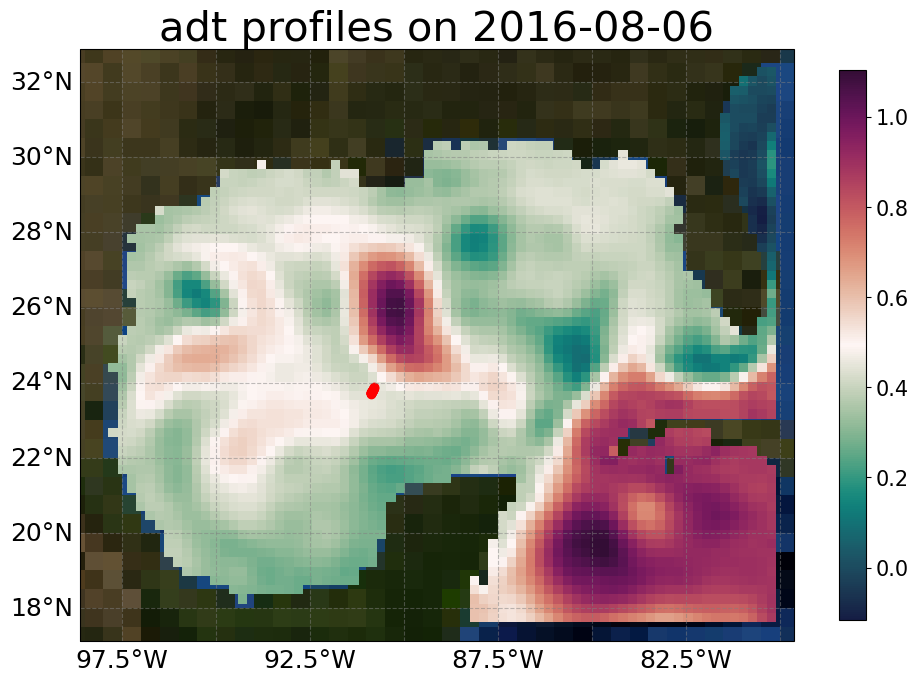

lat			lon			altimetry_value
23.711061629784933	-90.88256967420153	0.44261836984726677
23.7177979700791	-90.88092863431406	0.4423370805894643
23.72648389287467	-90.87756464729546	0.4420058955493146
23.751407368243132	-90.86422468384664	0.4411335392280079
23.760529689151486	-90.85860078462103	0.4408779460719157
23.719367188918227	-90.88275302156612	0.4422173056034493
23.719888141962016	-90.88233607834349	0.44220269660498523
23.73414457620826	-90.87358847433005	0.44172973924970094
23.74286784886604	-90.86849895254255	0.44142287701104765
23.76972943740208	-90.85357564040902	0.4406346151579929
23.778561396597887	-90.84828177965622	0.44044384804581993
23.788664591783437	-90.84306254190822	0.440232891085111
23.798147621831518	-90.83869228610189	0.44004539070276333
23.808523865877675	-90.83334309893289	0.4398941766536509
23.817475648793142	-90.82836694768986	0.43980830325726367
23.860164293936172	-90.80914150704552	0.43952943464832994
23.875227661241002	-90.80185239818273	0.43960214370432604
2

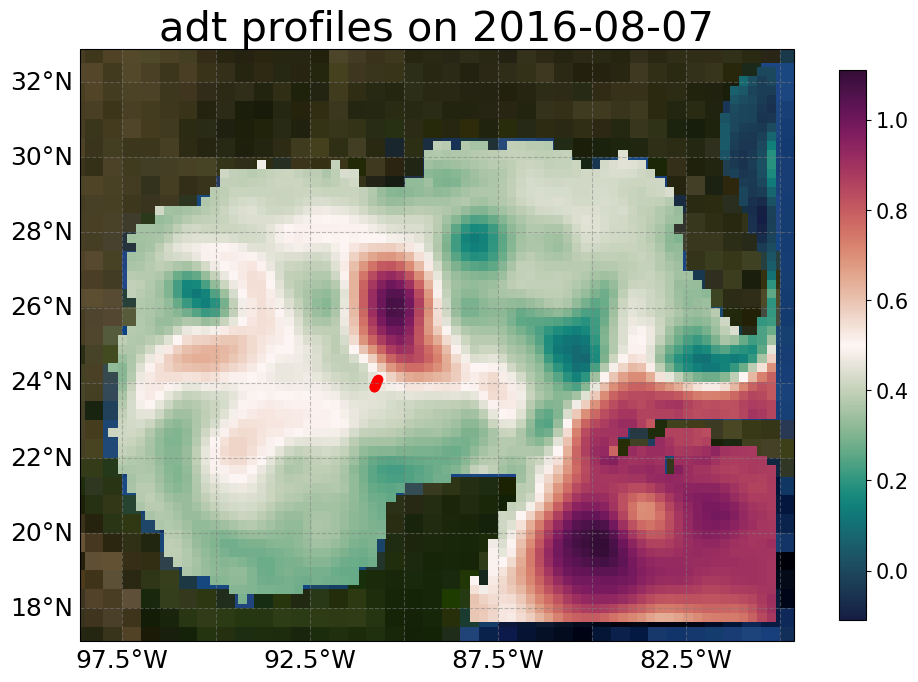

lat			lon			altimetry_value
23.875227661241002	-90.80185239818273	0.45119675189254155
23.889077920143958	-90.79599722318613	0.4527923902714826
23.904757611456755	-90.78873026390738	0.45479492783111586
23.920253824738378	-90.78153070281859	0.45691631272225547
23.93695262124212	-90.774375152273	0.45927688382486165
23.955148576491638	-90.76746555162845	0.4618888986396313
23.971873627779615	-90.75873379082606	0.4648032488139444
23.990265921648593	-90.7506531582725	0.4679620647304793
24.007115299233917	-90.74138377559953	0.471354068759682
24.026117414798886	-90.73325254883233	0.47496953519931207
24.04330285481292	-90.72588001128506	0.47840960898035056
24.062002169023415	-90.71821284783185	0.4822569528007061
24.078921507837237	-90.71046788315297	0.48607386663450525
24.09639914669788	-90.70307034034704	0.49004700390249156
Closest time index: 7
_show_var_names = True


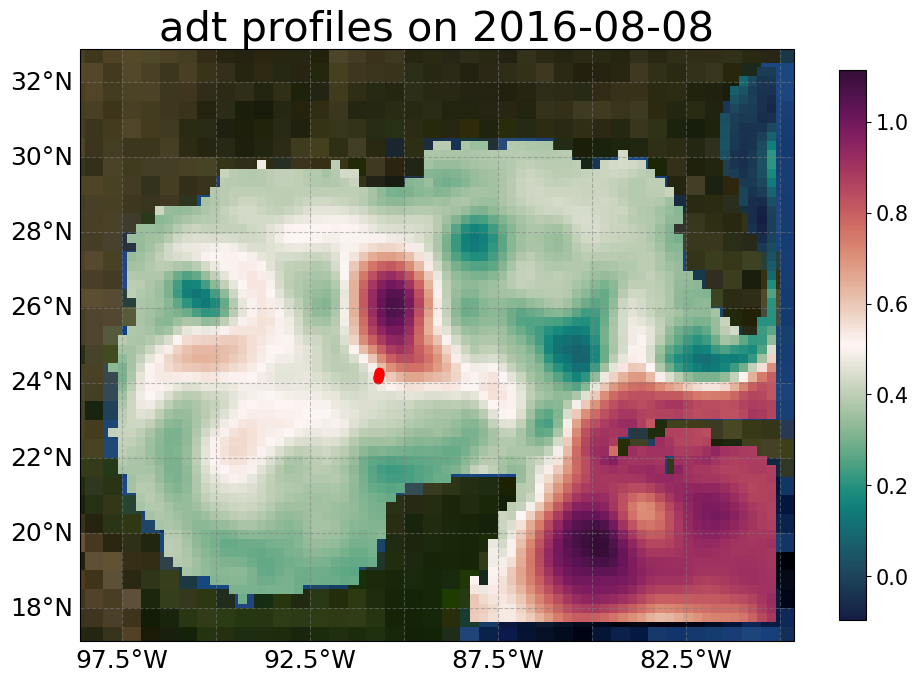

lat			lon			altimetry_value
24.09639914669788	-90.70307034034704	0.5131267671225888
24.112594075790913	-90.69764887408247	0.5173534965868459
24.132496833782707	-90.69439225783343	0.5225243466503487
24.150421719661097	-90.68954035049907	0.52901869228691
24.17116461624348	-90.6844910010472	0.5364527553816206
24.18979309320253	-90.67845113615277	0.5436868902869905
24.211440666365423	-90.67408272825898	0.5513460596539979
24.229778810064204	-90.66702477019808	0.5590281324779284
24.294121209750426	-90.65498741541654	0.582235411317655
24.2540194324645	-90.66416347669882	0.5671115004674401
24.270825596005558	-90.65720029362076	0.5745152129793798
Closest time index: 8
_show_var_names = True


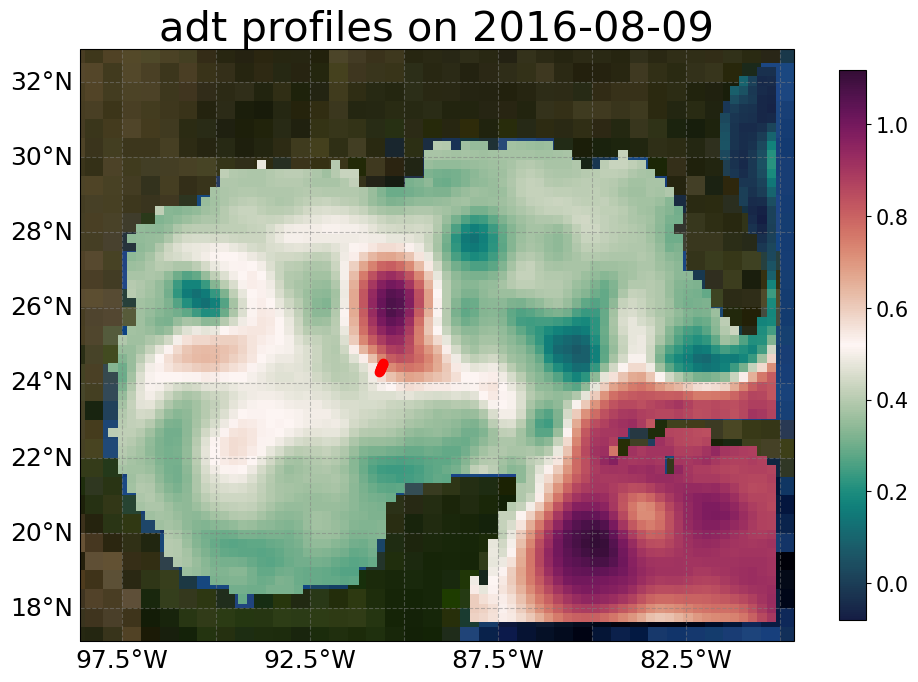

lat			lon			altimetry_value
24.294121209750426	-90.65498741541654	0.610992081859427
24.311968137027684	-90.6478674077923	0.6191664782405804
24.329831109111318	-90.64148616686737	0.6271801506559438
24.34533795371989	-90.63322172210714	0.6353311902064047
24.36210238185248	-90.62740260834565	0.6430017437161744
24.377141206559774	-90.62018901855392	0.6502826151767129
24.419613134666832	-90.60135887592872	0.6703674786651159
24.432859500063238	-90.59386200997042	0.6771321408662351
24.392714304759046	-90.61508770869257	0.6570962130484727
24.40558814696059	-90.60782172378815	0.6636573356915486
24.475706781401357	-90.57337287095442	0.697892062318664
24.487280357032287	-90.56706078353206	0.7037428354794881
24.501706877454275	-90.56307276333612	0.7098539175863439
24.51381196121247	-90.55587982819702	0.716159897347338
24.44755043991402	-90.58767570273896	0.6839907671888524
24.460794964956595	-90.5795164822	0.6909642240831496
Closest time index: 9
_show_var_names = True


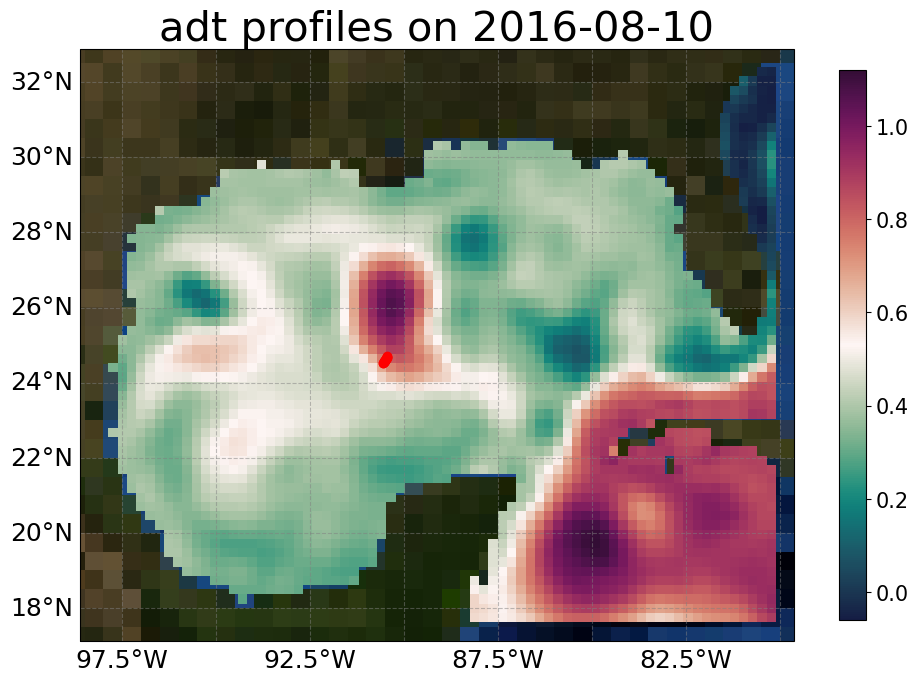

lat			lon			altimetry_value
24.51381196121247	-90.55587982819702	0.7339624752855856
24.57493589829866	-90.52211483095296	0.7618525744955098
24.586891339828632	-90.51339304043952	0.7678427524288371
24.52734329630606	-90.55045729821596	0.739615493506144
24.538894641708964	-90.54215319863562	0.7453799675670425
24.550850941787928	-90.5364611434615	0.7506021270666647
24.562063691769993	-90.52830740010285	0.756217558376144
24.652660547566555	-90.47541739784451	0.7968624128262356
24.66536564460174	-90.46629781876571	0.8024937974602057
24.62595392118702	-90.49150915133535	0.7856697274180049
24.638602897927825	-90.48260417892676	0.791314417651128
24.599812942261227	-90.5069254826824	0.7735595850035448
24.612129565005127	-90.49830513996818	0.779633055798882
24.704182227695245	-90.44491895303736	0.8178771837289152
24.679308159010297	-90.45978896461159	0.8077680195176421
24.691574138336403	-90.45131116597513	0.8130478263284205
Closest time index: 10
_show_var_names = True


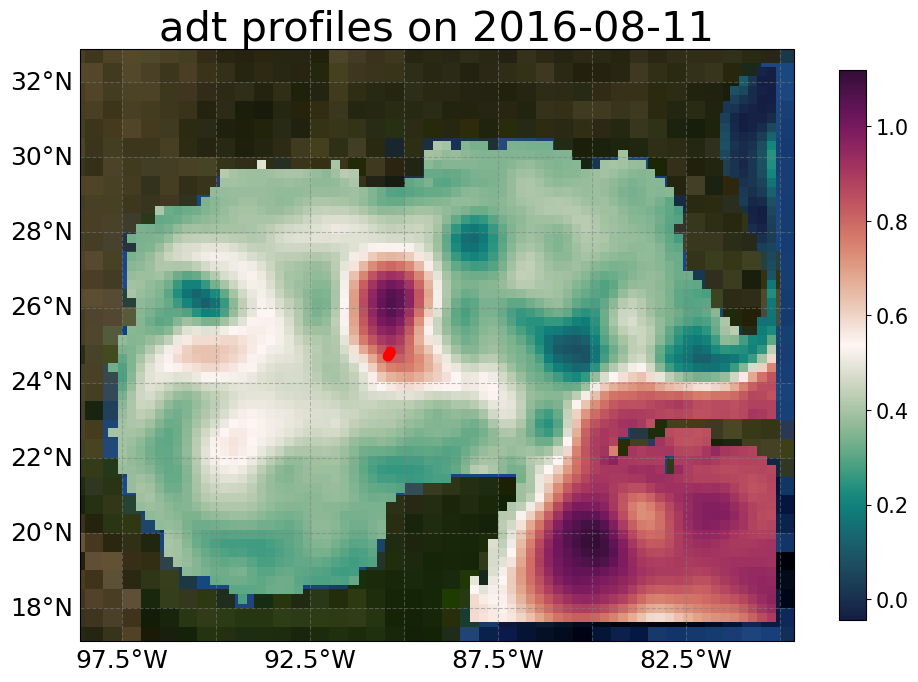

lat			lon			altimetry_value
24.704182227695245	-90.44491895303736	0.8240835239323423
24.715621586745648	-90.43666011251943	0.8283953358222711
24.726427087632366	-90.42954570191299	0.8323035638772497
24.737241639196995	-90.4216152869154	0.8363399167973125
24.792757345230434	-90.38921230267101	0.8550590444590916
24.803608838070566	-90.38122423927739	0.8589322665998096
24.748988301608726	-90.41572978419528	0.8401750969833276
24.76021489293829	-90.40857548462479	0.8441000418777647
24.771220193268167	-90.40313570427197	0.8476292992048944
24.781688480196017	-90.39566200013184	0.8513829692528163
24.834453691724697	-90.36515490760067	0.8663082438426042
24.843735933439635	-90.36379850465137	0.8682717753248897
24.81426777982155	-90.37550565031476	0.8623315510070091
24.824236954395506	-90.36824727431511	0.8642373940450575
Closest time index: 11
_show_var_names = True


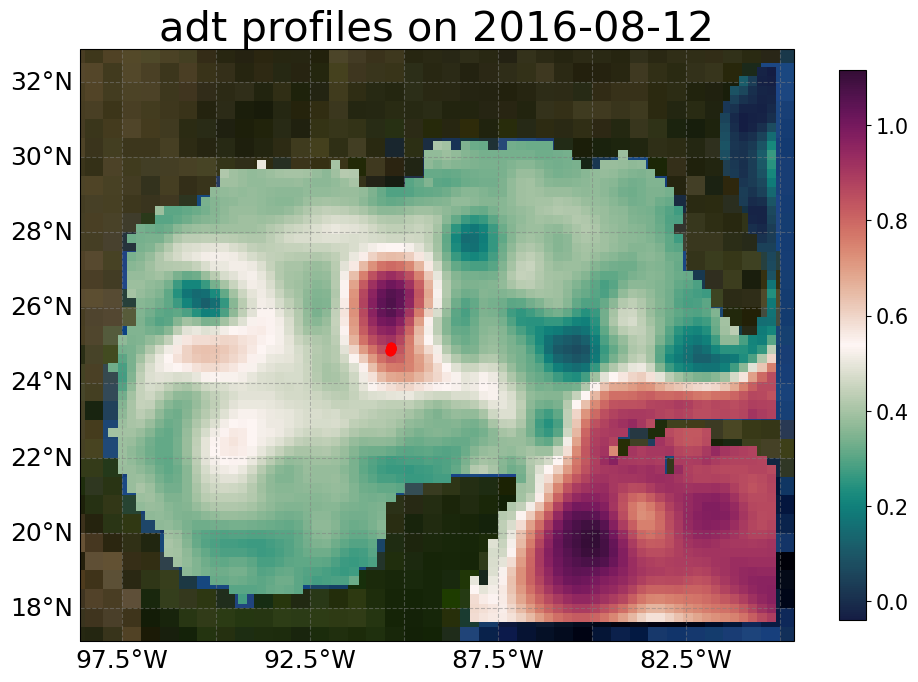

lat			lon			altimetry_value
24.850228091549376	-90.36377738512441	0.8612782064029708
24.858084656875988	-90.36235317932608	0.8625133629908378
24.843735933439635	-90.36379850465137	0.8601050813804906
24.867427940751515	-90.36218208711368	0.8641786403729061
24.876929021788577	-90.35922523071675	0.8654893636707344
24.904304799671316	-90.35226509941347	0.8694209886769959
24.9141329486894	-90.34859929706924	0.8706417704513397
24.885788935945246	-90.35681169892185	0.8667487329910321
24.895474864087905	-90.35397850338458	0.8680870319574582
24.92370319187637	-90.3467021863013	0.8720620496920636
24.933491170575028	-90.34232999839107	0.8731416796108309
24.942762869187696	-90.33977603639674	0.8743879641502413
24.953178586839233	-90.3372704650845	0.8758314684215608
24.961617867842314	-90.33546315315095	0.8770272900748384
Closest time index: 12
_show_var_names = True


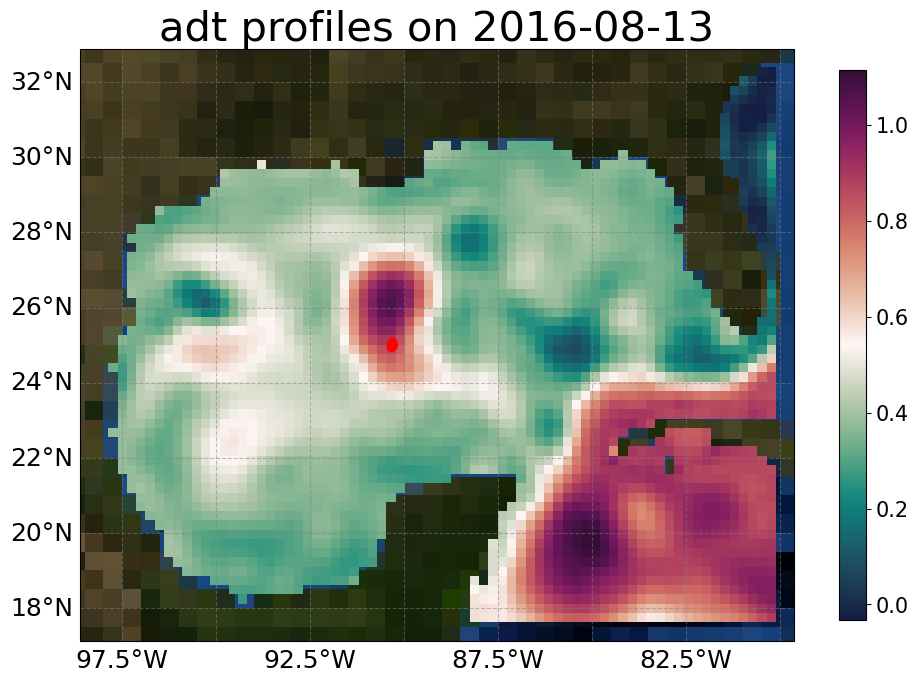

lat			lon			altimetry_value
24.961617867842314	-90.33546315315095	0.8625873642645401
24.970589890730594	-90.33417073568094	0.8638770736074294
24.97851317980571	-90.33187495982116	0.8647665977557507
24.985824219387435	-90.33046301069191	0.8657340447316595
24.992636371632774	-90.329233618541	0.8666512141598063
25.00055094470794	-90.32895727768157	0.8679634318563669
25.006368935821655	-90.32894716592565	0.8689696495560543
25.0131525739394	-90.32816340142693	0.8699739288155841
25.03306382068986	-90.32504026811134	0.872729717741836
25.04138937193966	-90.32344133319164	0.873810944277261
25.019094501667578	-90.32688910379115	0.8707231006116518
25.027009753312967	-90.32442693547146	0.8715485067307036
25.048317764420425	-90.32190703731231	0.874661935201477
25.05680555641925	-90.3190570554518	0.8754811711537286
25.064263039995858	-90.31971980011303	0.8769126451200047
25.07102455986201	-90.32008641670757	0.8781584930116373
Closest time index: 13
_show_var_names = True


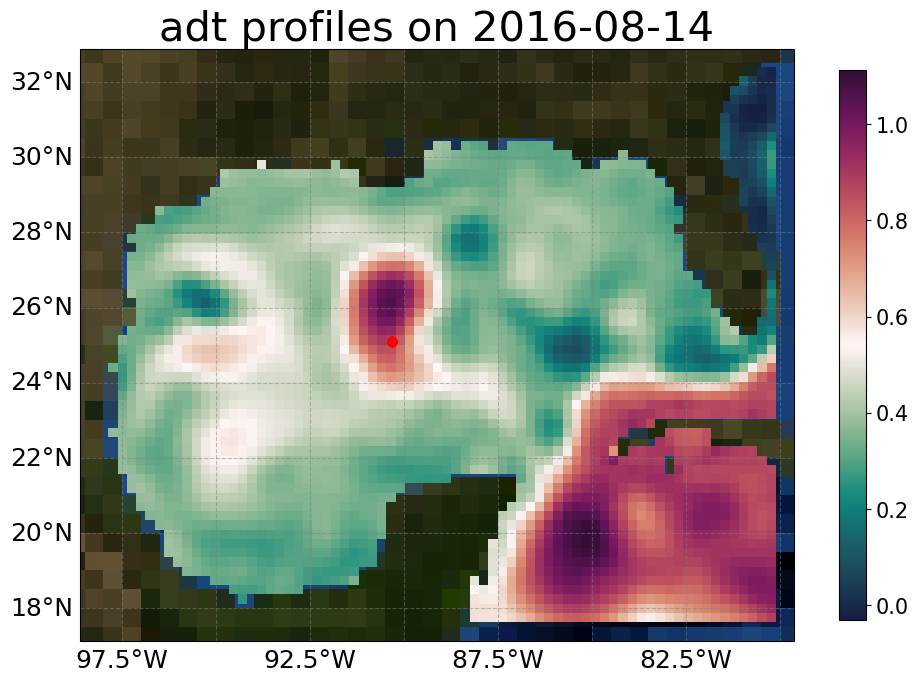

lat			lon			altimetry_value
25.088116217146165	-90.31879021281634	0.8638214408143996
25.09115874594542	-90.31859280722853	0.8642734076865763
25.07102455986201	-90.32008641670757	0.8613302265132178
25.077266095195352	-90.3210717107734	0.8626260350988612
25.08308870560532	-90.32006208801155	0.8633248689690095
25.094481552374397	-90.31893645183	0.8649154981229686
25.0964251485763	-90.31838140594915	0.8650901557193886
25.10366942907255	-90.31581741824387	0.8656078033806779
25.106326176905547	-90.31525330420985	0.8658972361841024
25.099140730241437	-90.31765008965829	0.8653456717849872
25.10131035950652	-90.31708810513673	0.8655555410728675
25.107856098847947	-90.3154297404942	0.8661975065079663
25.110651227271468	-90.31413674464814	0.8663150293408466
Closest time index: 14
_show_var_names = True


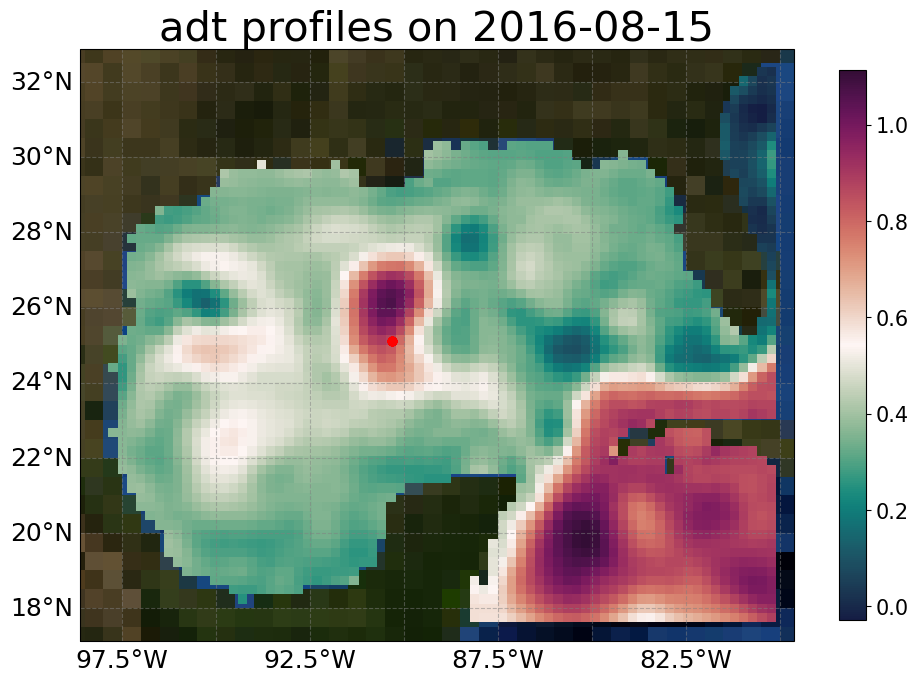

lat			lon			altimetry_value
25.11055287269832	-90.31511394070752	0.8492644671003466
25.11191429975238	-90.31614186101706	0.8498069057176523
25.11296507630285	-90.31613588195671	0.8499850961542922
25.113891847913013	-90.31672092308881	0.8503199499660847
25.116710870559	-90.32282294855621	0.8526406132332386
25.117226779673047	-90.32326195965575	0.8528613920458217
25.11651192124127	-90.3230700085256	0.8526808671290795
25.117842011388	-90.32198758195956	0.8525831371136992
25.113277719192357	-90.3197452438005	0.8511249989387344
25.114832345624027	-90.32136691597826	0.8518798159723981
25.11727815922679	-90.32319240923435	0.8528492642324762
25.118489391480743	-90.32401541554226	0.85330512566916
Closest time index: 15
_show_var_names = True


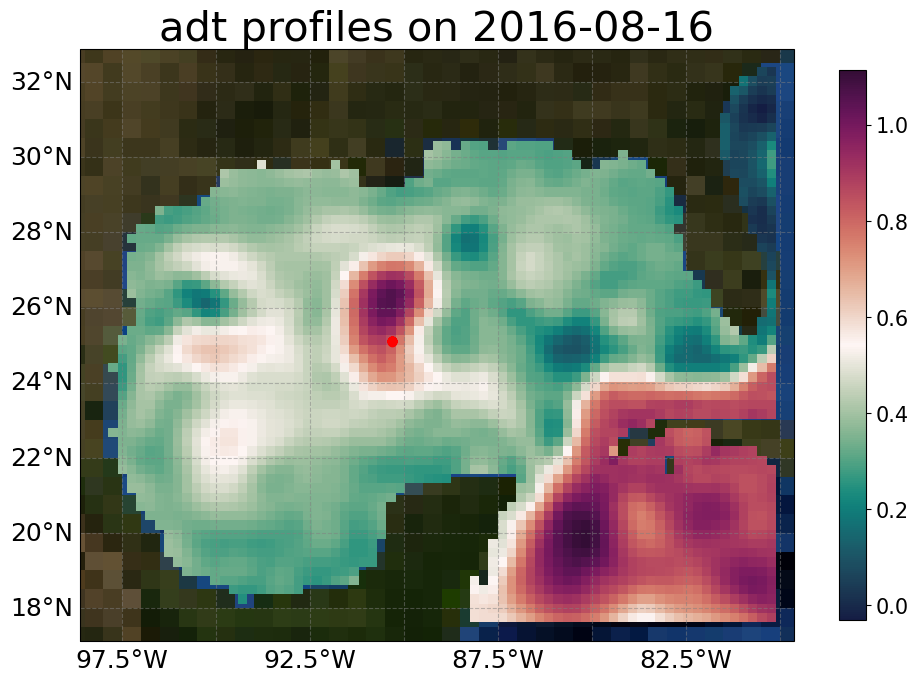

lat			lon			altimetry_value
25.118315194743808	-90.32599221225937	0.8365047042293112
25.117135641261584	-90.32675773678058	0.836534187781696
25.113815160214216	-90.32811662943854	0.836355133275634
25.112305083591725	-90.32604593993953	0.8353878418850942
25.118489391480743	-90.32401541554226	0.8358865180622223
25.104447787423027	-90.32275957392847	0.8328210889056089
25.10246761043677	-90.321424766507	0.8320069845792718
25.107631479408365	-90.32422372746159	0.8339049508077199
25.106494825745237	-90.323155112268	0.8333380667000704
25.111096194956627	-90.32551304316709	0.8349840266164701
25.109505998824176	-90.32496095265881	0.8345018636732964
25.099046583250026	-90.32097465170378	0.8312123429414833
25.096626747545987	-90.32341921967429	0.8315616606083571
Closest time index: 16
_show_var_names = True


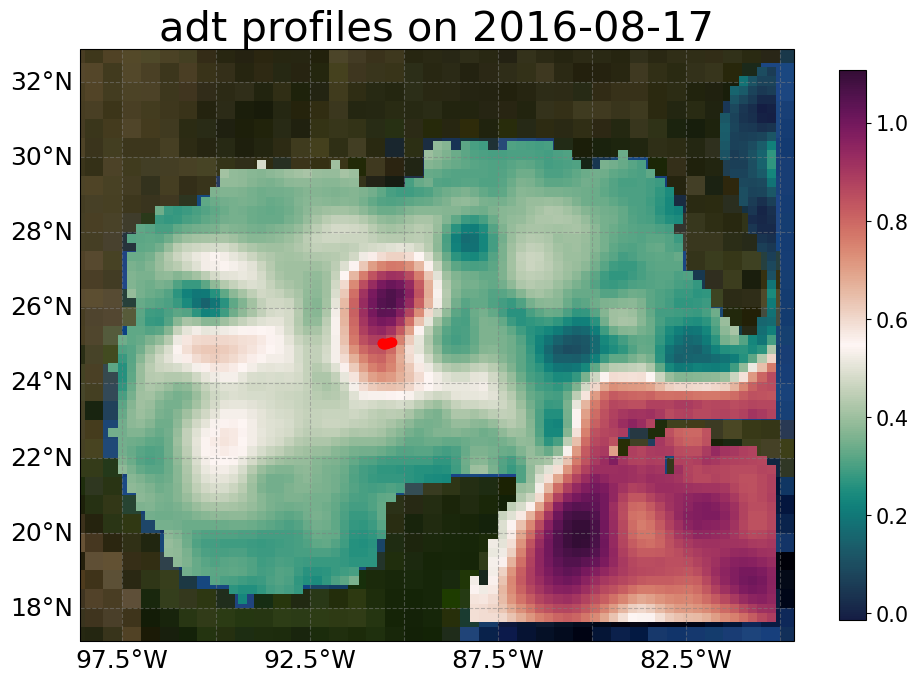

lat			lon			altimetry_value
25.096626747545987	-90.32341921967429	0.8185365629623389
25.074117183741414	-90.3751399185684	0.8331810463882793
25.066992772288796	-90.39522097008862	0.8351582762329653
25.088810002859574	-90.33646550610167	0.8217704496019671
25.08127395255871	-90.35570933738644	0.827404072388678
25.052097550718564	-90.45164961754122	0.8418855515738488
25.04779933134271	-90.47166996321891	0.844506349970596
25.043385793166287	-90.49071739442645	0.8469515523794628
25.03935543710077	-90.51037215298608	0.8495933861558005
25.062024246413284	-90.41471660496607	0.837500380503441
25.056358944596457	-90.43371480510862	0.8396346205247456
25.038338080098992	-90.56283983184632	0.8585629400200602
25.04657816701618	-90.57133342945542	0.8615989742988682
25.036868088665926	-90.52931367455079	0.8524224594888137
25.035428712475415	-90.54967155773357	0.8557081498385046
25.053942931366443	-90.57727957960087	0.8640161432459147
25.063032359273535	-90.57936716168422	0.8660827590274778
Closest tim

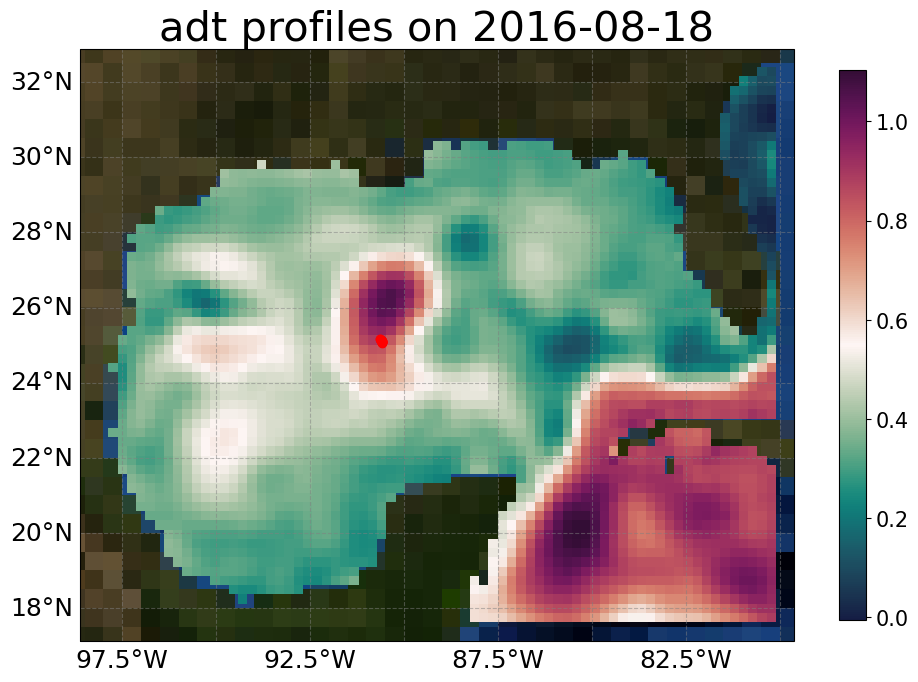

lat			lon			altimetry_value
25.063032359273535	-90.57936716168422	0.858090534467331
25.085725194603203	-90.58734201148108	0.8640693996128859
25.09290794979592	-90.58942692580001	0.8658590750548103
25.070656620051523	-90.58171237456509	0.8600384659985315
25.078760900421237	-90.58488431433607	0.8622398224186604
25.098069034842617	-90.59243825396243	0.867444078173369
25.104943218209822	-90.59499112473021	0.8692562847198626
25.11008711457056	-90.5984740590242	0.8709187898958822
25.113601470380658	-90.60323381165365	0.8725195407838476
25.118334425110646	-90.60880440441635	0.8745005714632128
25.12513955212194	-90.61215843372806	0.8764339240157442
25.145507146463192	-90.62508012848349	0.8840620257086698
25.15339986084207	-90.6272899708029	0.8861094055530956
25.131205003718847	-90.6177405778134	0.8790558362272839
25.138449875318297	-90.62046417484834	0.8814123183169335
25.16071918198361	-90.63091148040252	0.8880392848682268
Closest time index: 18
_show_var_names = True


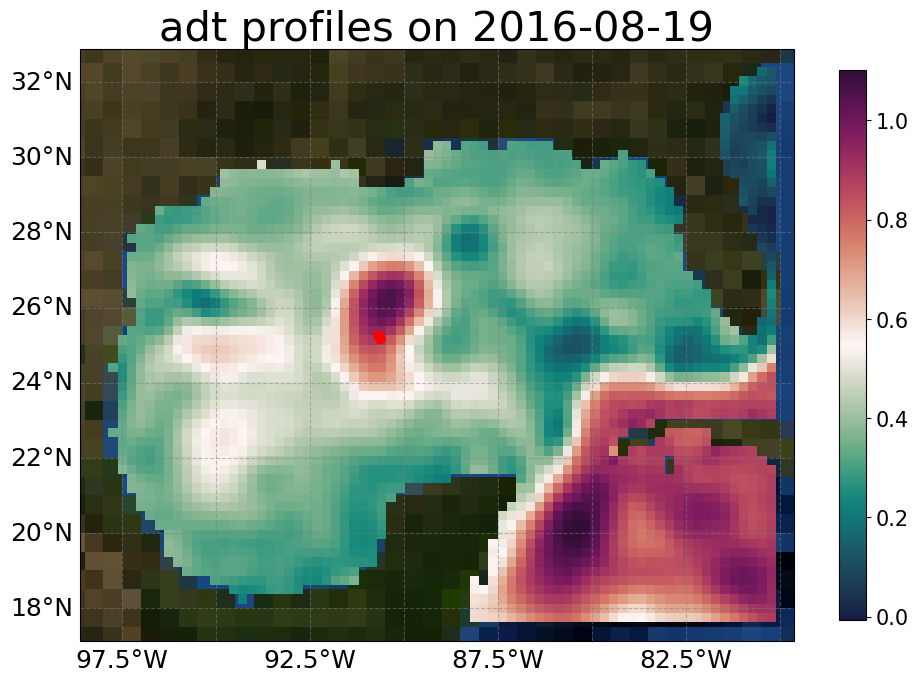

lat			lon			altimetry_value
25.17678682073634	-90.6359170239404	0.8917985427602081
25.184941594951596	-90.6381372932383	0.8939319348588306
25.16071918198361	-90.63091148040252	0.8875363851102686
25.16906100076247	-90.63261240584836	0.8897144862093875
25.19142150588629	-90.64195273633302	0.8956993285273289
25.198654432311848	-90.64464164085547	0.8975985937819522
25.205978351866847	-90.64969830873483	0.8995917662170476
25.213159648752324	-90.6537356794484	0.9014963551377498
25.2194966277737	-90.65956187768776	0.9032338870842924
25.22588948706168	-90.6642713085264	0.9049321640324799
25.26325058184942	-90.6894680635861	0.9144836059070174
25.272122820947644	-90.69171641746759	0.9166143170411676
25.245853772901334	-90.67911361878981	0.9101328715001087
25.25488541013025	-90.68439587753463	0.9124018954478287
25.231994630921555	-90.66918416002278	0.9065500634751428
25.23922730826166	-90.67373206892233	0.908413023444998
Closest time index: 19
_show_var_names = True


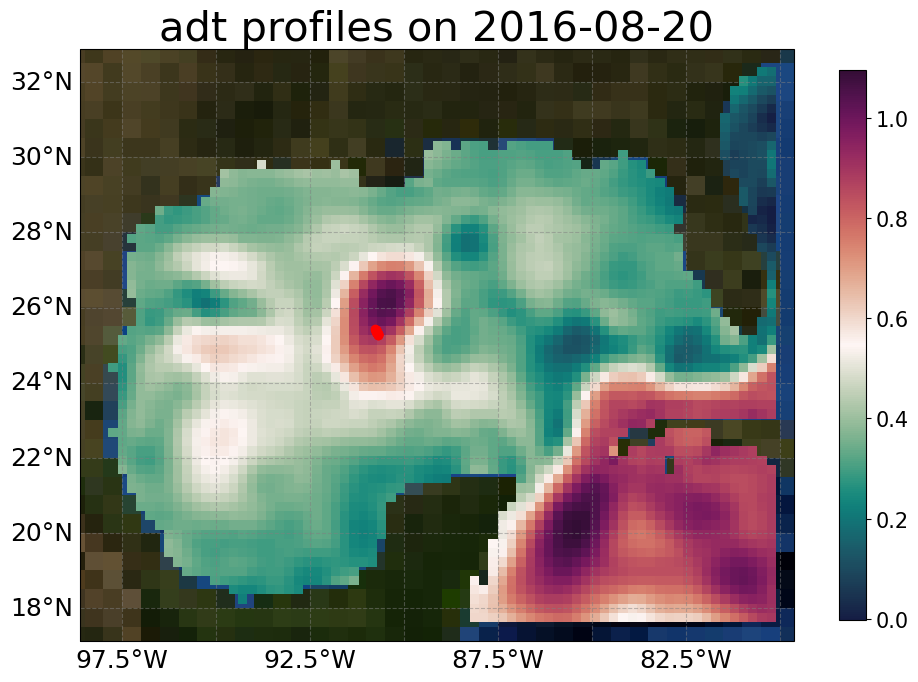

lat			lon			altimetry_value
25.272122820947644	-90.69171641746759	0.9168224431263332
25.314160142172838	-90.71183944455314	0.9284837607844119
25.323348800908143	-90.71635683459627	0.9309602620492803
25.29724394273905	-90.70100776849038	0.9237771560148005
25.30608935334821	-90.70622241942554	0.9262413348093614
25.280176539980946	-90.69443467542374	0.9190597494532435
25.289235453811784	-90.69701045008021	0.921543206518856
25.368132679394066	-90.742186008725	0.9426587777957964
25.380802168160706	-90.74558354185504	0.9454851920935082
25.349575495278977	-90.73071043045638	0.9378950294027237
25.35944319831848	-90.73556647352957	0.9404343432112416
25.33280544203502	-90.7222378728811	0.9335023669340007
25.340741586101927	-90.72594580943789	0.9355882634123353
25.392355660345064	-90.75025555999132	0.9476728165791355
25.405260465246148	-90.75500039994668	0.9500765258002184
25.41613460888578	-90.75819376351694	0.9520780536869939
25.428758814463066	-90.76130978649041	0.9543808361150832
Closest time

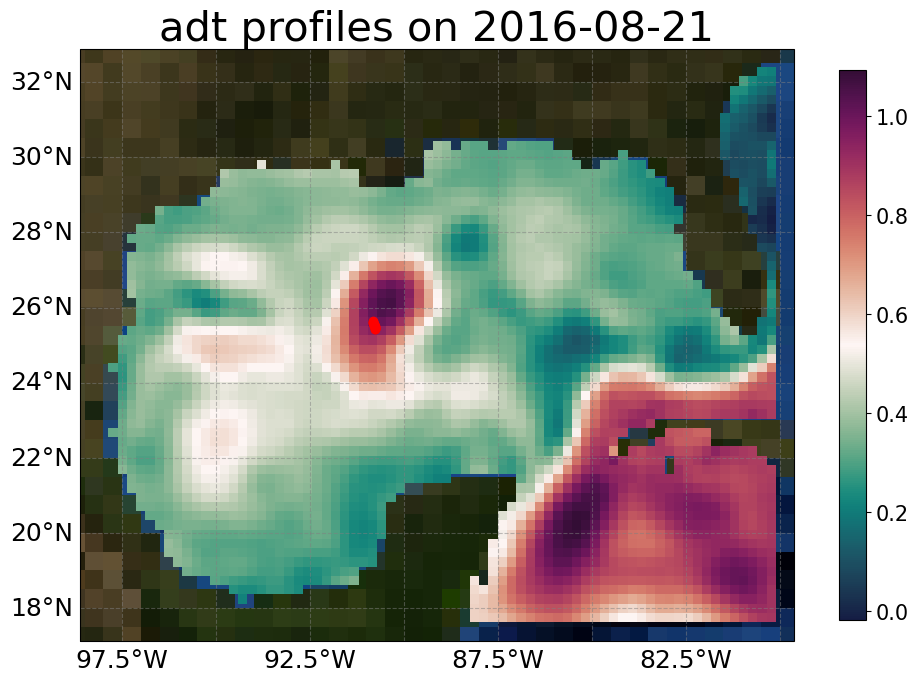

lat			lon			altimetry_value
25.4385637711652	-90.76401205734456	0.9596483284014499
25.451839249408117	-90.76611052892811	0.9621089050204852
25.428758814463066	-90.76130978649041	0.9578197693023959
25.511345321900777	-90.7871607368623	0.972487200938639
25.524606955473477	-90.79221611701793	0.9746560887256293
25.461601655566497	-90.76861425045884	0.9638908016549026
25.473629017338496	-90.77112138115332	0.9660715809984595
25.4851503604151	-90.7766624326975	0.9680651555071967
25.498172075464012	-90.78129814831398	0.9703061872052594
25.601295522549474	-90.81885653611691	0.9863726214502341
25.61970471188021	-90.82095125881355	0.9892751992507525
25.56905300214184	-90.80953996232469	0.981531604586238
25.58443568606023	-90.81409571294594	0.9838629547190483
25.53855493830217	-90.80002318147584	0.9767728668610207
25.55296866112495	-90.80382167310756	0.9790839693098037
25.631872071191154	-90.82010095417237	0.9909535647803976
Closest time index: 21
_show_var_names = True


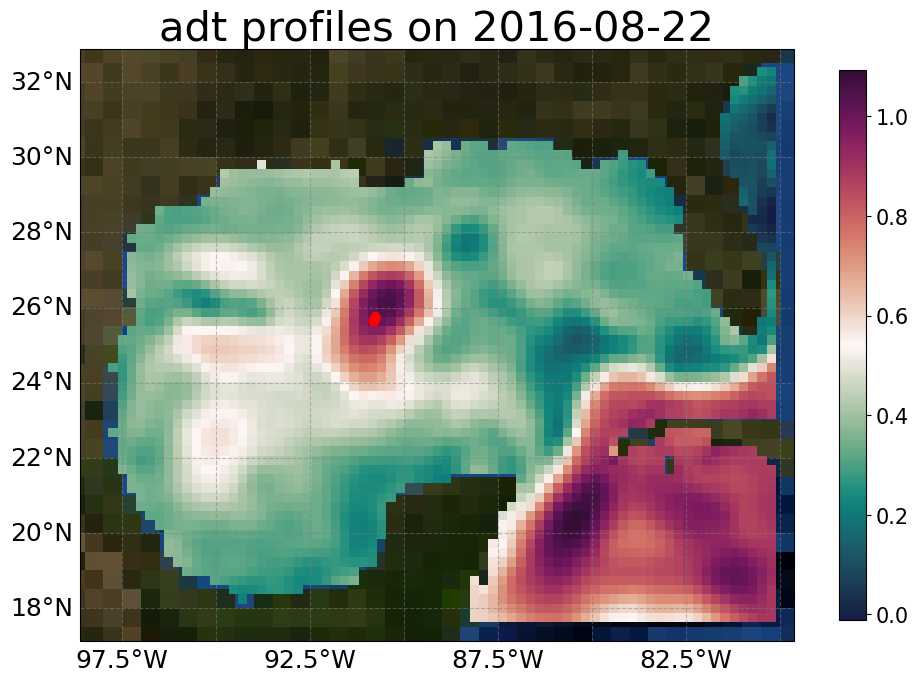

lat			lon			altimetry_value
25.652950601080683	-90.80929091384579	1.0013224499719973
25.663816467818148	-90.80507249352974	1.0026394562786582
25.631872071191154	-90.82010095417237	0.9986991564067741
25.64246989430926	-90.8144750044144	1.0000130017615627
25.67473285334242	-90.80241274673102	1.0038843848140122
25.68432387115739	-90.79962917536061	1.0050222353251692
25.72361486855024	-90.78551206482913	1.0100557337930618
25.732186154866334	-90.78164507627821	1.0112596300622958
25.70733255001682	-90.79127071071639	1.0079390158154546
25.715381421380318	-90.78714016568405	1.0090780658988066
25.692755664126274	-90.79774887348341	1.00599467903322
25.700630267055704	-90.79409369949681	1.0070498507951258
25.75848047301277	-90.77841192268636	1.0142973833337319
25.76803690723946	-90.77558576725927	1.0155652068584005
25.739961120407816	-90.78126632858596	1.012104306561498
25.7494109664448	-90.77810188576568	1.0133679743602568
Closest time index: 22
_show_var_names = True


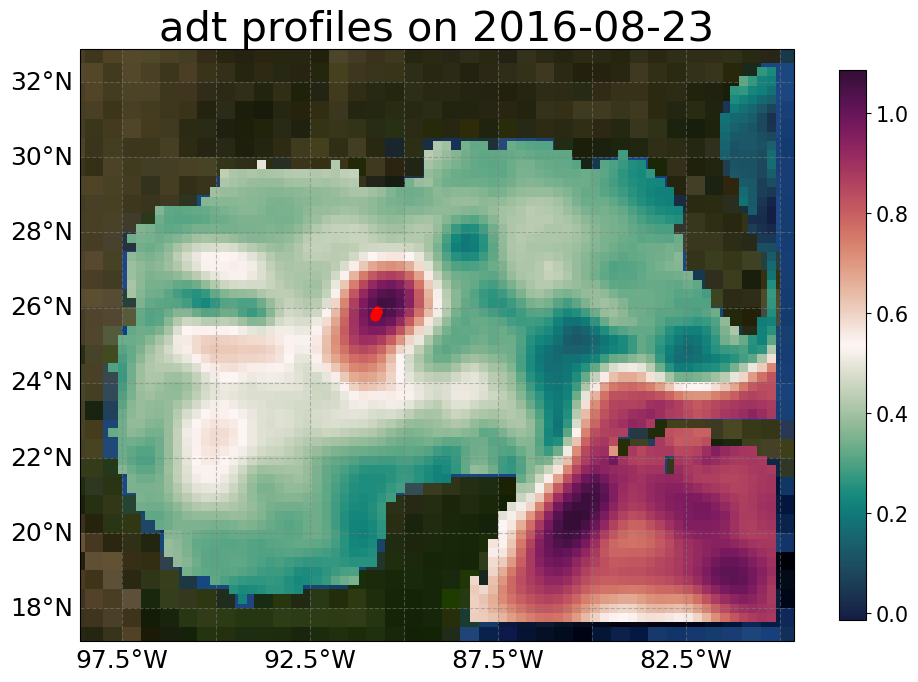

lat			lon			altimetry_value
25.76803690723946	-90.77558576725927	1.0194503645454938
25.77795987065636	-90.77385837046114	1.0205460885641686
25.78716961124208	-90.76771261009391	1.0219801377240103
25.837201711458974	-90.7494917900897	1.0287396951313035
25.848269469851886	-90.74478180324769	1.030374851107316
25.817583393471907	-90.7579351168614	1.0259020736978643
25.828084324438734	-90.75291964909302	1.0274598549529415
25.797372054689546	-90.76570228179186	1.0231598647196303
25.80758723473768	-90.76030172939701	1.0246760247016897
25.90227762684534	-90.72235182569085	1.0363499615153084
25.912726458410656	-90.71600818522768	1.0373573770431546
25.881446557213152	-90.73201897945688	1.0347436225812165
25.893867876250244	-90.72696689326527	1.0356109462477165
25.859039928800186	-90.7409593221734	1.0319100402894215
25.871252050927172	-90.73591428195404	1.0337582874192521
25.920968045068207	-90.71031735851591	1.0382491444837292
Closest time index: 23
_show_var_names = True


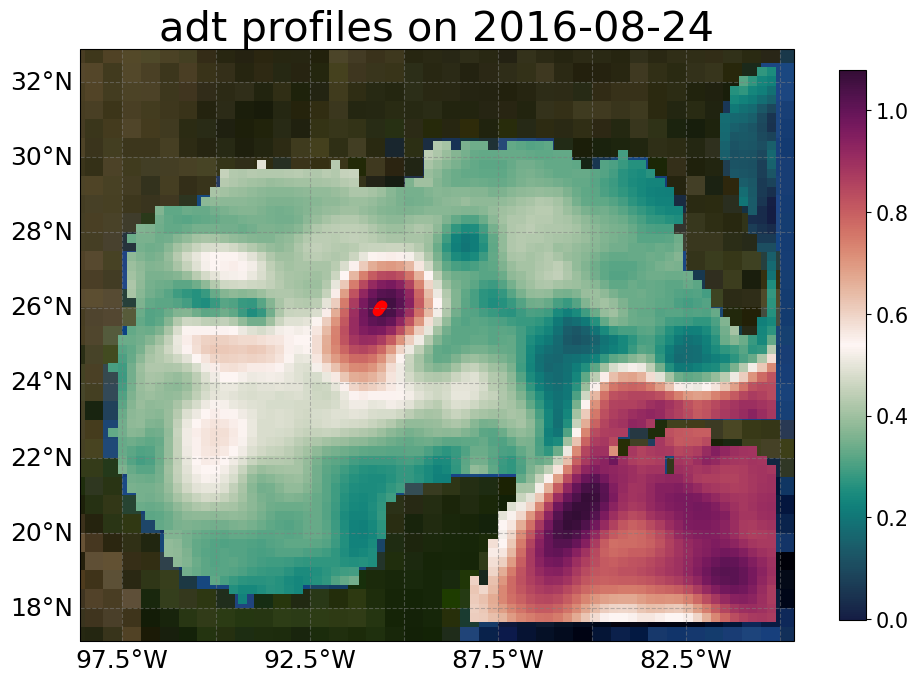

lat			lon			altimetry_value
25.96407059876902	-90.6781470397341	1.0458060118876276
25.975699748926303	-90.67135987219233	1.0466701951102553
25.94343867271185	-90.69727979688912	1.0435167906370442
25.953471134306106	-90.68685388232336	1.0447461779539178
25.920968045068207	-90.71031735851591	1.042007919960694
25.932323008811576	-90.70262678818523	1.0428845843262644
26.010831399994668	-90.64685325320941	1.049899890484126
26.021575934805625	-90.63776357837233	1.0511314718984812
25.98826099814451	-90.66397720043064	1.0476333673399747
25.99873156683413	-90.6558347889059	1.0486961221117574
26.033679736642938	-90.62663936656278	1.0526612772896025
26.045023300261548	-90.6179128128478	1.0528730406646918
26.057837844719344	-90.60771363866398	1.0528801908482721
26.068682319915283	-90.59807451399872	1.0529111576737988
Closest time index: 24
_show_var_names = True


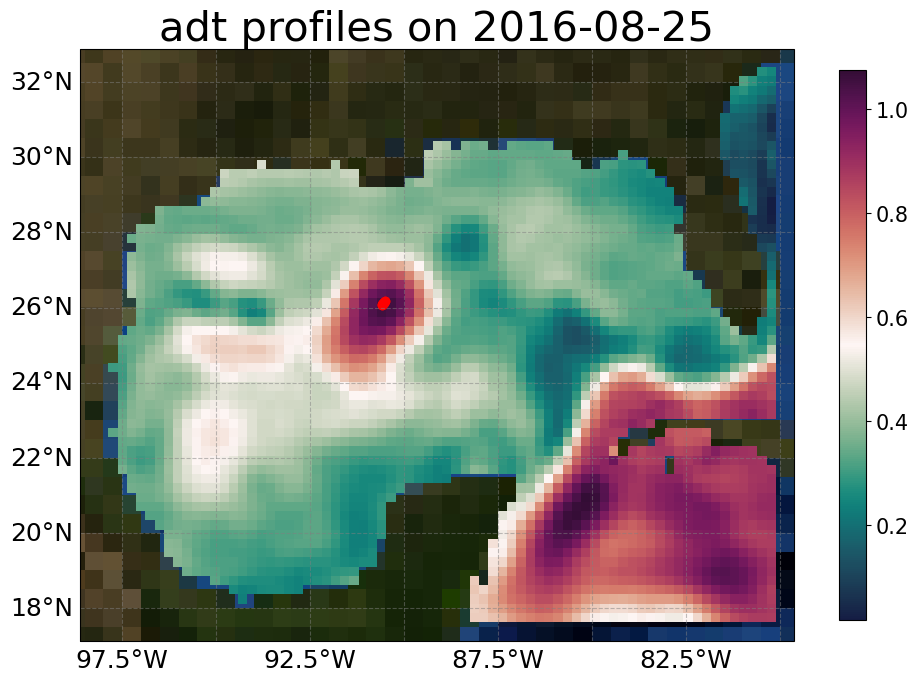

lat			lon			altimetry_value
26.078413558301833	-90.59027901689933	1.0503363205740746
26.088760650724648	-90.5803980489096	1.0501437265704259
26.068682319915283	-90.59807451399872	1.050533984921277
26.09974220237313	-90.56937772817508	1.0499824686246704
26.11036470677506	-90.5591804705681	1.0498789771796022
26.169549659862632	-90.51796924092339	1.0428431237624793
26.18044457607798	-90.51801560029895	1.0411624251579492
26.12352826468499	-90.54738942065813	1.049818483044952
26.133966434830178	-90.53806738563661	1.048377487478618
26.14845068277598	-90.52957696163065	1.0460992556411752
26.158859887300725	-90.52099056558357	1.0444877864604734
Closest time index: 25
_show_var_names = True


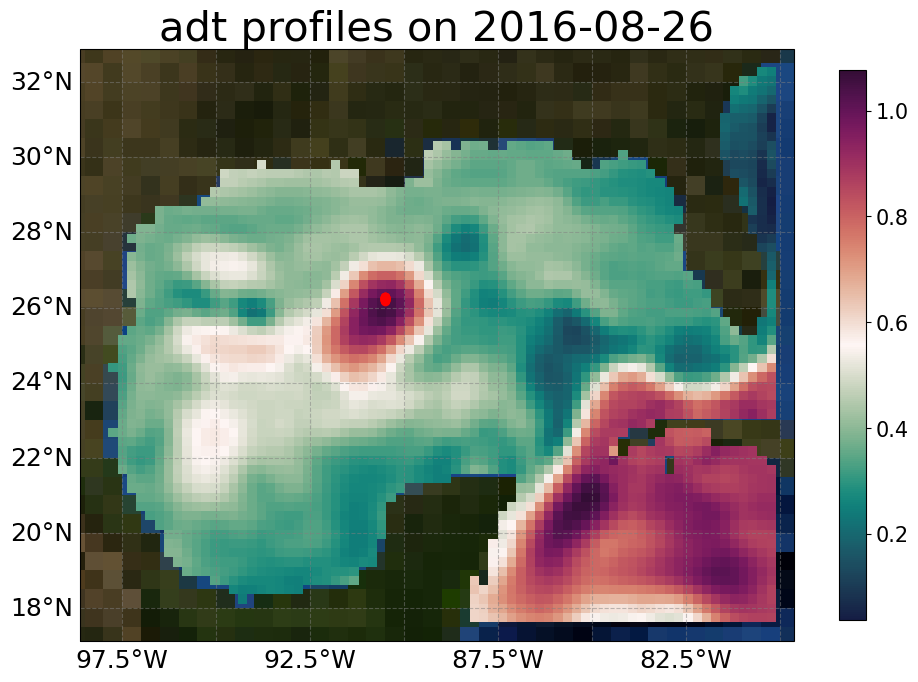

lat			lon			altimetry_value
26.18044457607798	-90.51801560029895	1.033250972097209
26.21154891862827	-90.51162629729566	1.02763219759735
26.222251371418142	-90.50884973334664	1.0257078020317913
26.191897452150602	-90.51759379559769	1.0311849847666352
26.201999742109862	-90.51495550442277	1.029356844689038
26.232348372112924	-90.5057012197768	1.0238979530824452
26.239563837280393	-90.50477795689264	1.022607361541438
26.273359607964444	-90.50075478418387	1.0165793309090019
26.280812645640413	-90.49960159905423	1.0152550778602476
26.26025073744768	-90.50198427951862	1.0189152170306714
26.267036141453897	-90.50127440704362	1.0177059803463222
26.24684308220327	-90.50220882830571	1.0213094905226785
26.253094851248648	-90.50160856375226	1.0201941516353459
26.2878112323829	-90.49778679188199	1.0140174718136763
Closest time index: 26
_show_var_names = True


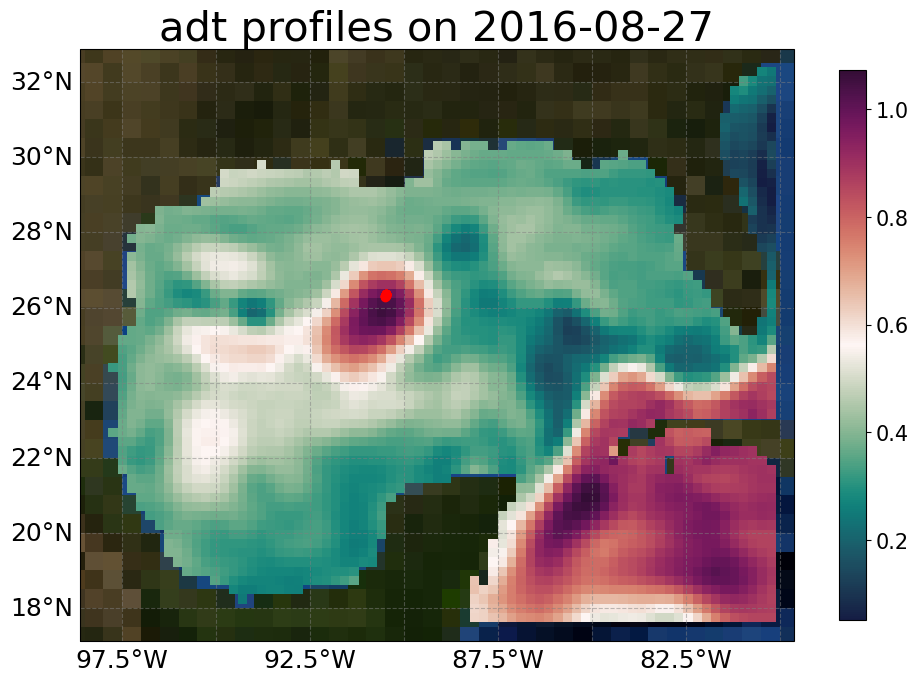

lat			lon			altimetry_value
26.2878112323829	-90.49778679188199	1.002603939532759
26.294626810159233	-90.49843438688993	1.0011852398043581
26.30069790531354	-90.49599963848749	0.9999251508038273
26.309608690193265	-90.49451747256742	0.9980749948642059
26.31725595347672	-90.49176150711253	0.9964920562710773
26.324995820404467	-90.49137323236516	0.9948857130326589
26.33220229620272	-90.4880205333927	0.9934003666456347
26.33815300811193	-90.4863366328932	0.9921721083855752
26.344319760333768	-90.483465797516	0.9909051772598119
26.34928299425379	-90.48230727362115	0.9898820447084066
26.354070371668683	-90.47732778228269	0.9889139718088512
26.359946501966938	-90.47491804857782	0.9877110695619774
26.369846159752584	-90.46766626289411	0.9857066334442113
26.372220381388722	-90.46701844830687	0.9852208853142083
26.363178319573443	-90.47187865504696	0.9870592575816077
26.36706560569471	-90.47144148936064	0.9862591524623847
Closest time index: 27
_show_var_names = True


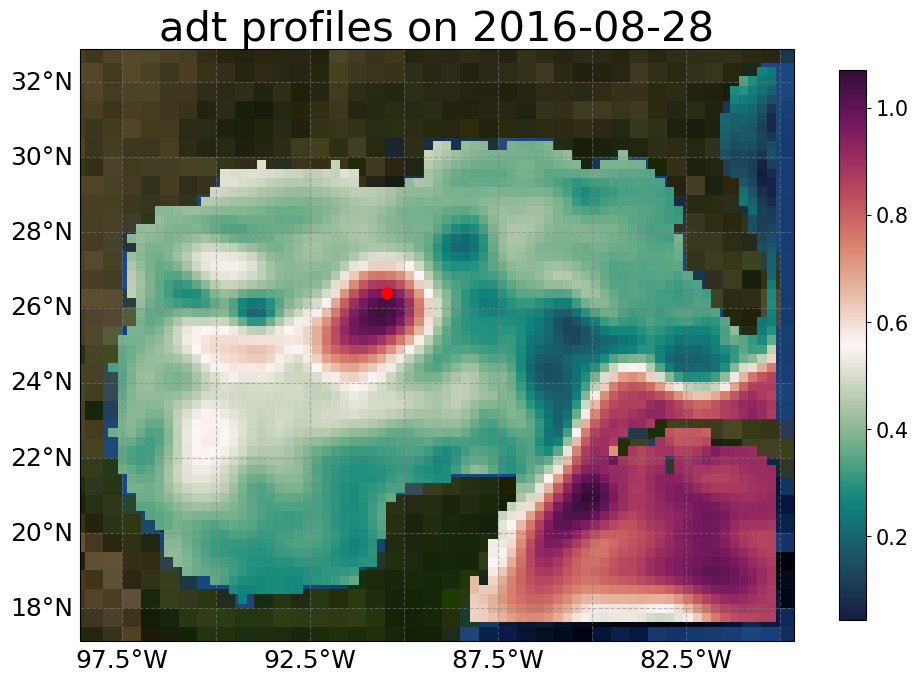

lat			lon			altimetry_value
26.374815819356378	-90.46575848592312	0.9667525708866062
26.375646789035812	-90.46791924774362	0.9664910870807814
26.372220381388722	-90.46701844830687	0.9673992225721433
26.387228001622184	-90.46647160897791	0.9622124297096183
26.391455192749287	-90.46699653089433	0.9606616085451707
26.382027100320794	-90.4696363558981	0.9641599470369883
26.384603812419883	-90.46915185486563	0.9632065157453895
26.37729647913589	-90.46751054528418	0.9658796530734342
26.380527827729296	-90.46883682924944	0.9647035948723895
26.400032951975682	-90.46440636692004	0.957474910714287
26.404367850365986	-90.46348830227129	0.9558681490733282
26.39555866132612	-90.465711164965	0.9591368694812841
26.397684276513694	-90.46618473307507	0.9583593443911309
26.408968097593654	-90.46128329641756	0.9541486252437665
26.4127873396216	-90.46031704860121	0.9527303945652821
26.41624905622645	-90.45732993970957	0.9514199254250433
26.417992632163994	-90.45580630213854	0.9507593254023536
Closest time

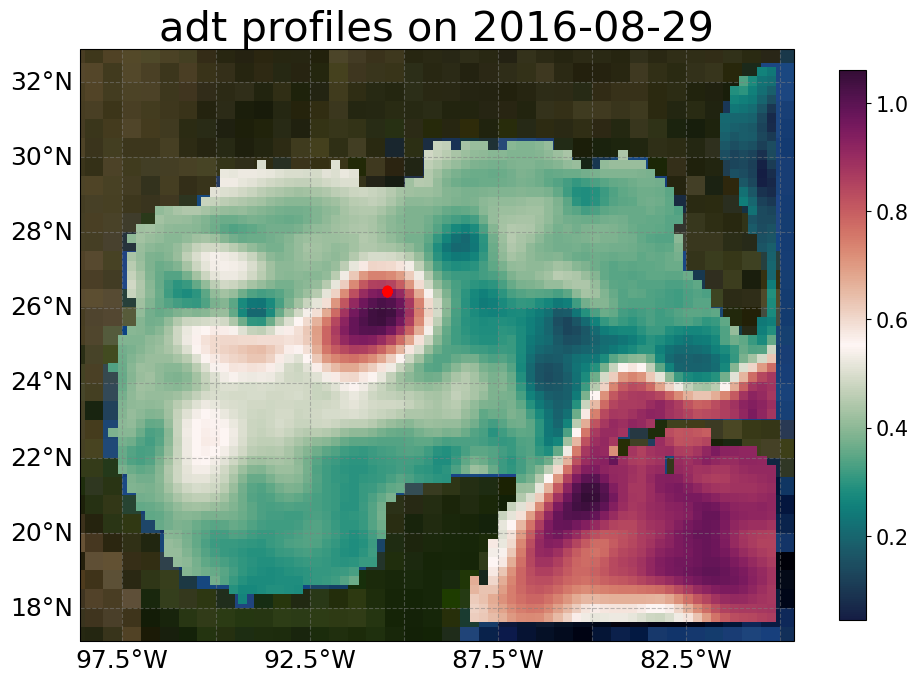

lat			lon			altimetry_value
26.417992632163994	-90.45580630213854	0.9294965821664524
26.4207219990934	-90.45472569456496	0.9283833281727625
26.42316553166076	-90.45630650002654	0.927473821830239
26.426007089229234	-90.45444987612554	0.9262895391411496
26.427807444484984	-90.45578702165722	0.9256255114860179
26.43528802528198	-90.45425101931222	0.922622392780211
26.438646128927594	-90.45502909198572	0.9213250139326195
26.44183964836289	-90.4563513891953	0.9201116530419396
26.445008252865684	-90.4550529608135	0.9188168351624474
26.42957778121816	-90.45591587211922	0.9249318297646186
26.432618856196676	-90.45572554623412	0.9237260357122901
26.45296082107741	-90.45462941046091	0.9156657132759328
26.453806163250217	-90.45425035534835	0.9153189867375529
26.447534863274548	-90.45422130452873	0.9177913127585715
26.45045012361906	-90.45443098874807	0.9166489169476688
26.455706724113714	-90.45323432967376	0.9145336045933983
26.45734052004205	-90.45314678130747	0.913886109331219
Closest time inde

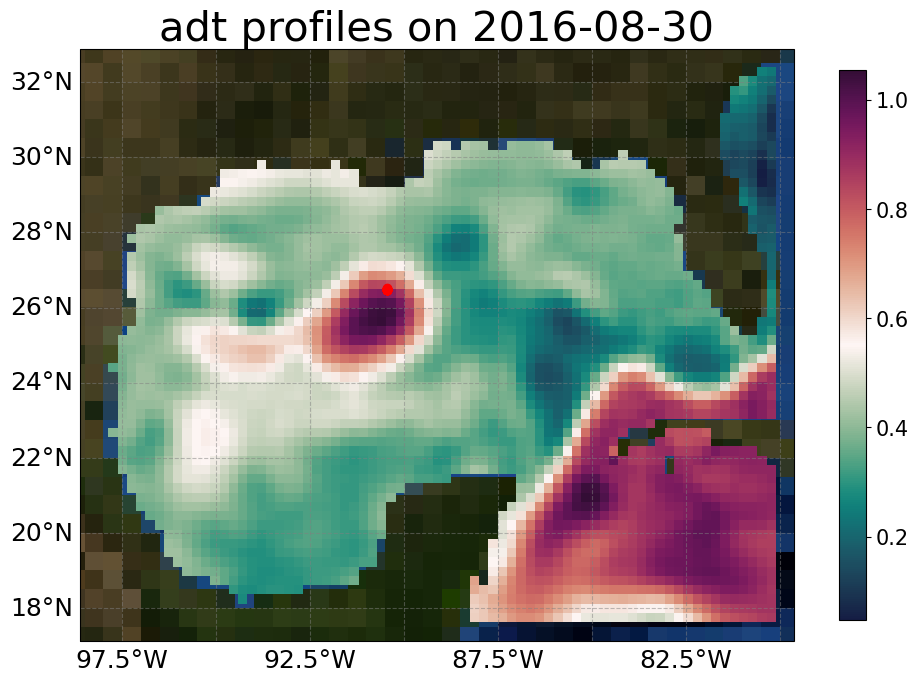

lat			lon			altimetry_value
26.45734052004205	-90.45314678130747	0.8911969566902633
26.459647217980827	-90.45478582976355	0.8903073196462591
26.46038135406784	-90.45540111360083	0.8900296927774538
26.46219963404895	-90.45506973012237	0.8892370130792311
26.464299889851723	-90.45568378402015	0.8883782034481138
26.46872784875653	-90.45543432336439	0.8864795092054982
26.47109455991943	-90.45498515750975	0.8854462186085977
26.482250349394956	-90.45482580523623	0.8806884547596716
26.486545908310664	-90.45531128329802	0.8788891864925223
26.47482549963672	-90.4539867708112	0.8837997611517565
26.478467085092767	-90.45483341892775	0.8822992677996271
26.488962231472485	-90.45379962146818	0.8777695612358862
26.49342004576499	-90.45410685160206	0.8758902041530394
26.504623900045324	-90.45060860576483	0.8709019004364819
26.507798417960785	-90.45220999904782	0.8696495019235484
26.4974644038019	-90.45417936372658	0.8741727852312597
26.501132582504475	-90.45329718610104	0.8725564528008904
Closest time 

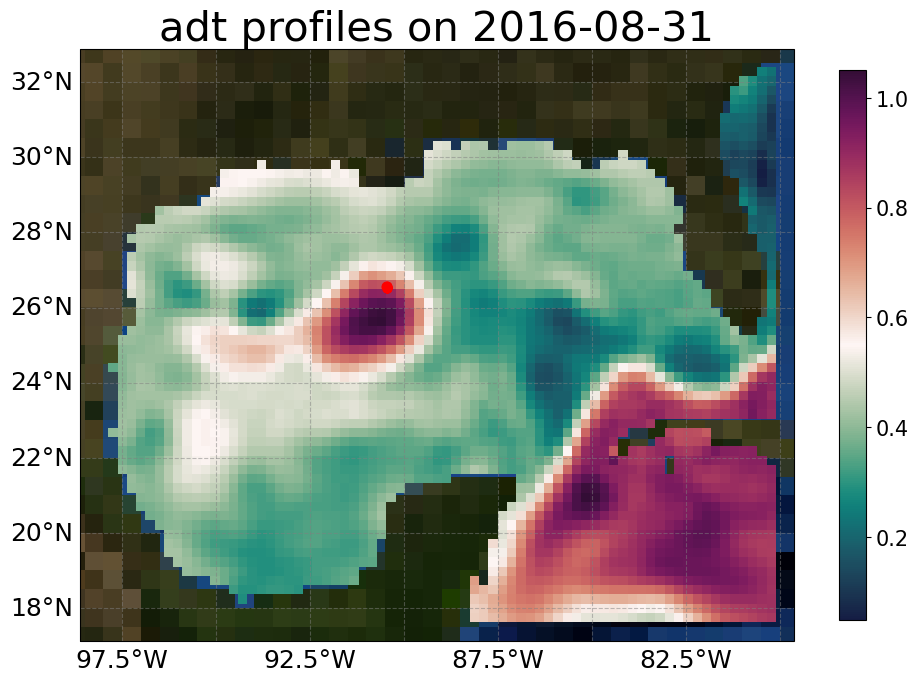

lat			lon			altimetry_value
26.507798417960785	-90.45220999904782	0.844210263095934
26.511735713486743	-90.45295003723938	0.8425583850651504
26.51529124841867	-90.45413207326942	0.8411085563294415
26.53291044466309	-90.46028018329845	0.8339604599239588
26.537514309610835	-90.4606359932995	0.8319927404756078
26.51960474982248	-90.45482025312715	0.8392903961697867
26.52281990483997	-90.45654747184867	0.8380343036540325
26.526757693848698	-90.45836737236974	0.8364732750961308
26.5296888422045	-90.46027357315023	0.8353574611922705
26.542363360351928	-90.46167539046328	0.8299759287955306
26.545321910459243	-90.46499562431441	0.8289703815152609
26.565617138477787	-90.46642935442664	0.8202986296642544
26.571892149151203	-90.4676851630648	0.8176887053227964
26.550805548105348	-90.46607206493265	0.8266847168384127
26.558754696454148	-90.46686621109399	0.8233084281569096
26.577983549851425	-90.46581492401813	0.814888329214728
Closest time index: 0
_show_var_names = True


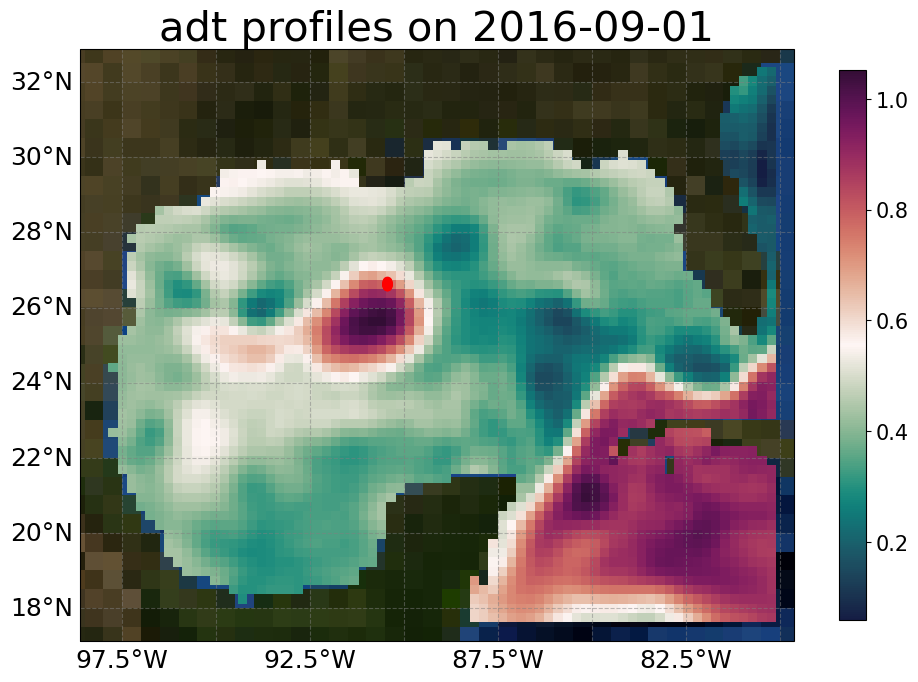

lat			lon			altimetry_value
26.604966956956417	-90.45997708153938	0.7744304416987149
26.612373559486116	-90.45732942985262	0.770691698411001
26.592488079043157	-90.46362674177212	0.7806247973949532
26.59878319397084	-90.46100588526144	0.7774106974987819
26.619999659302742	-90.45640197379468	0.7670510389910068
26.627894421921496	-90.45666216184122	0.7633900847043256
26.577983549851425	-90.46581492401813	0.7875767786634635
26.58480112414594	-90.46433329106034	0.7842582006499123
26.650037338251874	-90.45066222085646	0.7521485535246134
26.657353949685845	-90.44820586135245	0.7483813935935159
26.635878090409694	-90.4542139557167	0.7593013566091525
26.643362843595337	-90.45199616702956	0.7554792552242631
26.664136473192812	-90.44660978659934	0.7449709653443767
26.671601899179485	-90.44597410613515	0.7413497586696582
26.679546097503742	-90.44566779864752	0.7375400544711141
26.68810031265557	-90.44419747094847	0.7333056190185123
26.69445960191552	-90.44043007335884	0.7298488381225499
Closest t

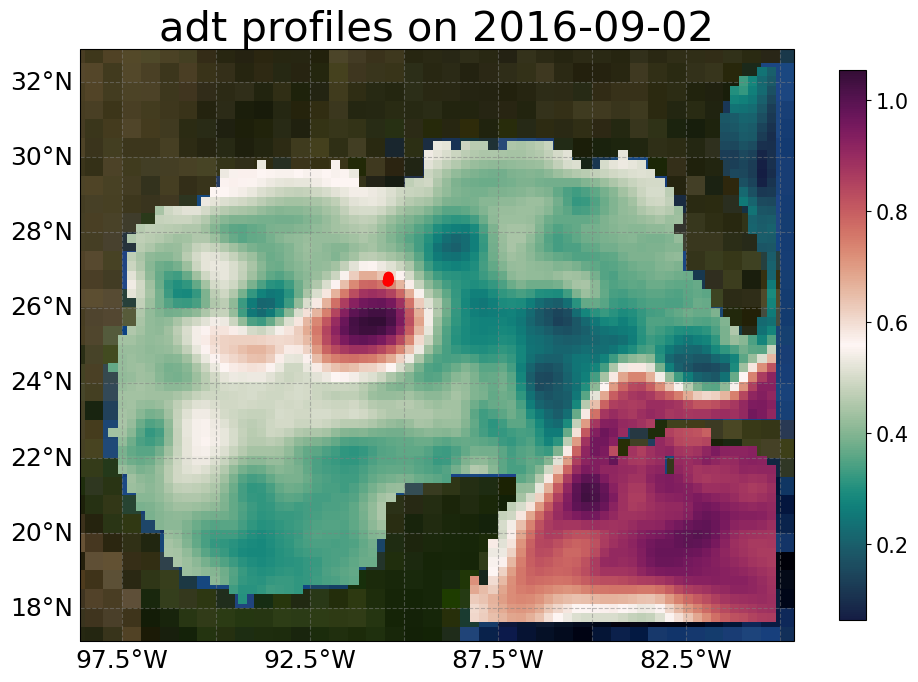

lat			lon			altimetry_value
26.69445960191552	-90.44043007335884	0.7017267038633644
26.70221824576135	-90.44061822451742	0.6980986509519517
26.709718642956762	-90.43835956580139	0.6942633861002371
26.71594733773803	-90.43976483717812	0.691519406187881
26.739373813751843	-90.43756519810803	0.6801978822088177
26.747216466957425	-90.43750276988877	0.6764980745555881
26.723480624395417	-90.43761745484345	0.6876858450107799
26.7304115930339	-90.4376464375614	0.6844272426225971
26.789013281216892	-90.4288697750948	0.6557074945563133
26.79829359828618	-90.43074473191172	0.6515857160917502
26.770404176347014	-90.43156022288902	0.6648079542168341
26.77937208053865	-90.4311607976661	0.6605381734258866
26.755642077426273	-90.43255516357658	0.671881785621804
26.76152002861238	-90.432405509717	0.6690972308860996
26.808377984001254	-90.43076622180561	0.6468460006788812
26.81884407404806	-90.4299265935687	0.6418169537490894
26.828776471516527	-90.42740086502013	0.6368259926980951
Closest time index: 

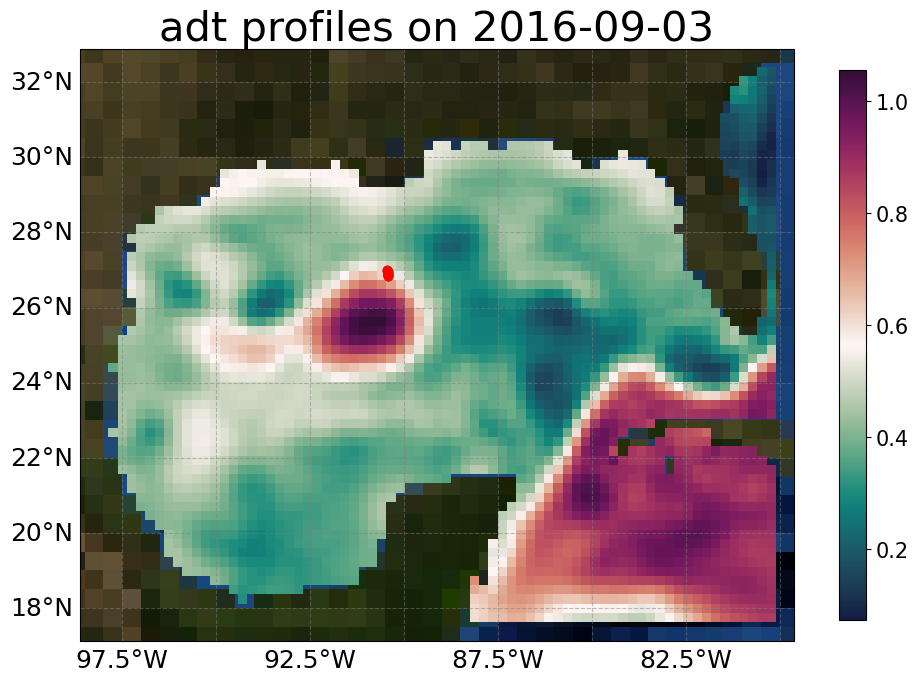

lat			lon			altimetry_value
26.848555800902947	-90.42583419654692	0.6023406173619856
26.85881996220246	-90.42587830245003	0.5976949759976244
26.828776471516527	-90.42740086502013	0.6115302970915977
26.838471969708	-90.4267201054687	0.6070372683849066
26.91301559172029	-90.42841613923135	0.5765942155059622
26.9233393072786	-90.42910083805415	0.5728479333107412
26.88785146805801	-90.42646784790327	0.5856755475208169
26.899689249900053	-90.4280939043639	0.5815008690956216
26.86770143228224	-90.4239067357548	0.5933945010163888
26.877501629105577	-90.42524660549272	0.5893466975690148
26.961933018946638	-90.4369437770525	0.5594556805766105
26.977075020033904	-90.44027845327423	0.5541975070927696
26.935359830404142	-90.43211772963782	0.5687626699558418
26.947978313310998	-90.43466048805757	0.5643808421677028
26.99394572053204	-90.4406527869869	0.5479327671878765
27.01118442833743	-90.4443204507397	0.5418923190565256
Closest time index: 3
_show_var_names = True


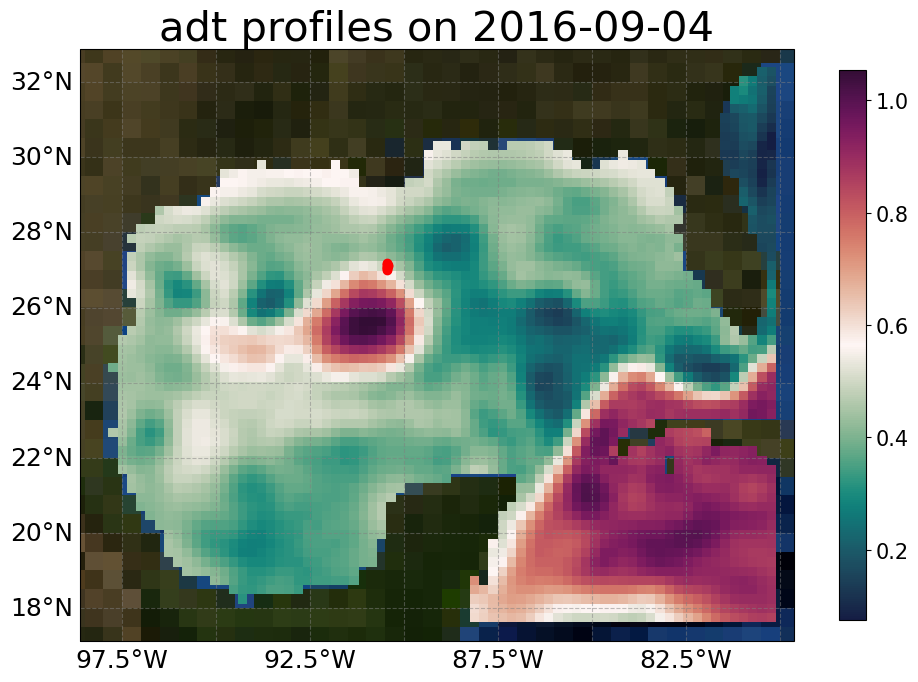

lat			lon			altimetry_value
27.01118442833743	-90.4443204507397	0.5197914571656387
27.02966238214493	-90.44427655084628	0.5134144008046487
27.048574926167056	-90.44387785585893	0.5068475141350562
27.06909455117075	-90.44165691590196	0.49953269345146856
27.087307156558406	-90.44154479544274	0.4932530290582514
27.10608241231934	-90.43942589558824	0.48658169750794283
27.123864874340633	-90.43932651456906	0.48046241204256046
27.186414682176203	-90.44143674980674	0.4658297988350423
27.14432566160735	-90.44049096601866	0.47563950275197026
27.16255218277785	-90.4437965062879	0.4716559519764113
Closest time index: 4
_show_var_names = True


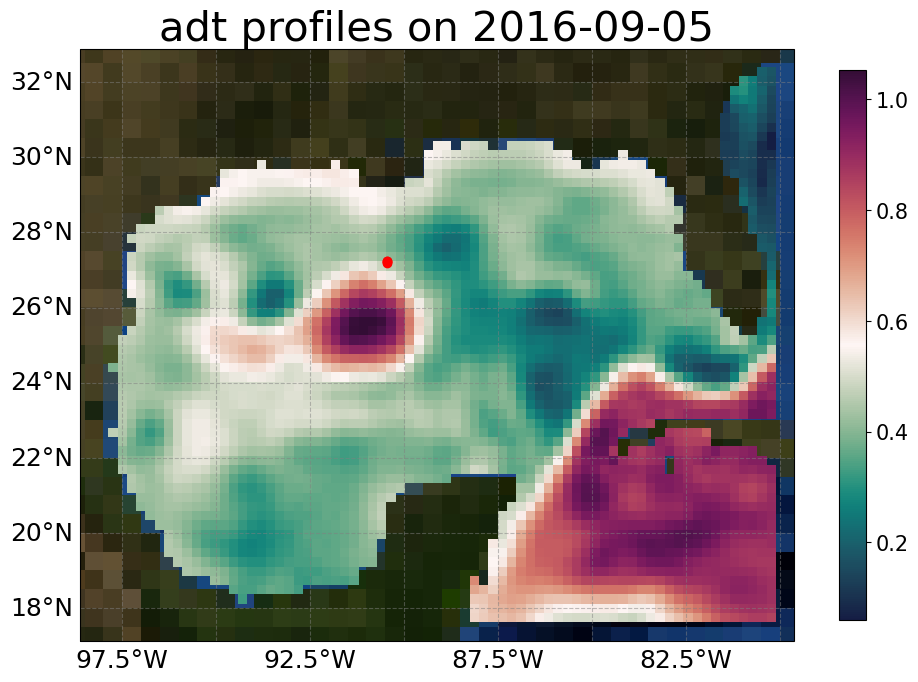

lat			lon			altimetry_value
27.186414682176203	-90.44143674980674	0.45147845400125064
27.205638273629983	-90.44156710850625	0.44739619085739396
27.22809080299998	-90.44052468869332	0.4425229583511936
27.248107997361156	-90.4410380411617	0.43830571728610235


In [7]:
# load/plot aviso data (2016-08-06 - 2016-09-05) 
aviso_folder = "/unity/f1/ozavala/DATA/GOFFISH/AVISO/GoM/"
bbox = [17.5, 32.5, -110, -80]

start_date = datetime.datetime(2016, 8, 6)
end_date = datetime.datetime(2016, 9, 5)
delta = datetime.timedelta(days=1)
date_of_interest = start_date 

while date_of_interest <= end_date:
    date_string = date_of_interest.strftime("%Y-%m-%d")
    aviso_data, lats, lons = get_aviso_by_date(aviso_folder, date_of_interest, bbox)
    # print(aviso_data["time"]) # check date

    # Filter the medians DataFrame for profiles from the desired date
    # profiles_on_date = ds['profile_id'].unique()
    profiles_on_date = ds[ds.index.date == date_of_interest.date()]['profile_id'].unique()
    medians_on_date = medians.loc[profiles_on_date]

    viz_obj = EOAImageVisualizer(lats=lats, lons=lons, disp_images=True, output_folder="outputs",  show_var_names=True)
    # viz_obj.plot_2d_data_np(aviso_data.adt, ['adt'], 'LC', 'filepref', plot_mode=PlotMode.RASTER)

    # # Plot the locations of the profiles
    # Assuming medians_on_date contains the 'lat' and 'lon' data
    prof_med_lat = medians_on_date['lat'].values
    prof_med_lon = medians_on_date['lon'].values

    # Create the multipoint variable by combining prof_med_lat and prof_med_lon
    additional_poly = [Point(lon, lat) for lat, lon in zip(prof_med_lat, prof_med_lon)]

    viz_obj.__setattr__('additional_polygons', additional_poly)
    viz_obj.plot_2d_data_np(aviso_data.adt, ['adt'], f'profiles on {date_string}', 'filepref')

    print("lat\t\t\tlon\t\t\taltimetry_value")

    for i in range(len(prof_med_lat)):
        lat = prof_med_lat[i]
        lon = prof_med_lon[i]
        altimetry_value = get_altimetry(lat, lon, aviso_data.adt, lats, lons)
        print(f"{lat}\t{lon}\t{altimetry_value}")

    date_of_interest += delta

Closest time index: 5
_show_var_names = True


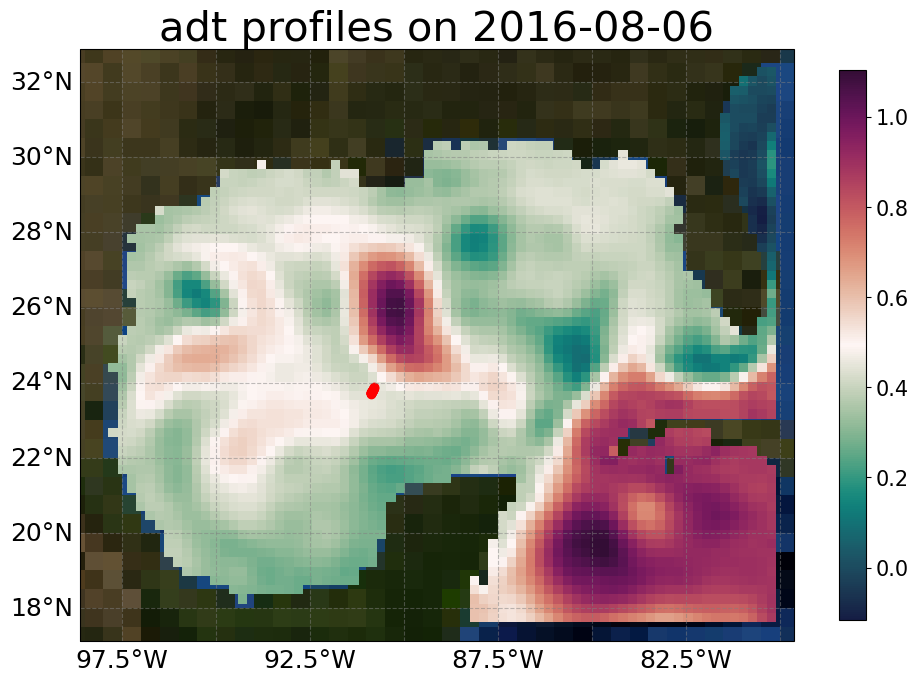

lat			lon			altimetry_value
23.711061629784933	-90.88256967420153	0.44261836984726677
23.7177979700791	-90.88092863431406	0.4423370805894643
23.72648389287467	-90.87756464729546	0.4420058955493146
23.751407368243132	-90.86422468384664	0.4411335392280079
23.760529689151486	-90.85860078462103	0.4408779460719157
23.719367188918227	-90.88275302156612	0.4422173056034493
23.719888141962016	-90.88233607834349	0.44220269660498523
23.73414457620826	-90.87358847433005	0.44172973924970094
23.74286784886604	-90.86849895254255	0.44142287701104765
23.76972943740208	-90.85357564040902	0.4406346151579929
23.778561396597887	-90.84828177965622	0.44044384804581993
23.788664591783437	-90.84306254190822	0.440232891085111
23.798147621831518	-90.83869228610189	0.44004539070276333
23.808523865877675	-90.83334309893289	0.4398941766536509
23.817475648793142	-90.82836694768986	0.43980830325726367
23.860164293936172	-90.80914150704552	0.43952943464832994
23.875227661241002	-90.80185239818273	0.43960214370432604
2

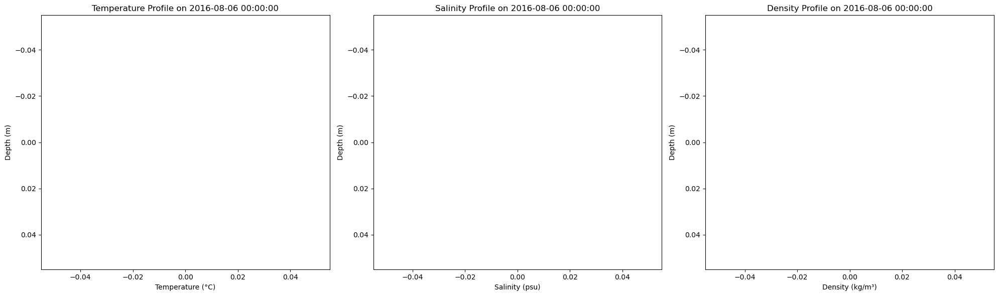

Closest time index: 6
_show_var_names = True


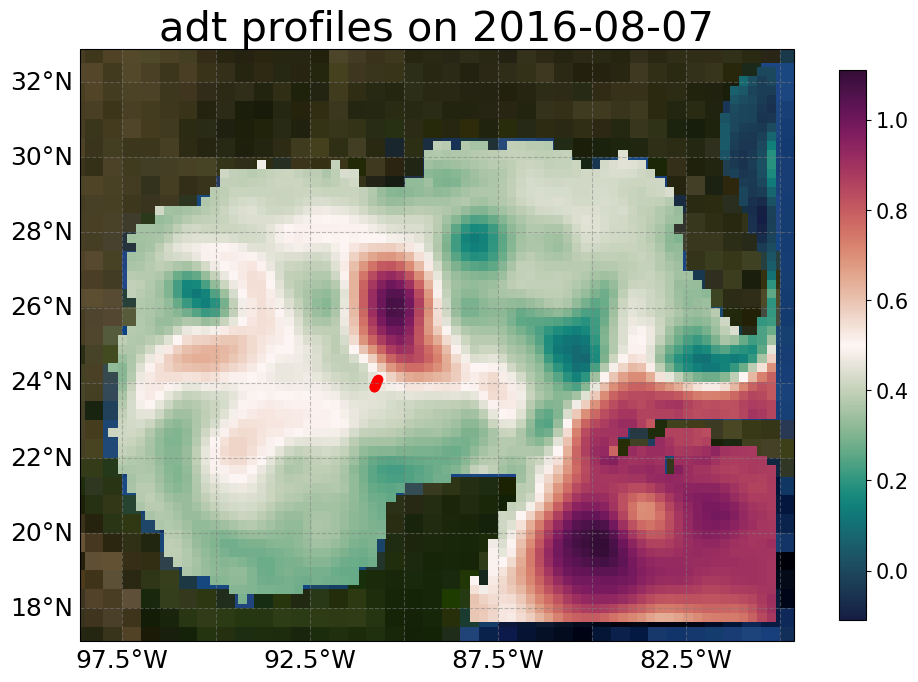

lat			lon			altimetry_value
23.875227661241002	-90.80185239818273	0.45119675189254155
23.889077920143958	-90.79599722318613	0.4527923902714826
23.904757611456755	-90.78873026390738	0.45479492783111586
23.920253824738378	-90.78153070281859	0.45691631272225547
23.93695262124212	-90.774375152273	0.45927688382486165
23.955148576491638	-90.76746555162845	0.4618888986396313
23.971873627779615	-90.75873379082606	0.4648032488139444
23.990265921648593	-90.7506531582725	0.4679620647304793
24.007115299233917	-90.74138377559953	0.471354068759682
24.026117414798886	-90.73325254883233	0.47496953519931207
24.04330285481292	-90.72588001128506	0.47840960898035056
24.062002169023415	-90.71821284783185	0.4822569528007061
24.078921507837237	-90.71046788315297	0.48607386663450525
24.09639914669788	-90.70307034034704	0.49004700390249156


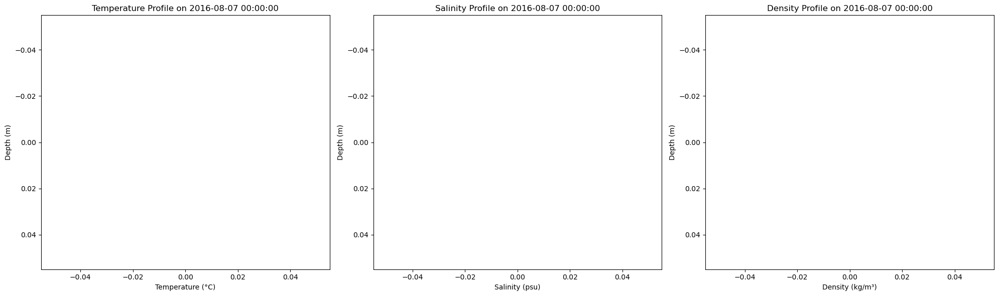

Closest time index: 7
_show_var_names = True


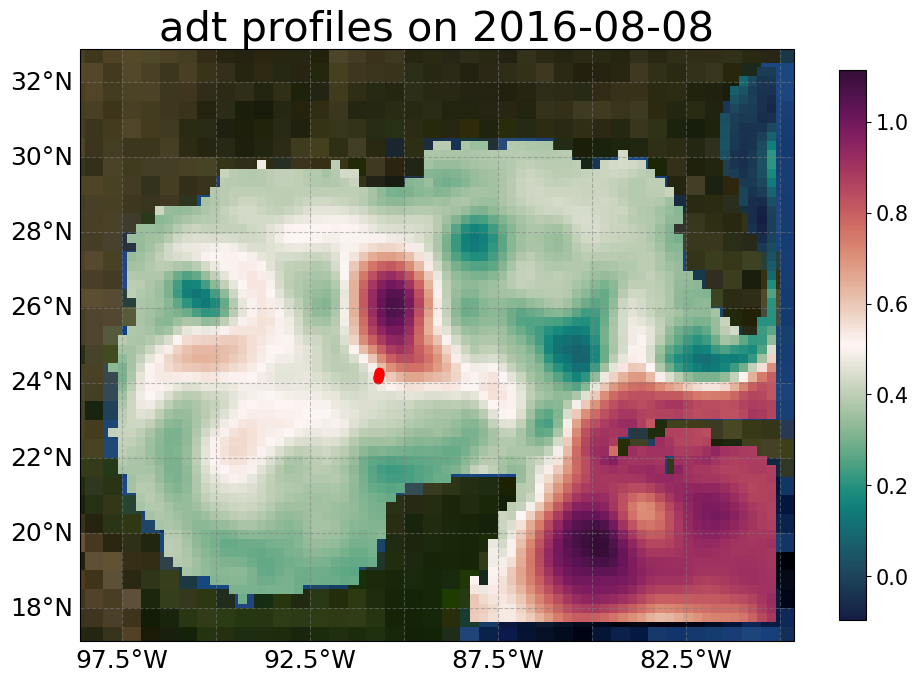

lat			lon			altimetry_value
24.09639914669788	-90.70307034034704	0.5131267671225888
24.112594075790913	-90.69764887408247	0.5173534965868459
24.132496833782707	-90.69439225783343	0.5225243466503487
24.150421719661097	-90.68954035049907	0.52901869228691
24.17116461624348	-90.6844910010472	0.5364527553816206
24.18979309320253	-90.67845113615277	0.5436868902869905
24.211440666365423	-90.67408272825898	0.5513460596539979
24.229778810064204	-90.66702477019808	0.5590281324779284
24.294121209750426	-90.65498741541654	0.582235411317655
24.2540194324645	-90.66416347669882	0.5671115004674401
24.270825596005558	-90.65720029362076	0.5745152129793798


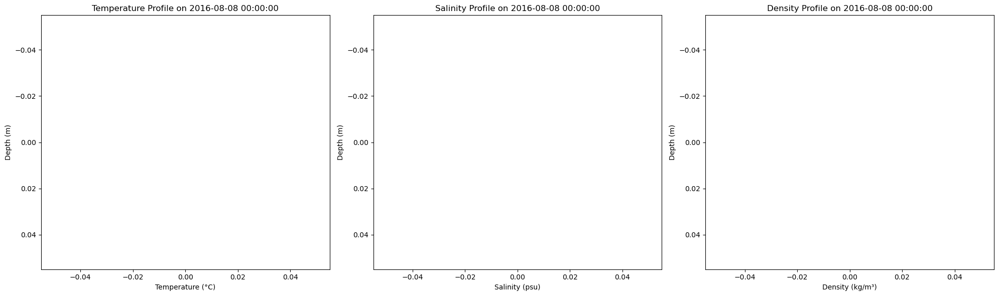

Closest time index: 8
_show_var_names = True


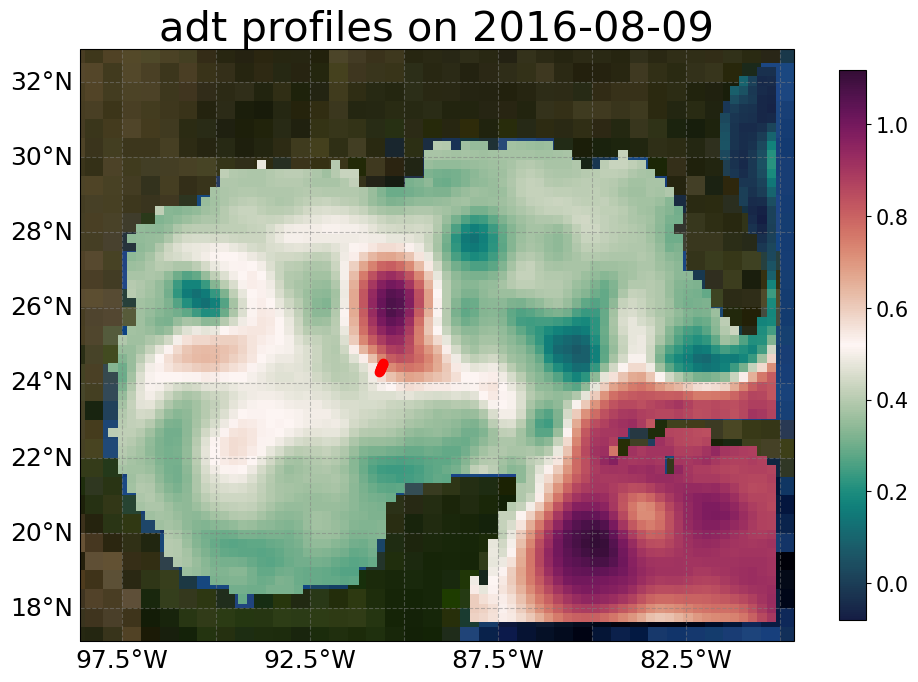

lat			lon			altimetry_value
24.294121209750426	-90.65498741541654	0.610992081859427
24.311968137027684	-90.6478674077923	0.6191664782405804
24.329831109111318	-90.64148616686737	0.6271801506559438
24.34533795371989	-90.63322172210714	0.6353311902064047
24.36210238185248	-90.62740260834565	0.6430017437161744
24.377141206559774	-90.62018901855392	0.6502826151767129
24.419613134666832	-90.60135887592872	0.6703674786651159
24.432859500063238	-90.59386200997042	0.6771321408662351
24.392714304759046	-90.61508770869257	0.6570962130484727
24.40558814696059	-90.60782172378815	0.6636573356915486
24.475706781401357	-90.57337287095442	0.697892062318664
24.487280357032287	-90.56706078353206	0.7037428354794881
24.501706877454275	-90.56307276333612	0.7098539175863439
24.51381196121247	-90.55587982819702	0.716159897347338
24.44755043991402	-90.58767570273896	0.6839907671888524
24.460794964956595	-90.5795164822	0.6909642240831496


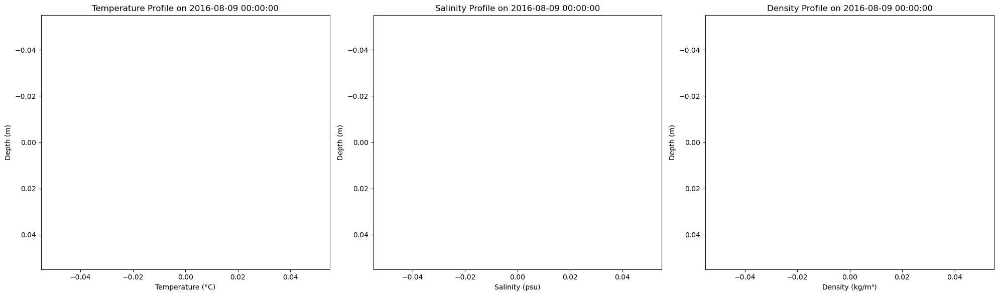

Closest time index: 9
_show_var_names = True


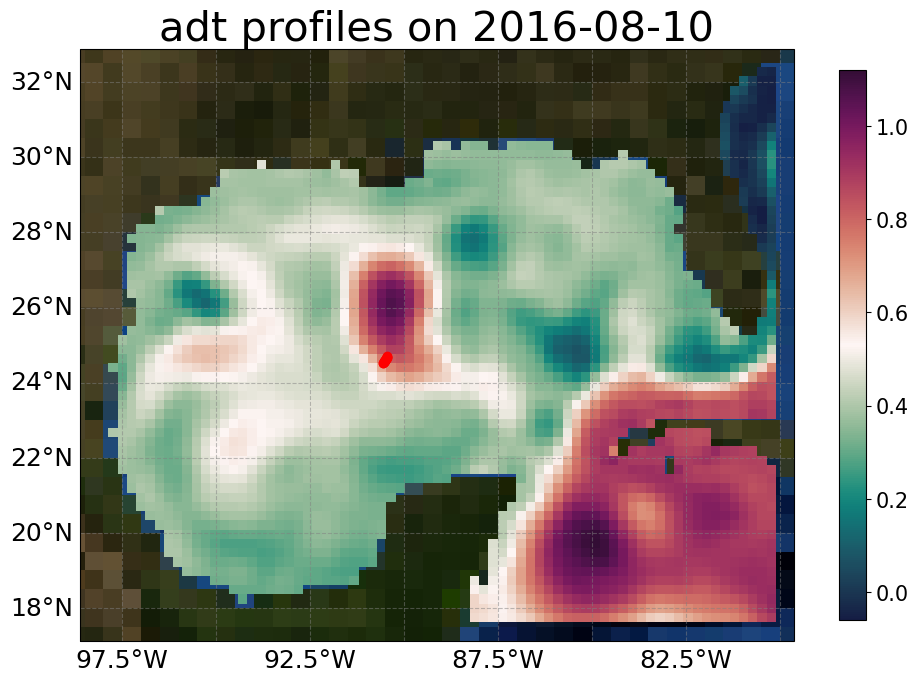

lat			lon			altimetry_value
24.51381196121247	-90.55587982819702	0.7339624752855856
24.57493589829866	-90.52211483095296	0.7618525744955098
24.586891339828632	-90.51339304043952	0.7678427524288371
24.52734329630606	-90.55045729821596	0.739615493506144
24.538894641708964	-90.54215319863562	0.7453799675670425
24.550850941787928	-90.5364611434615	0.7506021270666647
24.562063691769993	-90.52830740010285	0.756217558376144
24.652660547566555	-90.47541739784451	0.7968624128262356
24.66536564460174	-90.46629781876571	0.8024937974602057
24.62595392118702	-90.49150915133535	0.7856697274180049
24.638602897927825	-90.48260417892676	0.791314417651128
24.599812942261227	-90.5069254826824	0.7735595850035448
24.612129565005127	-90.49830513996818	0.779633055798882
24.704182227695245	-90.44491895303736	0.8178771837289152
24.679308159010297	-90.45978896461159	0.8077680195176421
24.691574138336403	-90.45131116597513	0.8130478263284205


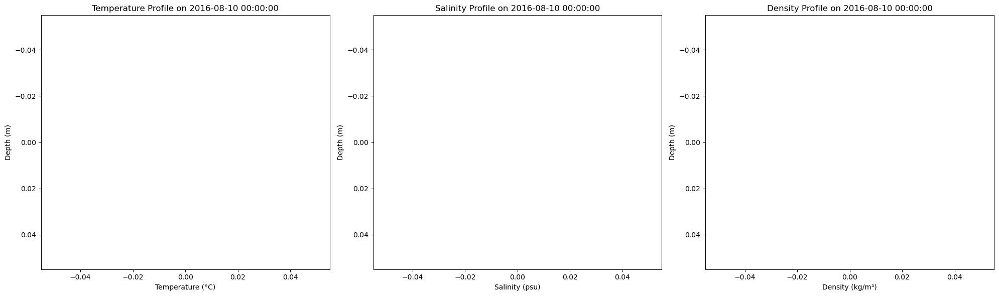

Closest time index: 10
_show_var_names = True


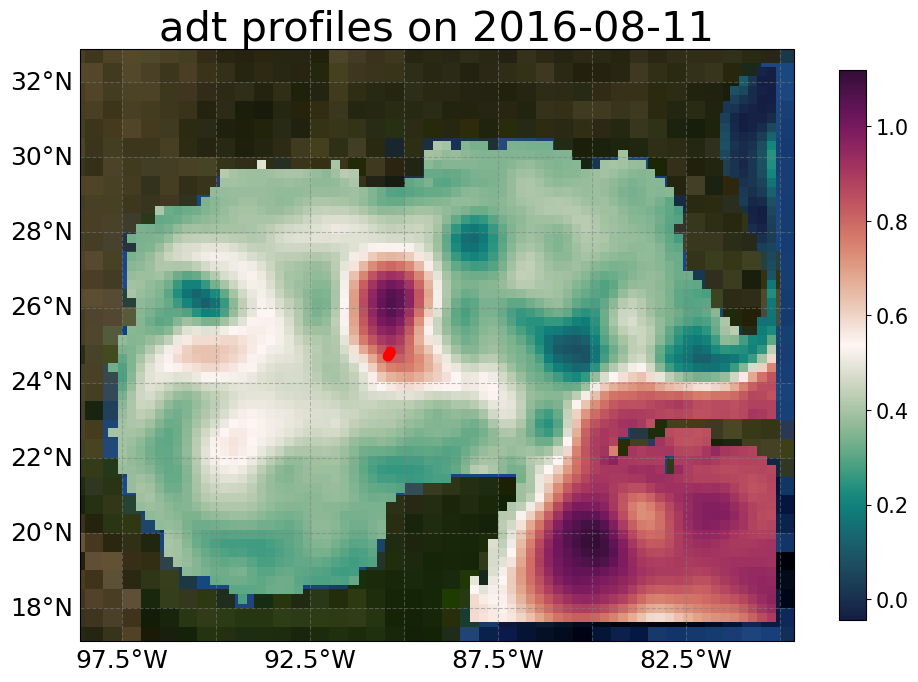

lat			lon			altimetry_value
24.704182227695245	-90.44491895303736	0.8240835239323423
24.715621586745648	-90.43666011251943	0.8283953358222711
24.726427087632366	-90.42954570191299	0.8323035638772497
24.737241639196995	-90.4216152869154	0.8363399167973125
24.792757345230434	-90.38921230267101	0.8550590444590916
24.803608838070566	-90.38122423927739	0.8589322665998096
24.748988301608726	-90.41572978419528	0.8401750969833276
24.76021489293829	-90.40857548462479	0.8441000418777647
24.771220193268167	-90.40313570427197	0.8476292992048944
24.781688480196017	-90.39566200013184	0.8513829692528163
24.834453691724697	-90.36515490760067	0.8663082438426042
24.843735933439635	-90.36379850465137	0.8682717753248897
24.81426777982155	-90.37550565031476	0.8623315510070091
24.824236954395506	-90.36824727431511	0.8642373940450575


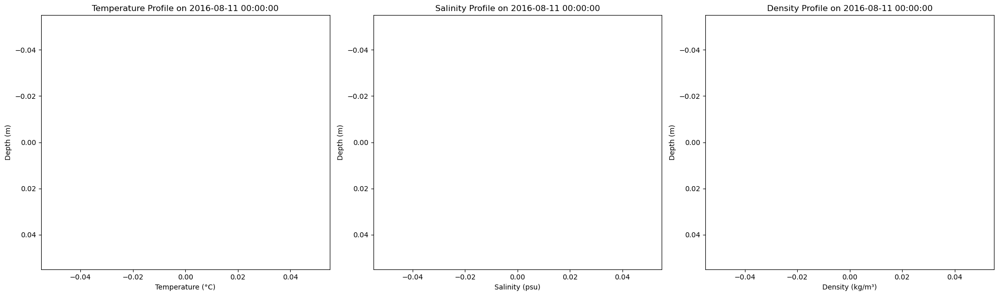

Closest time index: 11
_show_var_names = True


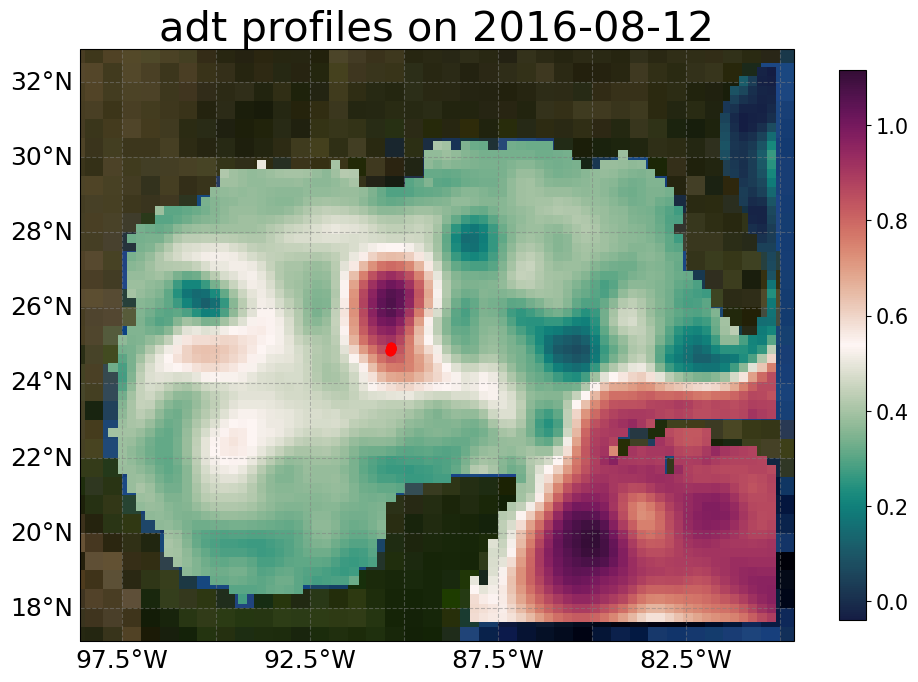

lat			lon			altimetry_value
24.850228091549376	-90.36377738512441	0.8612782064029708
24.858084656875988	-90.36235317932608	0.8625133629908378
24.843735933439635	-90.36379850465137	0.8601050813804906
24.867427940751515	-90.36218208711368	0.8641786403729061
24.876929021788577	-90.35922523071675	0.8654893636707344
24.904304799671316	-90.35226509941347	0.8694209886769959
24.9141329486894	-90.34859929706924	0.8706417704513397
24.885788935945246	-90.35681169892185	0.8667487329910321
24.895474864087905	-90.35397850338458	0.8680870319574582
24.92370319187637	-90.3467021863013	0.8720620496920636
24.933491170575028	-90.34232999839107	0.8731416796108309
24.942762869187696	-90.33977603639674	0.8743879641502413
24.953178586839233	-90.3372704650845	0.8758314684215608
24.961617867842314	-90.33546315315095	0.8770272900748384


KeyboardInterrupt: 

<Figure size 2000x600 with 0 Axes>

In [8]:
# load/plot aviso data (2016-08-06 - 2016-09-05) 
aviso_folder = "/unity/f1/ozavala/DATA/GOFFISH/AVISO/GoM/"
bbox = [17.5, 32.5, -110, -80]

start_date = datetime.datetime(2016, 8, 6)
end_date = datetime.datetime(2016, 9, 5)
delta = datetime.timedelta(days=1)
date_of_interest = start_date

while date_of_interest <= end_date:
    date_string = date_of_interest.strftime("%Y-%m-%d")
    aviso_data, lats, lons = get_aviso_by_date(aviso_folder, date_of_interest, bbox)
    # print(aviso_data["time"]) # check date

    # Filter the medians DataFrame for profiles from the desired date
    # profiles_on_date = ds['profile_id'].unique()
    profiles_on_date = ds[ds.index.date == date_of_interest.date()]['profile_id'].unique()
    medians_on_date = medians.loc[profiles_on_date]

    viz_obj = EOAImageVisualizer(lats=lats, lons=lons, disp_images=True, output_folder="outputs",  show_var_names=True)
    # viz_obj.plot_2d_data_np(aviso_data.adt, ['adt'], 'LC', 'filepref', plot_mode=PlotMode.RASTER)

    # # Plot the locations of the profiles
    # Assuming medians_on_date contains the 'lat' and 'lon' data
    prof_med_lat = medians_on_date['lat'].values
    prof_med_lon = medians_on_date['lon'].values

    # Create the multipoint variable by combining prof_med_lat and prof_med_lon
    additional_poly = [Point(lon, lat) for lat, lon in zip(prof_med_lat, prof_med_lon)]

    viz_obj.__setattr__('additional_polygons', additional_poly)
    viz_obj.plot_2d_data_np(aviso_data.adt, ['adt'], f'profiles on {date_string}', 'filepref')

    print("lat\t\t\tlon\t\t\taltimetry_value")

    for i in range(len(prof_med_lat)):
        lat = prof_med_lat[i]
        lon = prof_med_lon[i]
        altimetry_value = get_altimetry(lat, lon, aviso_data.adt, lats, lons)
        print(f"{lat}\t{lon}\t{altimetry_value}")

    plot_profiles(ds, date_of_interest)
    date_of_interest += delta

Closest time index: 5
_show_var_names = True


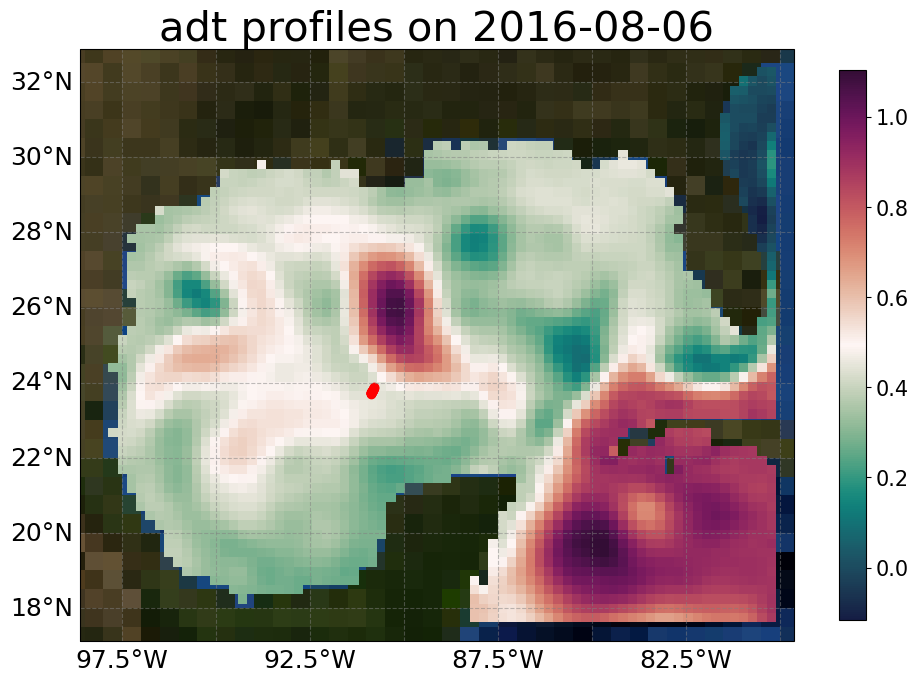

lat			lon			altimetry_value
23.711061629784933	-90.88256967420153	0.44261836984726677
23.7177979700791	-90.88092863431406	0.4423370805894643
23.72648389287467	-90.87756464729546	0.4420058955493146
23.751407368243132	-90.86422468384664	0.4411335392280079
23.760529689151486	-90.85860078462103	0.4408779460719157
23.719367188918227	-90.88275302156612	0.4422173056034493
23.719888141962016	-90.88233607834349	0.44220269660498523
23.73414457620826	-90.87358847433005	0.44172973924970094
23.74286784886604	-90.86849895254255	0.44142287701104765
23.76972943740208	-90.85357564040902	0.4406346151579929
23.778561396597887	-90.84828177965622	0.44044384804581993
23.788664591783437	-90.84306254190822	0.440232891085111
23.798147621831518	-90.83869228610189	0.44004539070276333
23.808523865877675	-90.83334309893289	0.4398941766536509
23.817475648793142	-90.82836694768986	0.43980830325726367
23.860164293936172	-90.80914150704552	0.43952943464832994
23.875227661241002	-90.80185239818273	0.43960214370432604
2

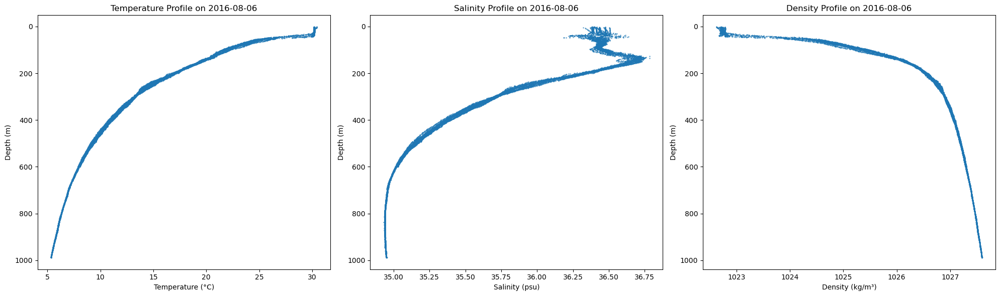

Closest time index: 6
_show_var_names = True


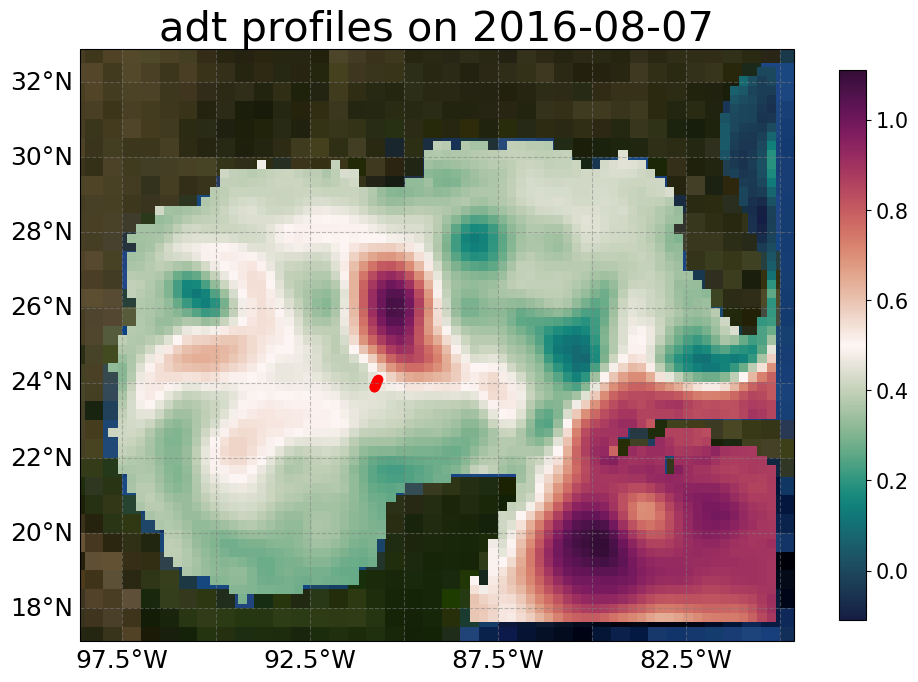

lat			lon			altimetry_value
23.875227661241002	-90.80185239818273	0.45119675189254155
23.889077920143958	-90.79599722318613	0.4527923902714826
23.904757611456755	-90.78873026390738	0.45479492783111586
23.920253824738378	-90.78153070281859	0.45691631272225547
23.93695262124212	-90.774375152273	0.45927688382486165
23.955148576491638	-90.76746555162845	0.4618888986396313
23.971873627779615	-90.75873379082606	0.4648032488139444
23.990265921648593	-90.7506531582725	0.4679620647304793
24.007115299233917	-90.74138377559953	0.471354068759682
24.026117414798886	-90.73325254883233	0.47496953519931207
24.04330285481292	-90.72588001128506	0.47840960898035056
24.062002169023415	-90.71821284783185	0.4822569528007061
24.078921507837237	-90.71046788315297	0.48607386663450525
24.09639914669788	-90.70307034034704	0.49004700390249156


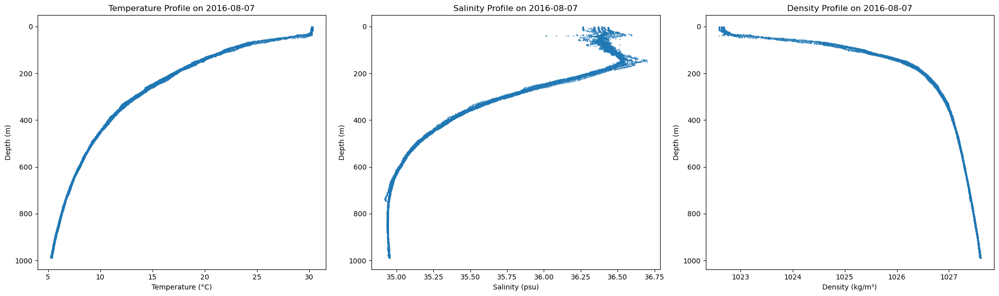

Closest time index: 7
_show_var_names = True


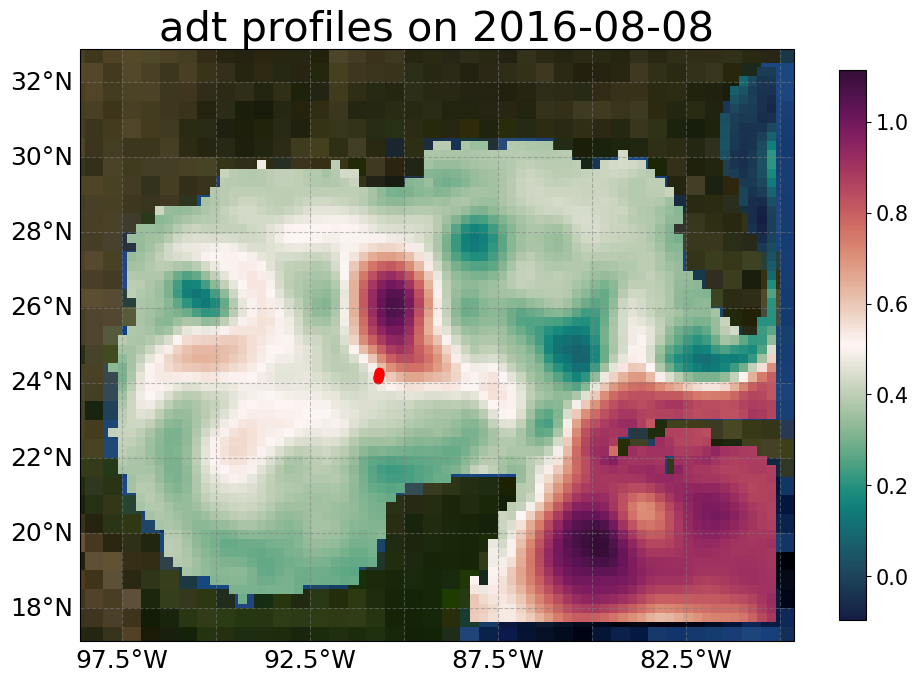

lat			lon			altimetry_value
24.09639914669788	-90.70307034034704	0.5131267671225888
24.112594075790913	-90.69764887408247	0.5173534965868459
24.132496833782707	-90.69439225783343	0.5225243466503487
24.150421719661097	-90.68954035049907	0.52901869228691
24.17116461624348	-90.6844910010472	0.5364527553816206
24.18979309320253	-90.67845113615277	0.5436868902869905
24.211440666365423	-90.67408272825898	0.5513460596539979
24.229778810064204	-90.66702477019808	0.5590281324779284
24.294121209750426	-90.65498741541654	0.582235411317655
24.2540194324645	-90.66416347669882	0.5671115004674401
24.270825596005558	-90.65720029362076	0.5745152129793798


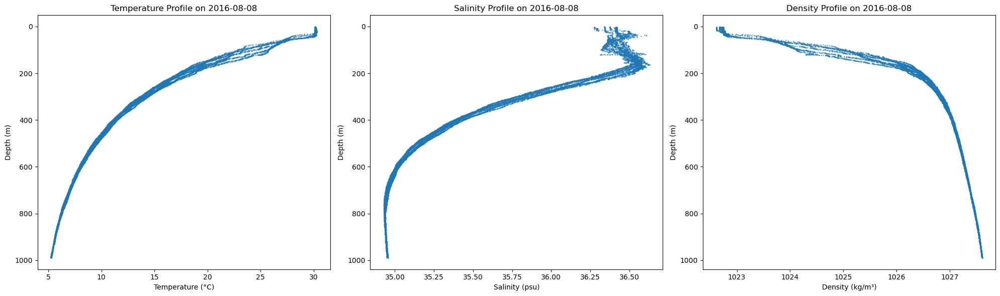

Closest time index: 8
_show_var_names = True


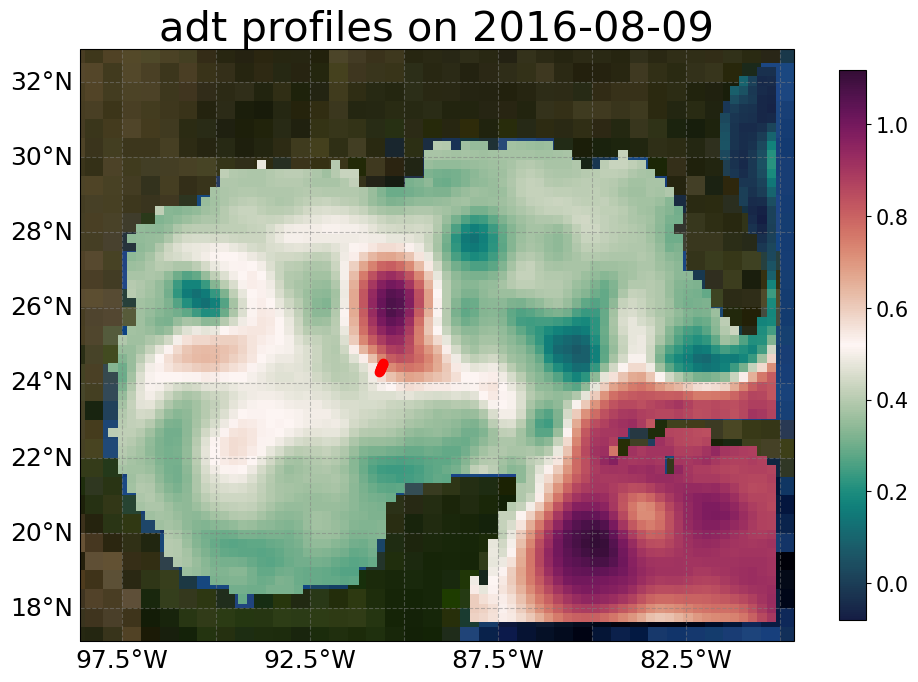

lat			lon			altimetry_value
24.294121209750426	-90.65498741541654	0.610992081859427
24.311968137027684	-90.6478674077923	0.6191664782405804
24.329831109111318	-90.64148616686737	0.6271801506559438
24.34533795371989	-90.63322172210714	0.6353311902064047
24.36210238185248	-90.62740260834565	0.6430017437161744
24.377141206559774	-90.62018901855392	0.6502826151767129
24.419613134666832	-90.60135887592872	0.6703674786651159
24.432859500063238	-90.59386200997042	0.6771321408662351
24.392714304759046	-90.61508770869257	0.6570962130484727
24.40558814696059	-90.60782172378815	0.6636573356915486
24.475706781401357	-90.57337287095442	0.697892062318664
24.487280357032287	-90.56706078353206	0.7037428354794881
24.501706877454275	-90.56307276333612	0.7098539175863439
24.51381196121247	-90.55587982819702	0.716159897347338
24.44755043991402	-90.58767570273896	0.6839907671888524
24.460794964956595	-90.5795164822	0.6909642240831496


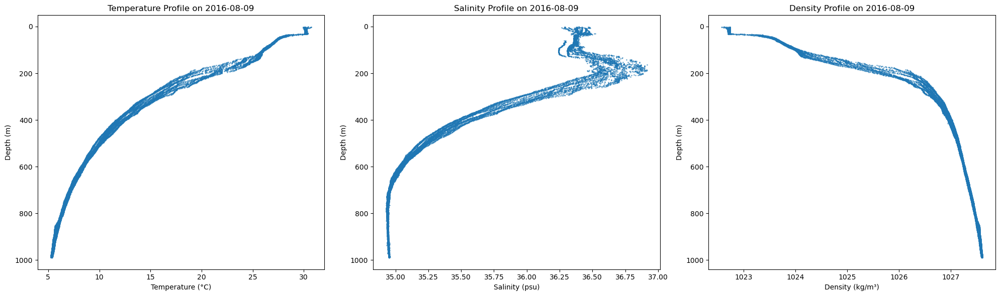

Closest time index: 9
_show_var_names = True


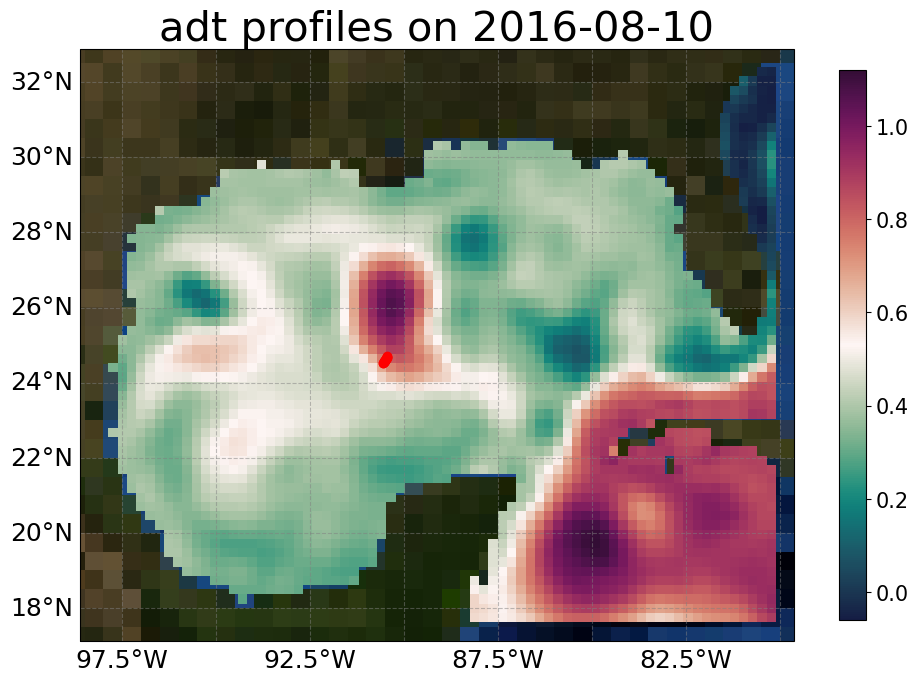

lat			lon			altimetry_value
24.51381196121247	-90.55587982819702	0.7339624752855856
24.57493589829866	-90.52211483095296	0.7618525744955098
24.586891339828632	-90.51339304043952	0.7678427524288371
24.52734329630606	-90.55045729821596	0.739615493506144
24.538894641708964	-90.54215319863562	0.7453799675670425
24.550850941787928	-90.5364611434615	0.7506021270666647
24.562063691769993	-90.52830740010285	0.756217558376144
24.652660547566555	-90.47541739784451	0.7968624128262356
24.66536564460174	-90.46629781876571	0.8024937974602057
24.62595392118702	-90.49150915133535	0.7856697274180049
24.638602897927825	-90.48260417892676	0.791314417651128
24.599812942261227	-90.5069254826824	0.7735595850035448
24.612129565005127	-90.49830513996818	0.779633055798882
24.704182227695245	-90.44491895303736	0.8178771837289152
24.679308159010297	-90.45978896461159	0.8077680195176421
24.691574138336403	-90.45131116597513	0.8130478263284205


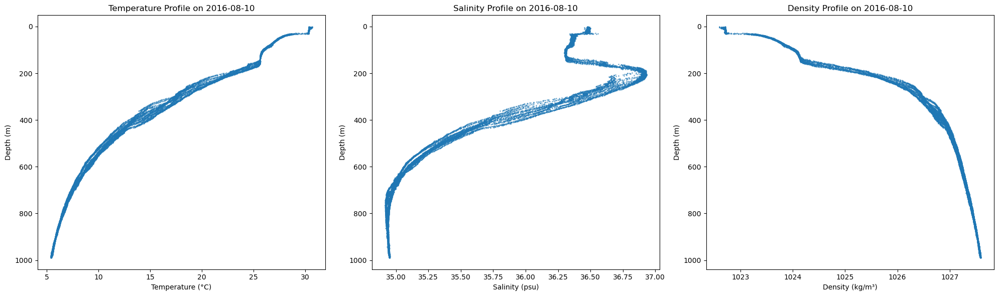

Closest time index: 10
_show_var_names = True


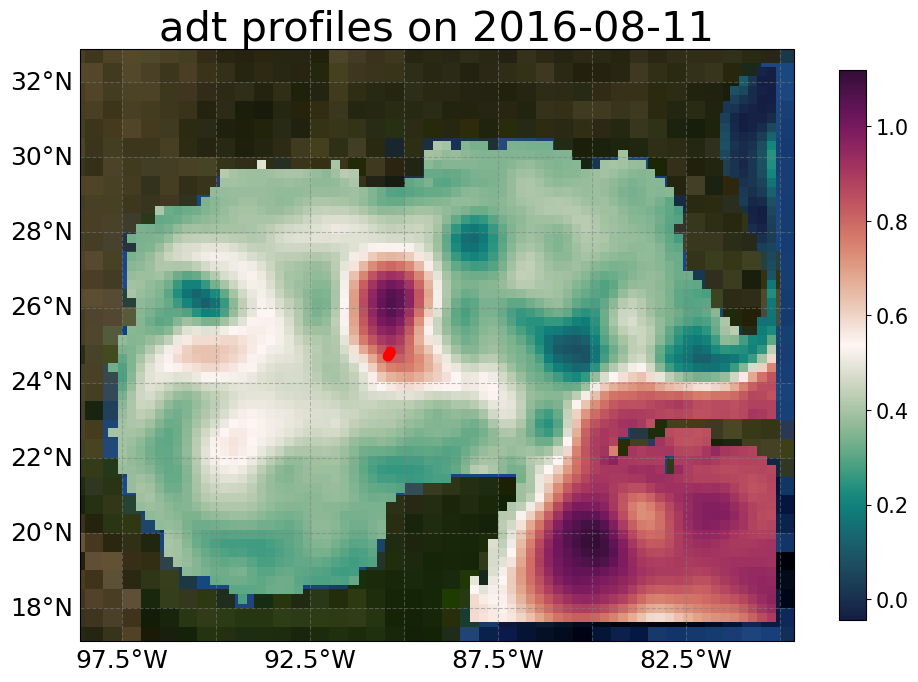

lat			lon			altimetry_value
24.704182227695245	-90.44491895303736	0.8240835239323423
24.715621586745648	-90.43666011251943	0.8283953358222711
24.726427087632366	-90.42954570191299	0.8323035638772497
24.737241639196995	-90.4216152869154	0.8363399167973125
24.792757345230434	-90.38921230267101	0.8550590444590916
24.803608838070566	-90.38122423927739	0.8589322665998096
24.748988301608726	-90.41572978419528	0.8401750969833276
24.76021489293829	-90.40857548462479	0.8441000418777647
24.771220193268167	-90.40313570427197	0.8476292992048944
24.781688480196017	-90.39566200013184	0.8513829692528163
24.834453691724697	-90.36515490760067	0.8663082438426042
24.843735933439635	-90.36379850465137	0.8682717753248897
24.81426777982155	-90.37550565031476	0.8623315510070091
24.824236954395506	-90.36824727431511	0.8642373940450575


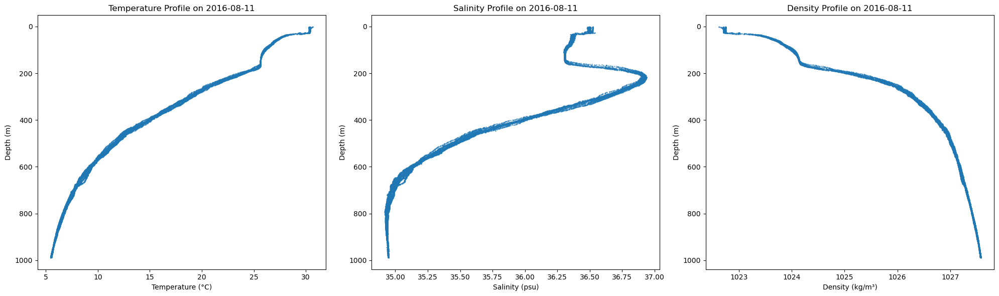

Closest time index: 11
_show_var_names = True


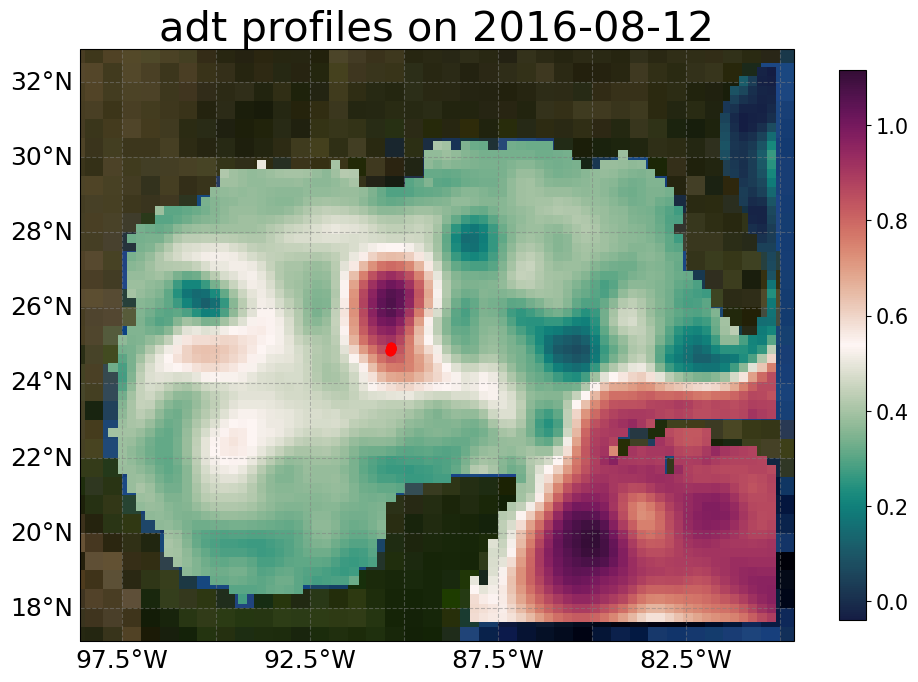

lat			lon			altimetry_value
24.850228091549376	-90.36377738512441	0.8612782064029708
24.858084656875988	-90.36235317932608	0.8625133629908378
24.843735933439635	-90.36379850465137	0.8601050813804906
24.867427940751515	-90.36218208711368	0.8641786403729061
24.876929021788577	-90.35922523071675	0.8654893636707344
24.904304799671316	-90.35226509941347	0.8694209886769959
24.9141329486894	-90.34859929706924	0.8706417704513397
24.885788935945246	-90.35681169892185	0.8667487329910321
24.895474864087905	-90.35397850338458	0.8680870319574582
24.92370319187637	-90.3467021863013	0.8720620496920636
24.933491170575028	-90.34232999839107	0.8731416796108309
24.942762869187696	-90.33977603639674	0.8743879641502413
24.953178586839233	-90.3372704650845	0.8758314684215608
24.961617867842314	-90.33546315315095	0.8770272900748384


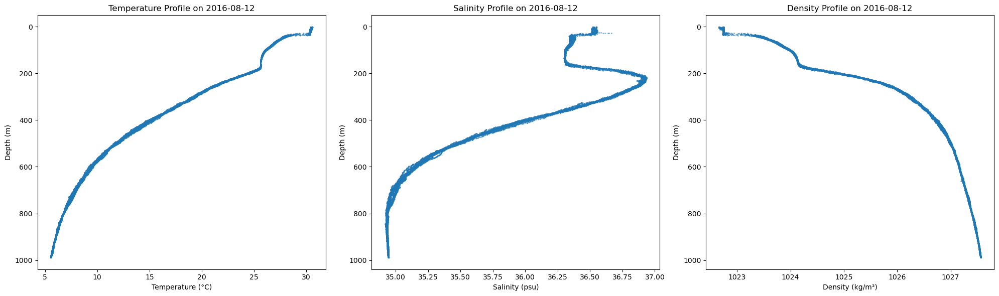

Closest time index: 12
_show_var_names = True


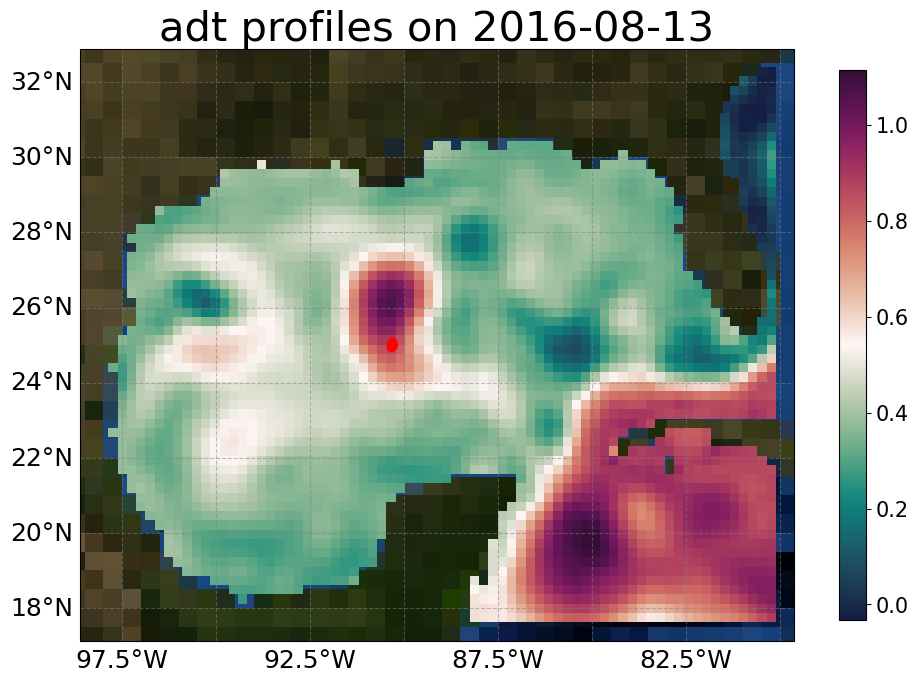

lat			lon			altimetry_value
24.961617867842314	-90.33546315315095	0.8625873642645401
24.970589890730594	-90.33417073568094	0.8638770736074294
24.97851317980571	-90.33187495982116	0.8647665977557507
24.985824219387435	-90.33046301069191	0.8657340447316595
24.992636371632774	-90.329233618541	0.8666512141598063
25.00055094470794	-90.32895727768157	0.8679634318563669
25.006368935821655	-90.32894716592565	0.8689696495560543
25.0131525739394	-90.32816340142693	0.8699739288155841
25.03306382068986	-90.32504026811134	0.872729717741836
25.04138937193966	-90.32344133319164	0.873810944277261
25.019094501667578	-90.32688910379115	0.8707231006116518
25.027009753312967	-90.32442693547146	0.8715485067307036
25.048317764420425	-90.32190703731231	0.874661935201477
25.05680555641925	-90.3190570554518	0.8754811711537286
25.064263039995858	-90.31971980011303	0.8769126451200047
25.07102455986201	-90.32008641670757	0.8781584930116373


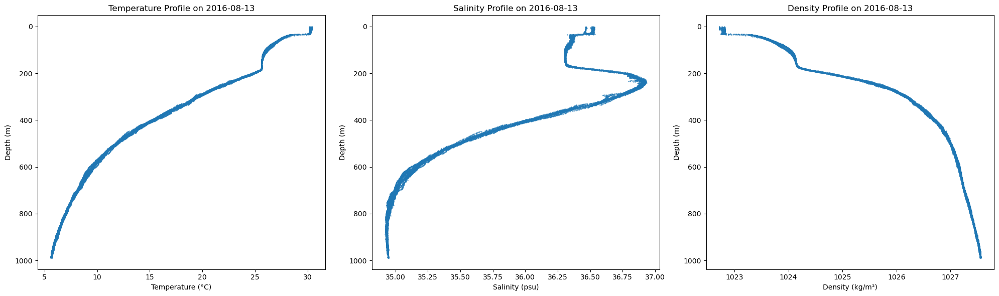

Closest time index: 13
_show_var_names = True


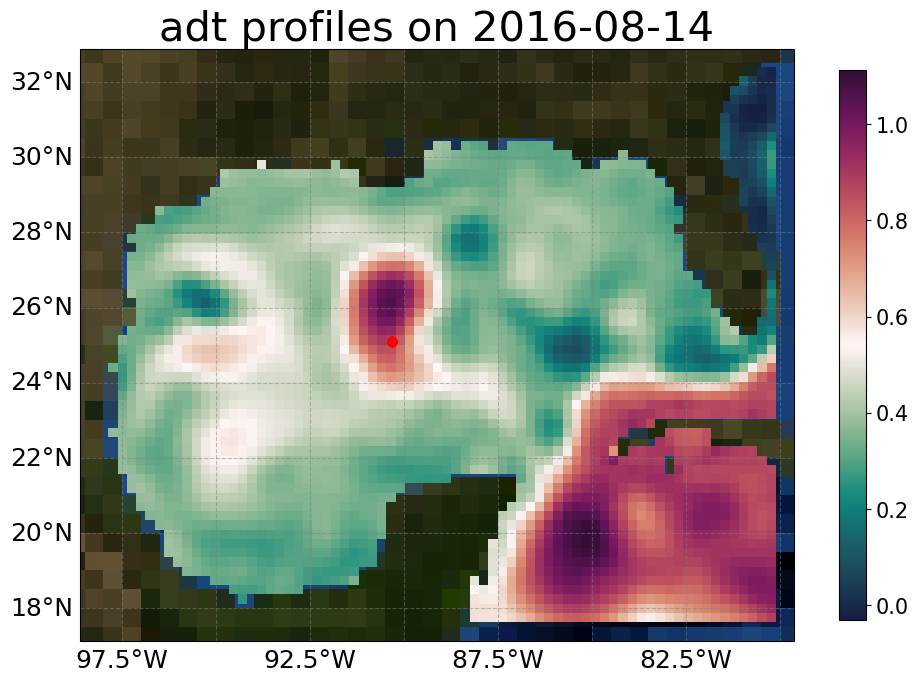

lat			lon			altimetry_value
25.088116217146165	-90.31879021281634	0.8638214408143996
25.09115874594542	-90.31859280722853	0.8642734076865763
25.07102455986201	-90.32008641670757	0.8613302265132178
25.077266095195352	-90.3210717107734	0.8626260350988612
25.08308870560532	-90.32006208801155	0.8633248689690095
25.094481552374397	-90.31893645183	0.8649154981229686
25.0964251485763	-90.31838140594915	0.8650901557193886
25.10366942907255	-90.31581741824387	0.8656078033806779
25.106326176905547	-90.31525330420985	0.8658972361841024
25.099140730241437	-90.31765008965829	0.8653456717849872
25.10131035950652	-90.31708810513673	0.8655555410728675
25.107856098847947	-90.3154297404942	0.8661975065079663
25.110651227271468	-90.31413674464814	0.8663150293408466


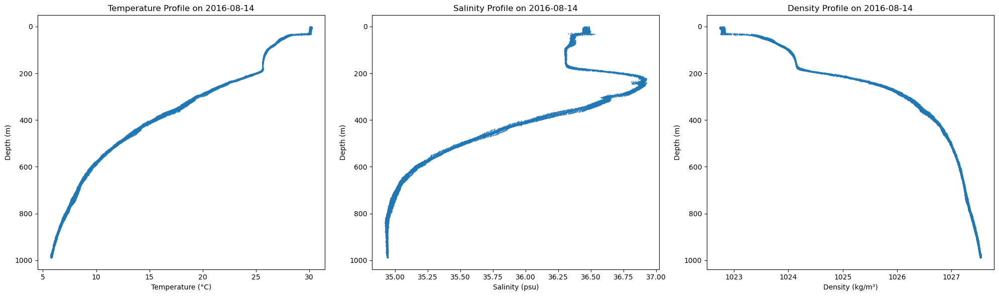

Closest time index: 14
_show_var_names = True


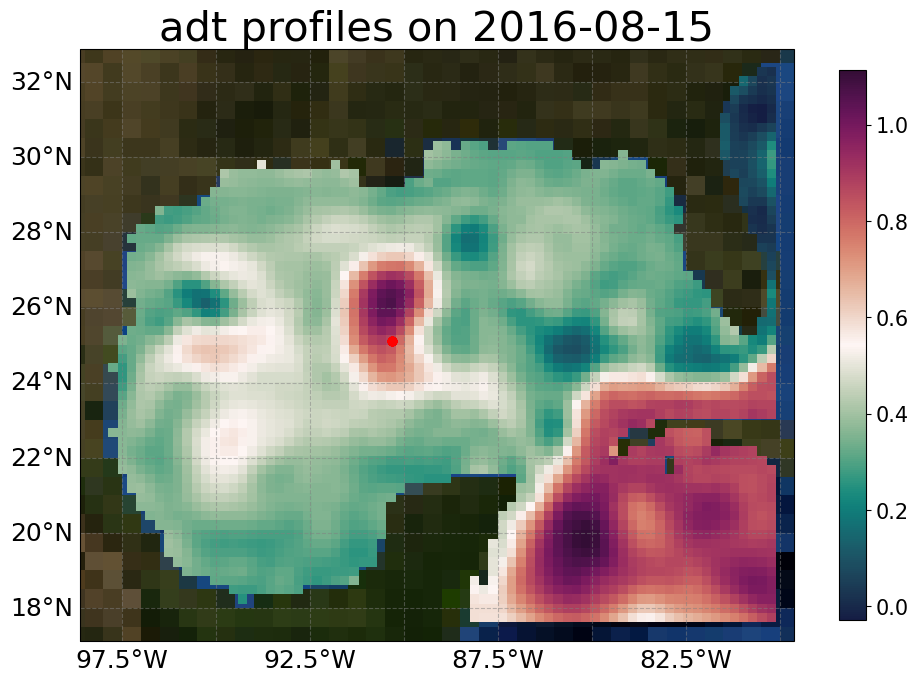

lat			lon			altimetry_value
25.11055287269832	-90.31511394070752	0.8492644671003466
25.11191429975238	-90.31614186101706	0.8498069057176523
25.11296507630285	-90.31613588195671	0.8499850961542922
25.113891847913013	-90.31672092308881	0.8503199499660847
25.116710870559	-90.32282294855621	0.8526406132332386
25.117226779673047	-90.32326195965575	0.8528613920458217
25.11651192124127	-90.3230700085256	0.8526808671290795
25.117842011388	-90.32198758195956	0.8525831371136992
25.113277719192357	-90.3197452438005	0.8511249989387344
25.114832345624027	-90.32136691597826	0.8518798159723981
25.11727815922679	-90.32319240923435	0.8528492642324762
25.118489391480743	-90.32401541554226	0.85330512566916


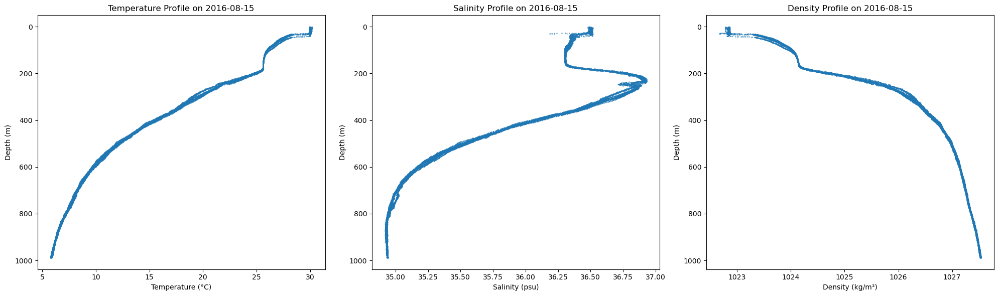

Closest time index: 15
_show_var_names = True


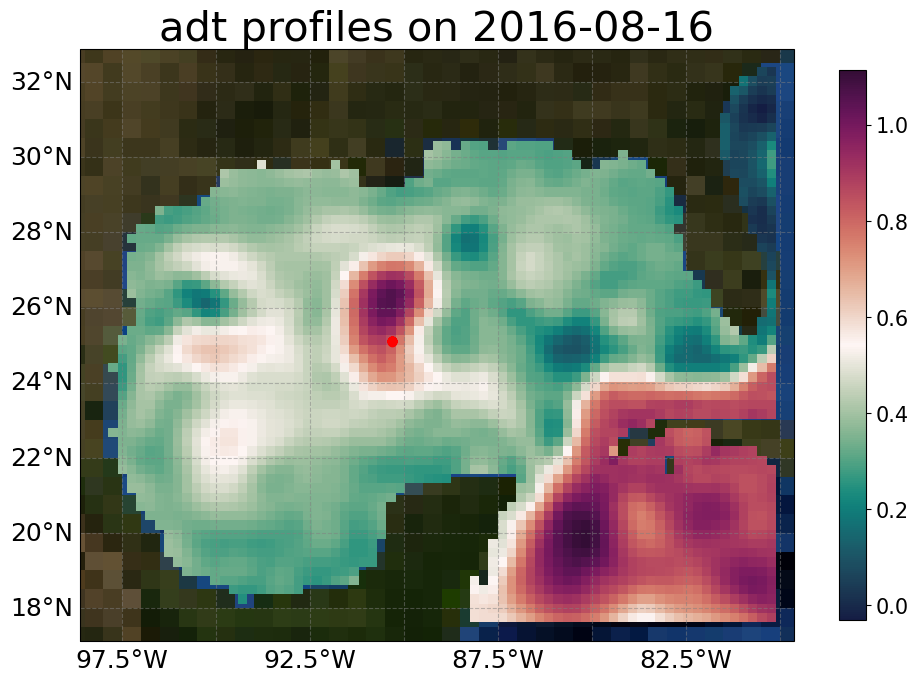

lat			lon			altimetry_value
25.118315194743808	-90.32599221225937	0.8365047042293112
25.117135641261584	-90.32675773678058	0.836534187781696
25.113815160214216	-90.32811662943854	0.836355133275634
25.112305083591725	-90.32604593993953	0.8353878418850942
25.118489391480743	-90.32401541554226	0.8358865180622223
25.104447787423027	-90.32275957392847	0.8328210889056089
25.10246761043677	-90.321424766507	0.8320069845792718
25.107631479408365	-90.32422372746159	0.8339049508077199
25.106494825745237	-90.323155112268	0.8333380667000704
25.111096194956627	-90.32551304316709	0.8349840266164701
25.109505998824176	-90.32496095265881	0.8345018636732964
25.099046583250026	-90.32097465170378	0.8312123429414833
25.096626747545987	-90.32341921967429	0.8315616606083571


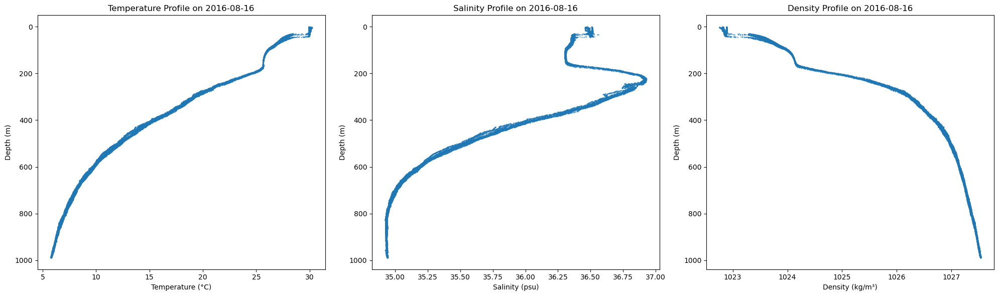

Closest time index: 16
_show_var_names = True


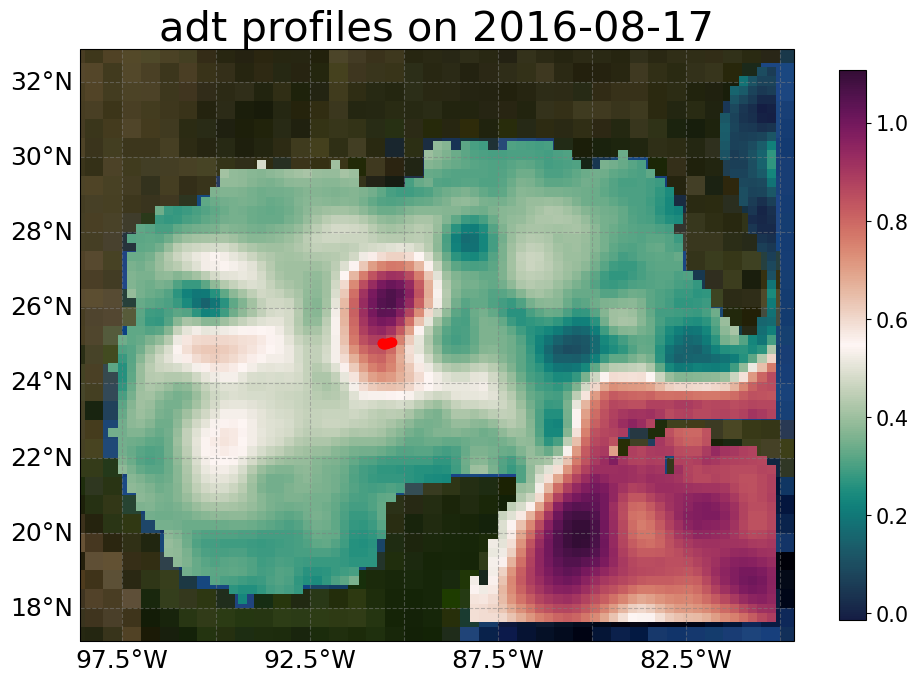

lat			lon			altimetry_value
25.096626747545987	-90.32341921967429	0.8185365629623389
25.074117183741414	-90.3751399185684	0.8331810463882793
25.066992772288796	-90.39522097008862	0.8351582762329653
25.088810002859574	-90.33646550610167	0.8217704496019671
25.08127395255871	-90.35570933738644	0.827404072388678
25.052097550718564	-90.45164961754122	0.8418855515738488
25.04779933134271	-90.47166996321891	0.844506349970596
25.043385793166287	-90.49071739442645	0.8469515523794628
25.03935543710077	-90.51037215298608	0.8495933861558005
25.062024246413284	-90.41471660496607	0.837500380503441
25.056358944596457	-90.43371480510862	0.8396346205247456
25.038338080098992	-90.56283983184632	0.8585629400200602
25.04657816701618	-90.57133342945542	0.8615989742988682
25.036868088665926	-90.52931367455079	0.8524224594888137
25.035428712475415	-90.54967155773357	0.8557081498385046
25.053942931366443	-90.57727957960087	0.8640161432459147
25.063032359273535	-90.57936716168422	0.8660827590274778


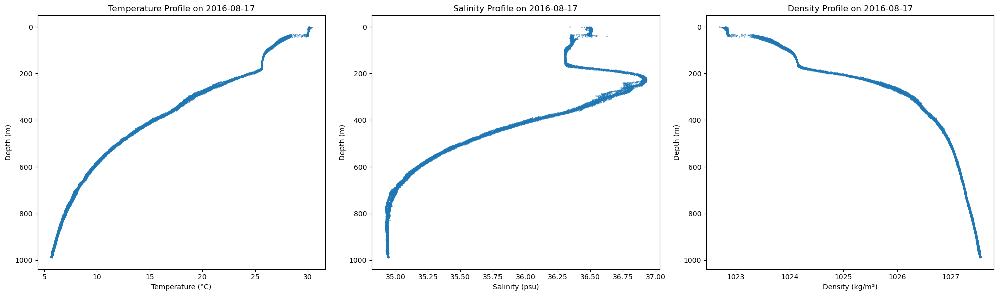

Closest time index: 17
_show_var_names = True


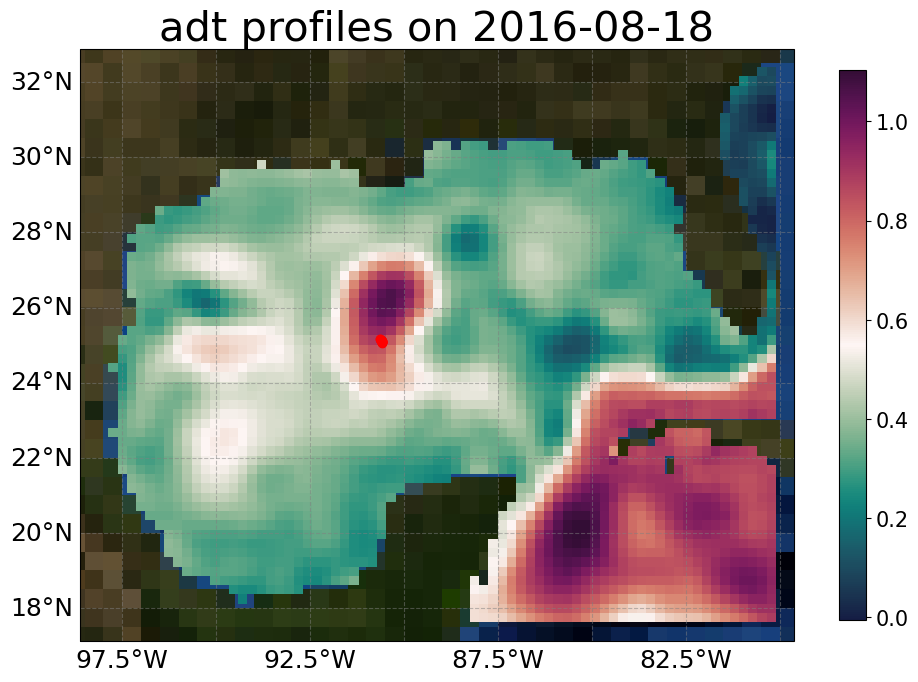

lat			lon			altimetry_value
25.063032359273535	-90.57936716168422	0.858090534467331
25.085725194603203	-90.58734201148108	0.8640693996128859
25.09290794979592	-90.58942692580001	0.8658590750548103
25.070656620051523	-90.58171237456509	0.8600384659985315
25.078760900421237	-90.58488431433607	0.8622398224186604
25.098069034842617	-90.59243825396243	0.867444078173369
25.104943218209822	-90.59499112473021	0.8692562847198626
25.11008711457056	-90.5984740590242	0.8709187898958822
25.113601470380658	-90.60323381165365	0.8725195407838476
25.118334425110646	-90.60880440441635	0.8745005714632128
25.12513955212194	-90.61215843372806	0.8764339240157442
25.145507146463192	-90.62508012848349	0.8840620257086698
25.15339986084207	-90.6272899708029	0.8861094055530956
25.131205003718847	-90.6177405778134	0.8790558362272839
25.138449875318297	-90.62046417484834	0.8814123183169335
25.16071918198361	-90.63091148040252	0.8880392848682268


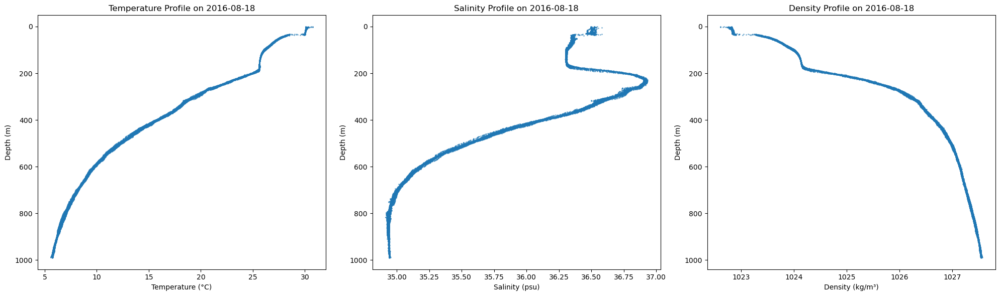

Closest time index: 18
_show_var_names = True


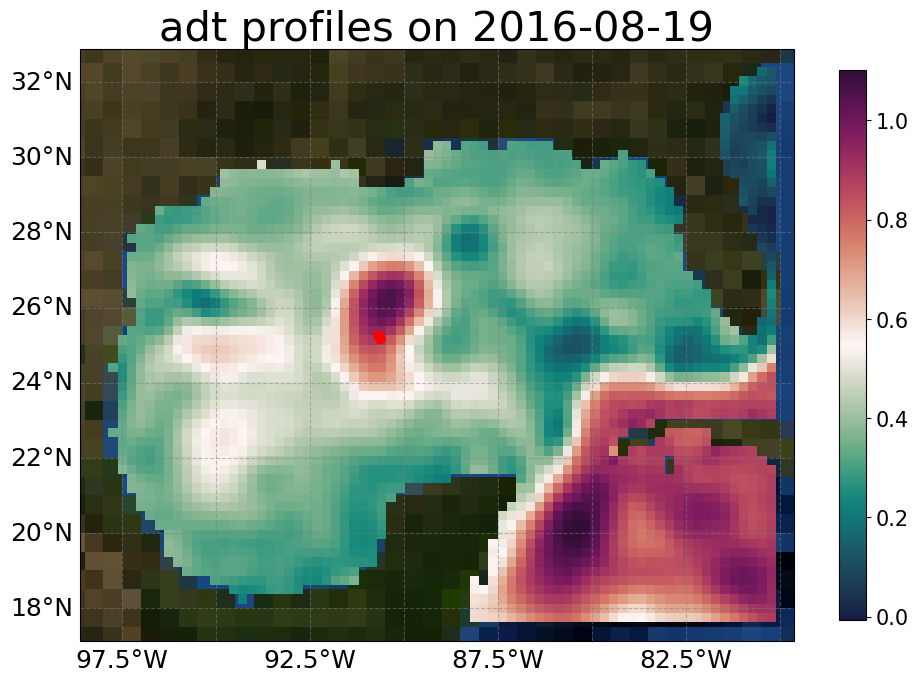

lat			lon			altimetry_value
25.17678682073634	-90.6359170239404	0.8917985427602081
25.184941594951596	-90.6381372932383	0.8939319348588306
25.16071918198361	-90.63091148040252	0.8875363851102686
25.16906100076247	-90.63261240584836	0.8897144862093875
25.19142150588629	-90.64195273633302	0.8956993285273289
25.198654432311848	-90.64464164085547	0.8975985937819522
25.205978351866847	-90.64969830873483	0.8995917662170476
25.213159648752324	-90.6537356794484	0.9014963551377498
25.2194966277737	-90.65956187768776	0.9032338870842924
25.22588948706168	-90.6642713085264	0.9049321640324799
25.26325058184942	-90.6894680635861	0.9144836059070174
25.272122820947644	-90.69171641746759	0.9166143170411676
25.245853772901334	-90.67911361878981	0.9101328715001087
25.25488541013025	-90.68439587753463	0.9124018954478287
25.231994630921555	-90.66918416002278	0.9065500634751428
25.23922730826166	-90.67373206892233	0.908413023444998


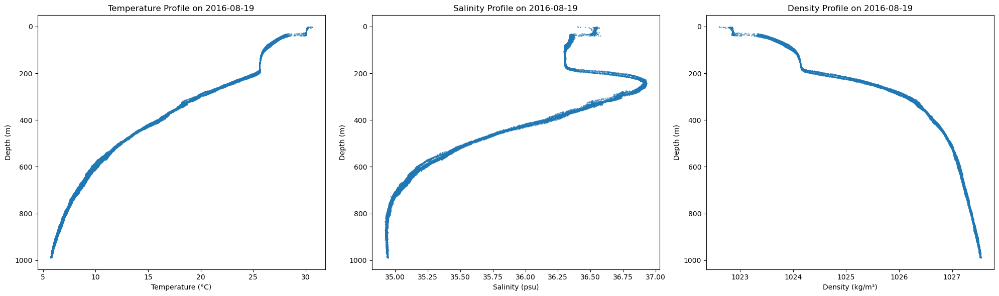

Closest time index: 19
_show_var_names = True


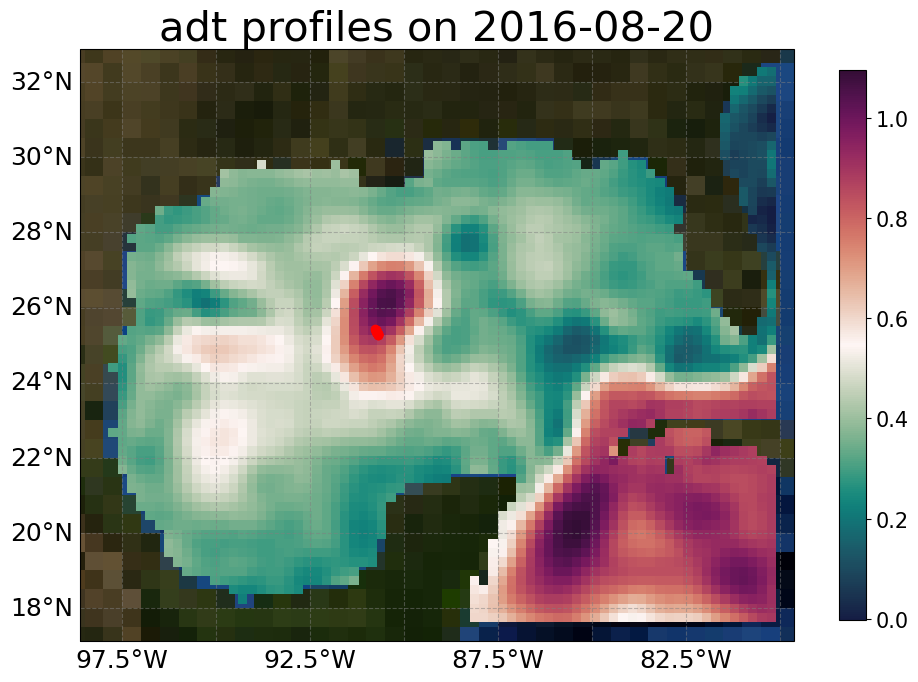

lat			lon			altimetry_value
25.272122820947644	-90.69171641746759	0.9168224431263332
25.314160142172838	-90.71183944455314	0.9284837607844119
25.323348800908143	-90.71635683459627	0.9309602620492803
25.29724394273905	-90.70100776849038	0.9237771560148005
25.30608935334821	-90.70622241942554	0.9262413348093614
25.280176539980946	-90.69443467542374	0.9190597494532435
25.289235453811784	-90.69701045008021	0.921543206518856
25.368132679394066	-90.742186008725	0.9426587777957964
25.380802168160706	-90.74558354185504	0.9454851920935082
25.349575495278977	-90.73071043045638	0.9378950294027237
25.35944319831848	-90.73556647352957	0.9404343432112416
25.33280544203502	-90.7222378728811	0.9335023669340007
25.340741586101927	-90.72594580943789	0.9355882634123353
25.392355660345064	-90.75025555999132	0.9476728165791355
25.405260465246148	-90.75500039994668	0.9500765258002184
25.41613460888578	-90.75819376351694	0.9520780536869939
25.428758814463066	-90.76130978649041	0.9543808361150832


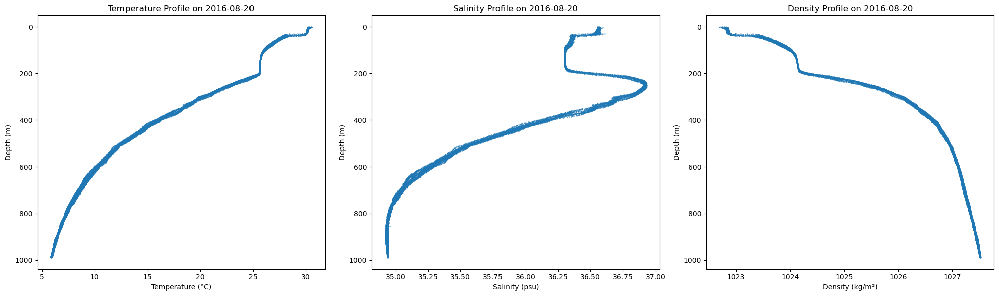

Closest time index: 20
_show_var_names = True


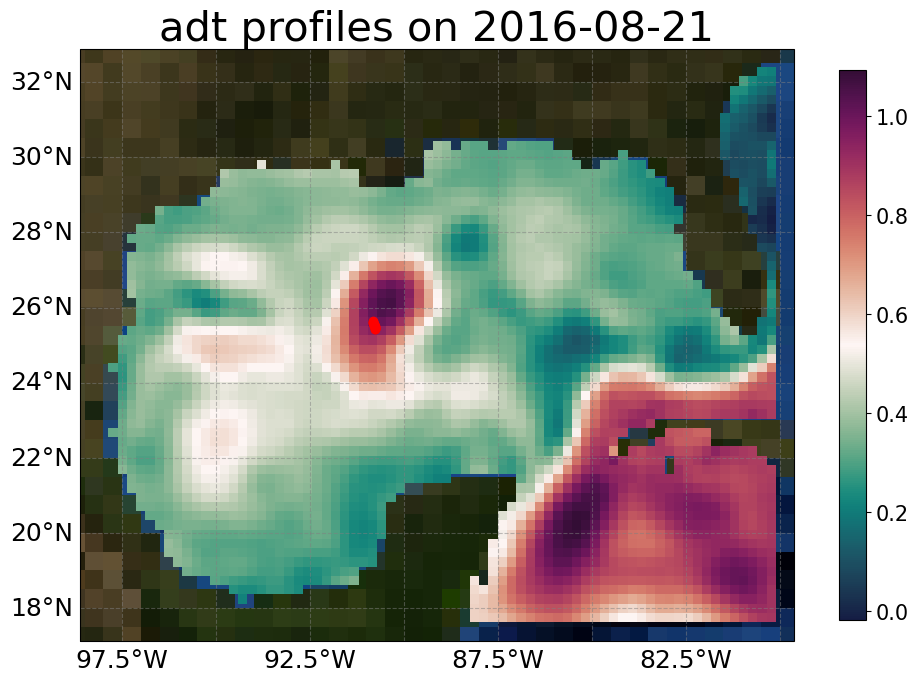

lat			lon			altimetry_value
25.4385637711652	-90.76401205734456	0.9596483284014499
25.451839249408117	-90.76611052892811	0.9621089050204852
25.428758814463066	-90.76130978649041	0.9578197693023959
25.511345321900777	-90.7871607368623	0.972487200938639
25.524606955473477	-90.79221611701793	0.9746560887256293
25.461601655566497	-90.76861425045884	0.9638908016549026
25.473629017338496	-90.77112138115332	0.9660715809984595
25.4851503604151	-90.7766624326975	0.9680651555071967
25.498172075464012	-90.78129814831398	0.9703061872052594
25.601295522549474	-90.81885653611691	0.9863726214502341
25.61970471188021	-90.82095125881355	0.9892751992507525
25.56905300214184	-90.80953996232469	0.981531604586238
25.58443568606023	-90.81409571294594	0.9838629547190483
25.53855493830217	-90.80002318147584	0.9767728668610207
25.55296866112495	-90.80382167310756	0.9790839693098037
25.631872071191154	-90.82010095417237	0.9909535647803976


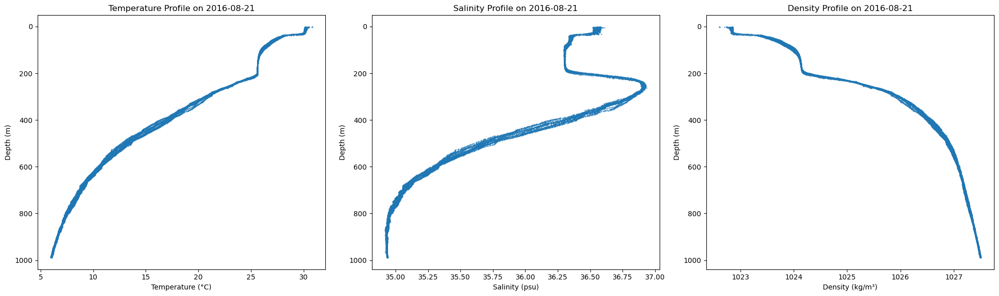

Closest time index: 21
_show_var_names = True


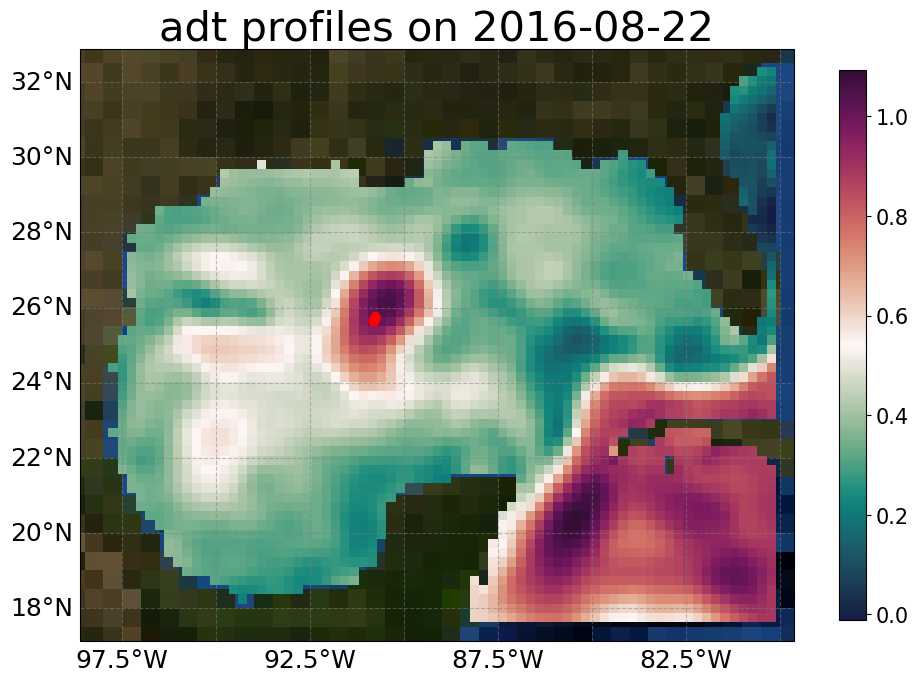

lat			lon			altimetry_value
25.652950601080683	-90.80929091384579	1.0013224499719973
25.663816467818148	-90.80507249352974	1.0026394562786582
25.631872071191154	-90.82010095417237	0.9986991564067741
25.64246989430926	-90.8144750044144	1.0000130017615627
25.67473285334242	-90.80241274673102	1.0038843848140122
25.68432387115739	-90.79962917536061	1.0050222353251692
25.72361486855024	-90.78551206482913	1.0100557337930618
25.732186154866334	-90.78164507627821	1.0112596300622958
25.70733255001682	-90.79127071071639	1.0079390158154546
25.715381421380318	-90.78714016568405	1.0090780658988066
25.692755664126274	-90.79774887348341	1.00599467903322
25.700630267055704	-90.79409369949681	1.0070498507951258
25.75848047301277	-90.77841192268636	1.0142973833337319
25.76803690723946	-90.77558576725927	1.0155652068584005
25.739961120407816	-90.78126632858596	1.012104306561498
25.7494109664448	-90.77810188576568	1.0133679743602568


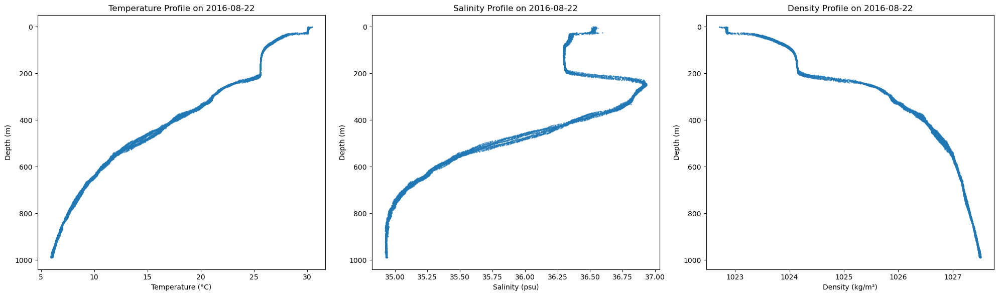

Closest time index: 22
_show_var_names = True


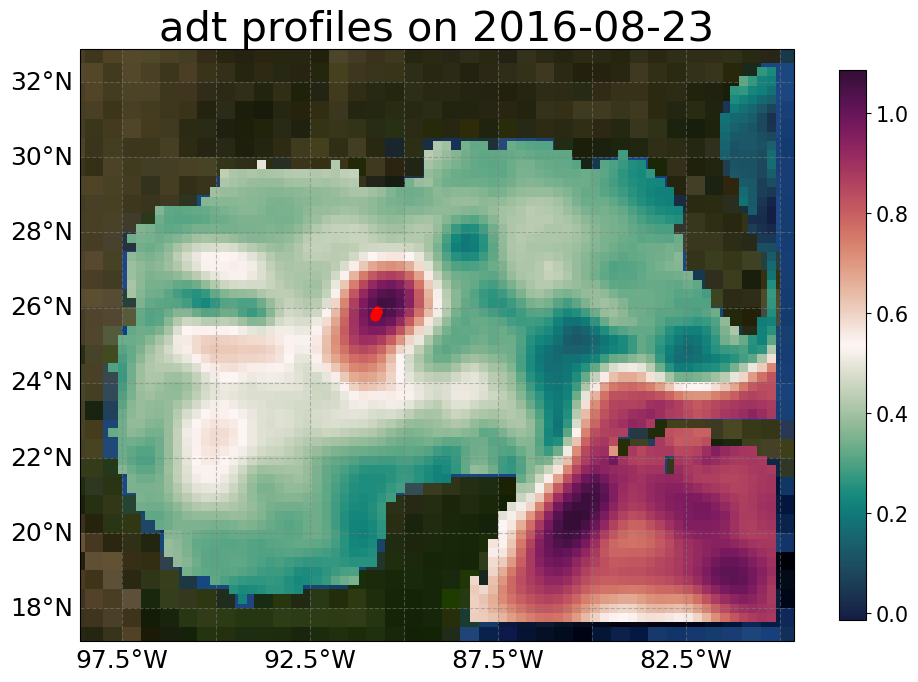

lat			lon			altimetry_value
25.76803690723946	-90.77558576725927	1.0194503645454938
25.77795987065636	-90.77385837046114	1.0205460885641686
25.78716961124208	-90.76771261009391	1.0219801377240103
25.837201711458974	-90.7494917900897	1.0287396951313035
25.848269469851886	-90.74478180324769	1.030374851107316
25.817583393471907	-90.7579351168614	1.0259020736978643
25.828084324438734	-90.75291964909302	1.0274598549529415
25.797372054689546	-90.76570228179186	1.0231598647196303
25.80758723473768	-90.76030172939701	1.0246760247016897
25.90227762684534	-90.72235182569085	1.0363499615153084
25.912726458410656	-90.71600818522768	1.0373573770431546
25.881446557213152	-90.73201897945688	1.0347436225812165
25.893867876250244	-90.72696689326527	1.0356109462477165
25.859039928800186	-90.7409593221734	1.0319100402894215
25.871252050927172	-90.73591428195404	1.0337582874192521
25.920968045068207	-90.71031735851591	1.0382491444837292


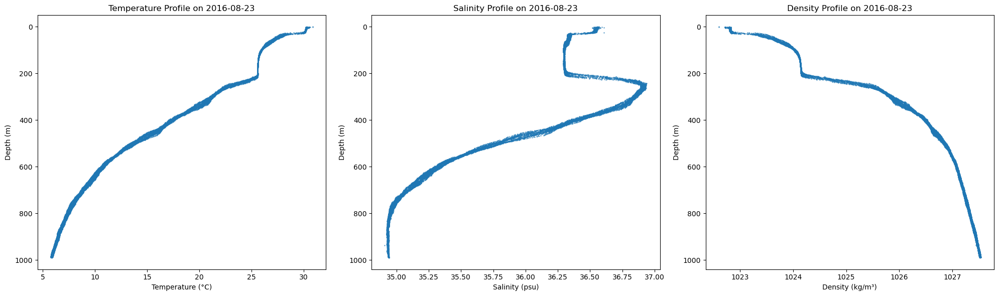

Closest time index: 23
_show_var_names = True


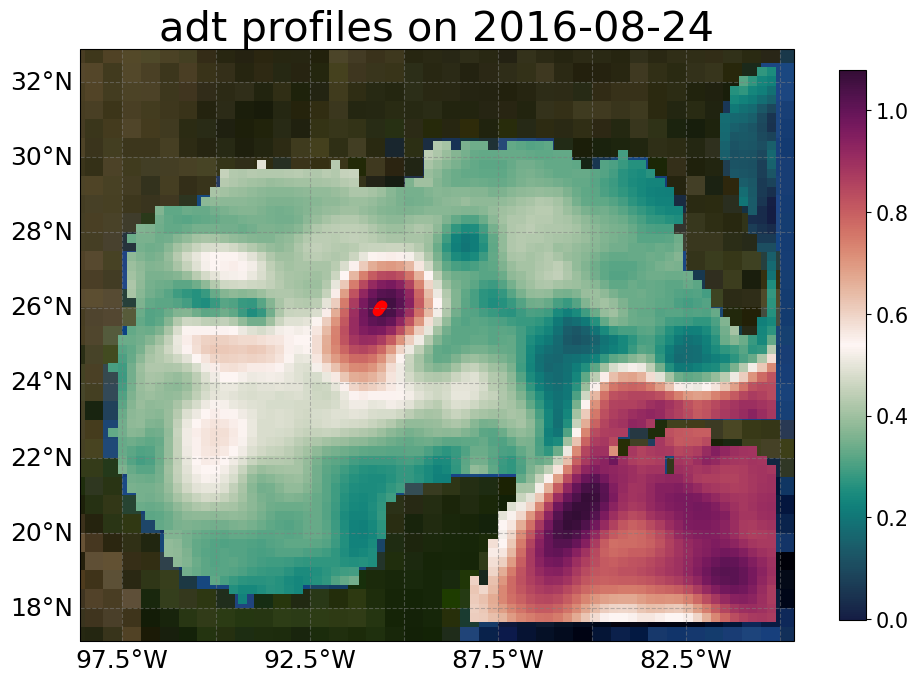

lat			lon			altimetry_value
25.96407059876902	-90.6781470397341	1.0458060118876276
25.975699748926303	-90.67135987219233	1.0466701951102553
25.94343867271185	-90.69727979688912	1.0435167906370442
25.953471134306106	-90.68685388232336	1.0447461779539178
25.920968045068207	-90.71031735851591	1.042007919960694
25.932323008811576	-90.70262678818523	1.0428845843262644
26.010831399994668	-90.64685325320941	1.049899890484126
26.021575934805625	-90.63776357837233	1.0511314718984812
25.98826099814451	-90.66397720043064	1.0476333673399747
25.99873156683413	-90.6558347889059	1.0486961221117574
26.033679736642938	-90.62663936656278	1.0526612772896025
26.045023300261548	-90.6179128128478	1.0528730406646918
26.057837844719344	-90.60771363866398	1.0528801908482721
26.068682319915283	-90.59807451399872	1.0529111576737988


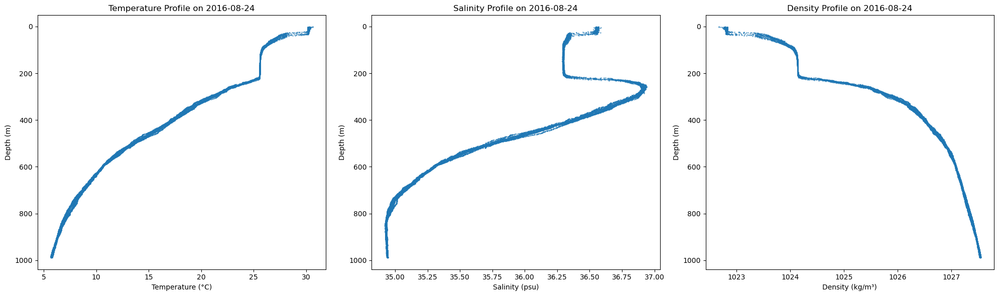

Closest time index: 24
_show_var_names = True


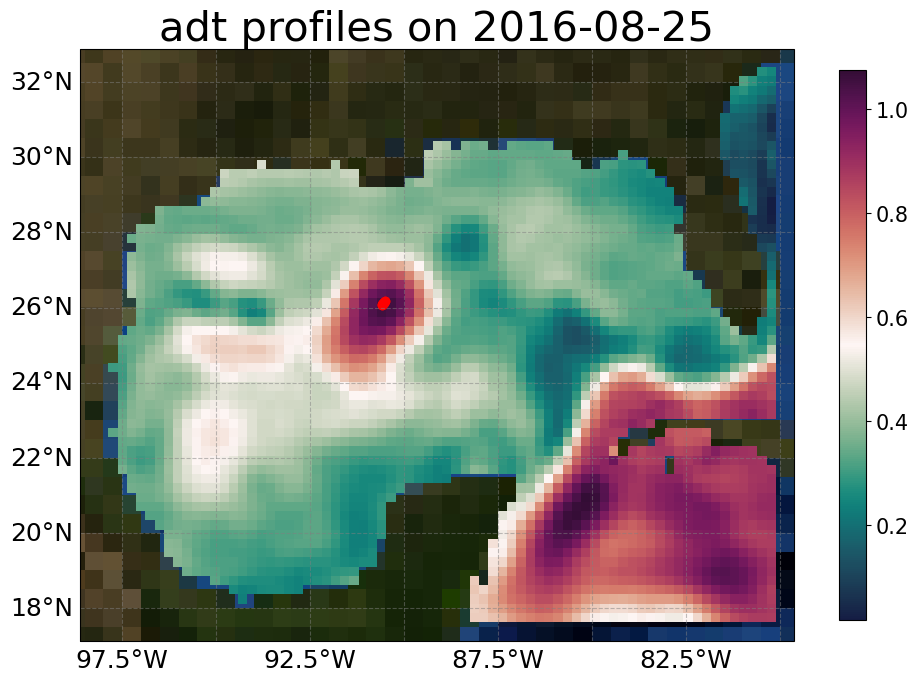

lat			lon			altimetry_value
26.078413558301833	-90.59027901689933	1.0503363205740746
26.088760650724648	-90.5803980489096	1.0501437265704259
26.068682319915283	-90.59807451399872	1.050533984921277
26.09974220237313	-90.56937772817508	1.0499824686246704
26.11036470677506	-90.5591804705681	1.0498789771796022
26.169549659862632	-90.51796924092339	1.0428431237624793
26.18044457607798	-90.51801560029895	1.0411624251579492
26.12352826468499	-90.54738942065813	1.049818483044952
26.133966434830178	-90.53806738563661	1.048377487478618
26.14845068277598	-90.52957696163065	1.0460992556411752
26.158859887300725	-90.52099056558357	1.0444877864604734


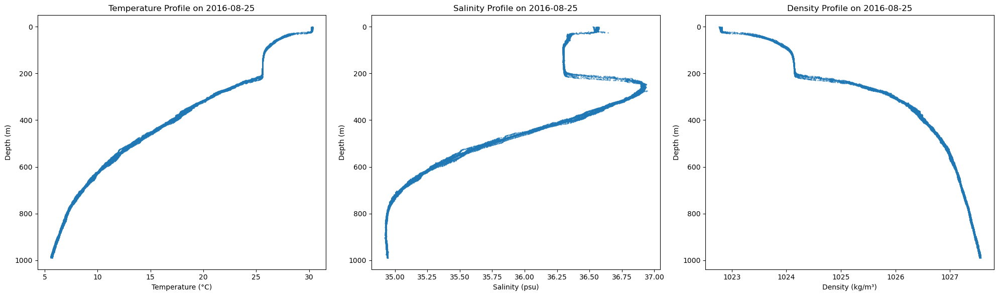

Closest time index: 25
_show_var_names = True


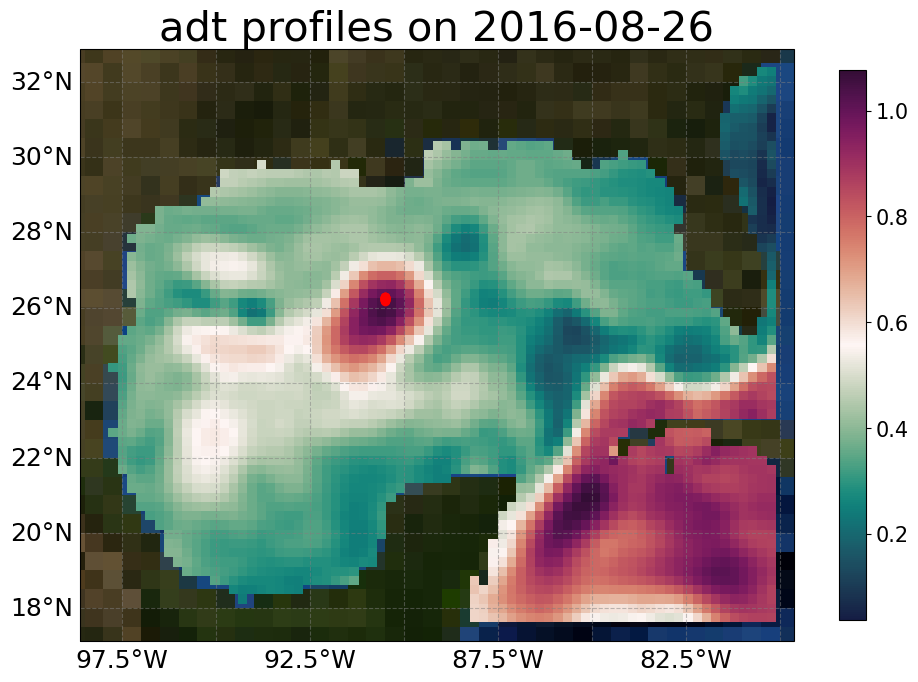

lat			lon			altimetry_value
26.18044457607798	-90.51801560029895	1.033250972097209
26.21154891862827	-90.51162629729566	1.02763219759735
26.222251371418142	-90.50884973334664	1.0257078020317913
26.191897452150602	-90.51759379559769	1.0311849847666352
26.201999742109862	-90.51495550442277	1.029356844689038
26.232348372112924	-90.5057012197768	1.0238979530824452
26.239563837280393	-90.50477795689264	1.022607361541438
26.273359607964444	-90.50075478418387	1.0165793309090019
26.280812645640413	-90.49960159905423	1.0152550778602476
26.26025073744768	-90.50198427951862	1.0189152170306714
26.267036141453897	-90.50127440704362	1.0177059803463222
26.24684308220327	-90.50220882830571	1.0213094905226785
26.253094851248648	-90.50160856375226	1.0201941516353459
26.2878112323829	-90.49778679188199	1.0140174718136763


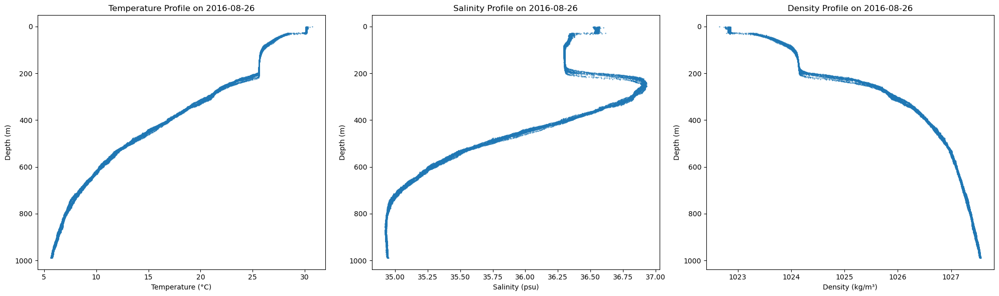

Closest time index: 26
_show_var_names = True


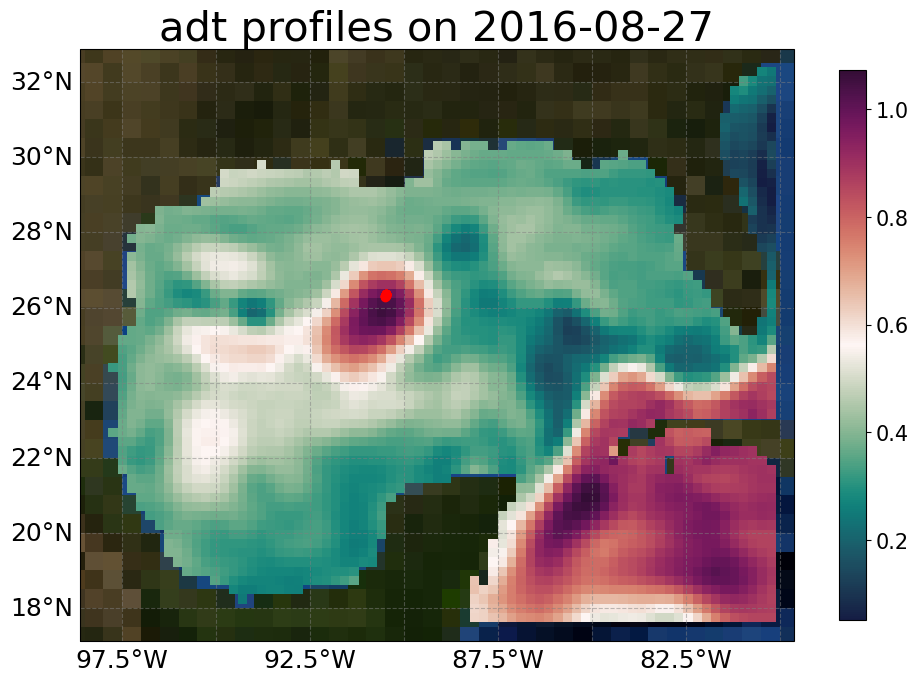

lat			lon			altimetry_value
26.2878112323829	-90.49778679188199	1.002603939532759
26.294626810159233	-90.49843438688993	1.0011852398043581
26.30069790531354	-90.49599963848749	0.9999251508038273
26.309608690193265	-90.49451747256742	0.9980749948642059
26.31725595347672	-90.49176150711253	0.9964920562710773
26.324995820404467	-90.49137323236516	0.9948857130326589
26.33220229620272	-90.4880205333927	0.9934003666456347
26.33815300811193	-90.4863366328932	0.9921721083855752
26.344319760333768	-90.483465797516	0.9909051772598119
26.34928299425379	-90.48230727362115	0.9898820447084066
26.354070371668683	-90.47732778228269	0.9889139718088512
26.359946501966938	-90.47491804857782	0.9877110695619774
26.369846159752584	-90.46766626289411	0.9857066334442113
26.372220381388722	-90.46701844830687	0.9852208853142083
26.363178319573443	-90.47187865504696	0.9870592575816077
26.36706560569471	-90.47144148936064	0.9862591524623847


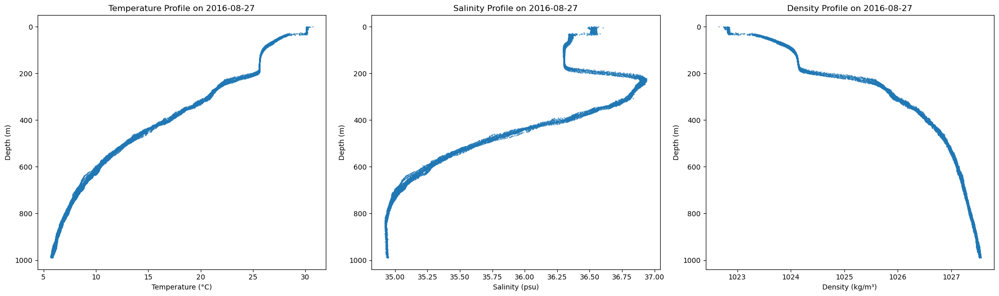

Closest time index: 27
_show_var_names = True


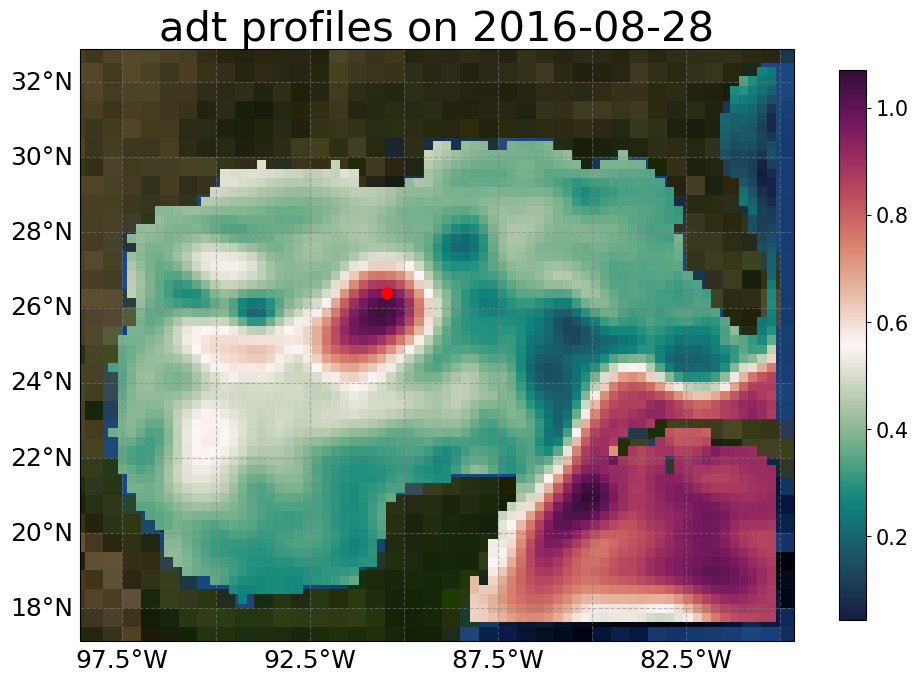

lat			lon			altimetry_value
26.374815819356378	-90.46575848592312	0.9667525708866062
26.375646789035812	-90.46791924774362	0.9664910870807814
26.372220381388722	-90.46701844830687	0.9673992225721433
26.387228001622184	-90.46647160897791	0.9622124297096183
26.391455192749287	-90.46699653089433	0.9606616085451707
26.382027100320794	-90.4696363558981	0.9641599470369883
26.384603812419883	-90.46915185486563	0.9632065157453895
26.37729647913589	-90.46751054528418	0.9658796530734342
26.380527827729296	-90.46883682924944	0.9647035948723895
26.400032951975682	-90.46440636692004	0.957474910714287
26.404367850365986	-90.46348830227129	0.9558681490733282
26.39555866132612	-90.465711164965	0.9591368694812841
26.397684276513694	-90.46618473307507	0.9583593443911309
26.408968097593654	-90.46128329641756	0.9541486252437665
26.4127873396216	-90.46031704860121	0.9527303945652821
26.41624905622645	-90.45732993970957	0.9514199254250433
26.417992632163994	-90.45580630213854	0.9507593254023536


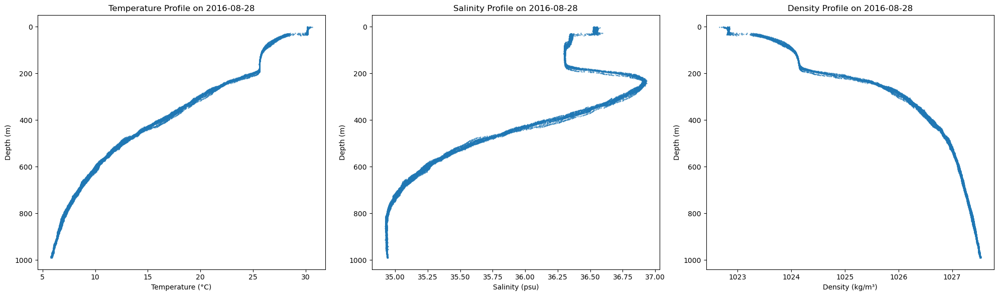

Closest time index: 28
_show_var_names = True


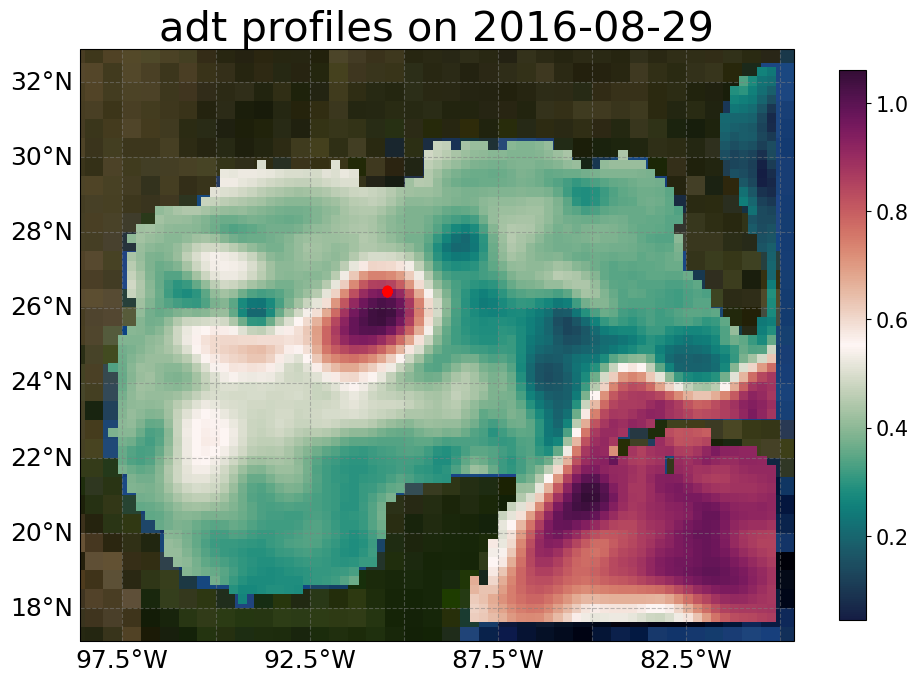

lat			lon			altimetry_value
26.417992632163994	-90.45580630213854	0.9294965821664524
26.4207219990934	-90.45472569456496	0.9283833281727625
26.42316553166076	-90.45630650002654	0.927473821830239
26.426007089229234	-90.45444987612554	0.9262895391411496
26.427807444484984	-90.45578702165722	0.9256255114860179
26.43528802528198	-90.45425101931222	0.922622392780211
26.438646128927594	-90.45502909198572	0.9213250139326195
26.44183964836289	-90.4563513891953	0.9201116530419396
26.445008252865684	-90.4550529608135	0.9188168351624474
26.42957778121816	-90.45591587211922	0.9249318297646186
26.432618856196676	-90.45572554623412	0.9237260357122901
26.45296082107741	-90.45462941046091	0.9156657132759328
26.453806163250217	-90.45425035534835	0.9153189867375529
26.447534863274548	-90.45422130452873	0.9177913127585715
26.45045012361906	-90.45443098874807	0.9166489169476688
26.455706724113714	-90.45323432967376	0.9145336045933983
26.45734052004205	-90.45314678130747	0.913886109331219


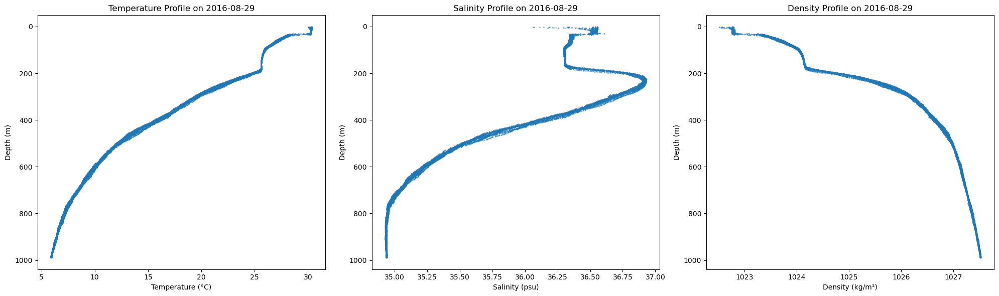

Closest time index: 29
_show_var_names = True


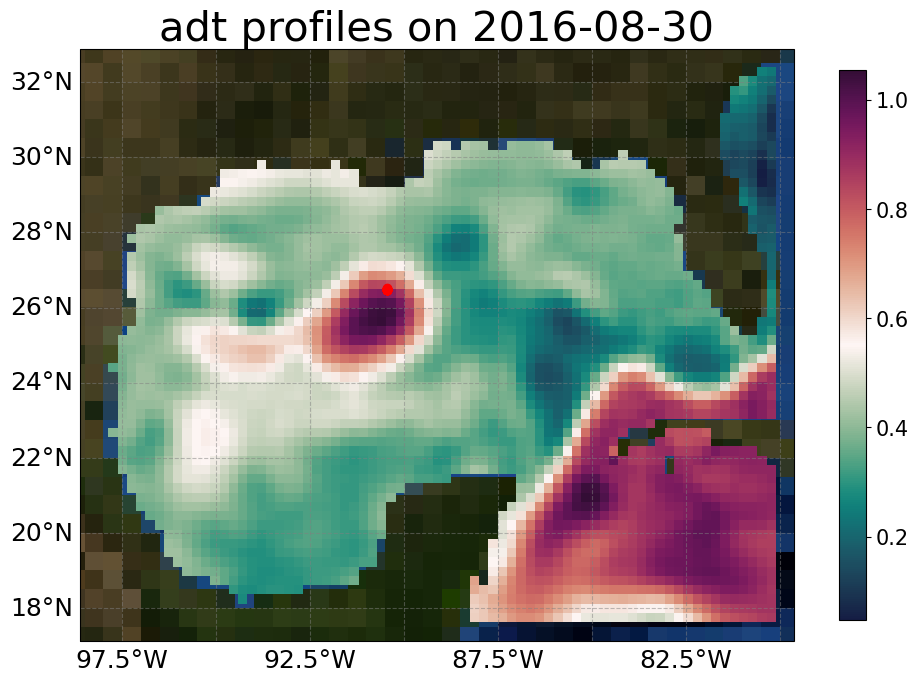

lat			lon			altimetry_value
26.45734052004205	-90.45314678130747	0.8911969566902633
26.459647217980827	-90.45478582976355	0.8903073196462591
26.46038135406784	-90.45540111360083	0.8900296927774538
26.46219963404895	-90.45506973012237	0.8892370130792311
26.464299889851723	-90.45568378402015	0.8883782034481138
26.46872784875653	-90.45543432336439	0.8864795092054982
26.47109455991943	-90.45498515750975	0.8854462186085977
26.482250349394956	-90.45482580523623	0.8806884547596716
26.486545908310664	-90.45531128329802	0.8788891864925223
26.47482549963672	-90.4539867708112	0.8837997611517565
26.478467085092767	-90.45483341892775	0.8822992677996271
26.488962231472485	-90.45379962146818	0.8777695612358862
26.49342004576499	-90.45410685160206	0.8758902041530394
26.504623900045324	-90.45060860576483	0.8709019004364819
26.507798417960785	-90.45220999904782	0.8696495019235484
26.4974644038019	-90.45417936372658	0.8741727852312597
26.501132582504475	-90.45329718610104	0.8725564528008904


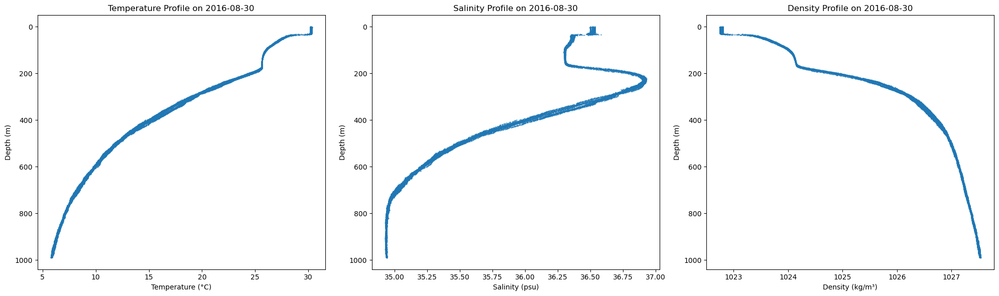

Closest time index: 30
_show_var_names = True


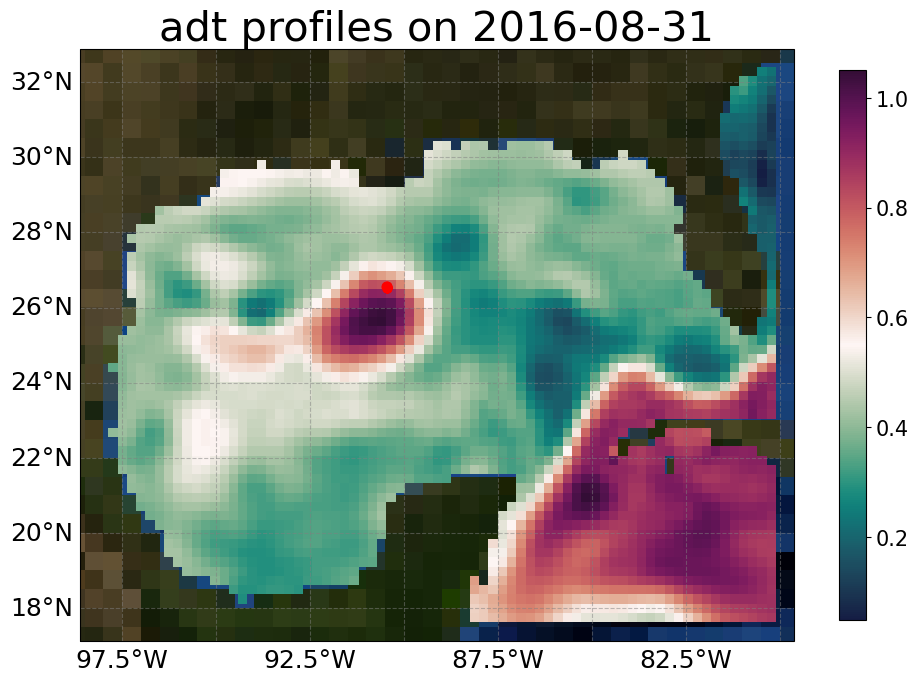

lat			lon			altimetry_value
26.507798417960785	-90.45220999904782	0.844210263095934
26.511735713486743	-90.45295003723938	0.8425583850651504
26.51529124841867	-90.45413207326942	0.8411085563294415
26.53291044466309	-90.46028018329845	0.8339604599239588
26.537514309610835	-90.4606359932995	0.8319927404756078
26.51960474982248	-90.45482025312715	0.8392903961697867
26.52281990483997	-90.45654747184867	0.8380343036540325
26.526757693848698	-90.45836737236974	0.8364732750961308
26.5296888422045	-90.46027357315023	0.8353574611922705
26.542363360351928	-90.46167539046328	0.8299759287955306
26.545321910459243	-90.46499562431441	0.8289703815152609
26.565617138477787	-90.46642935442664	0.8202986296642544
26.571892149151203	-90.4676851630648	0.8176887053227964
26.550805548105348	-90.46607206493265	0.8266847168384127
26.558754696454148	-90.46686621109399	0.8233084281569096
26.577983549851425	-90.46581492401813	0.814888329214728


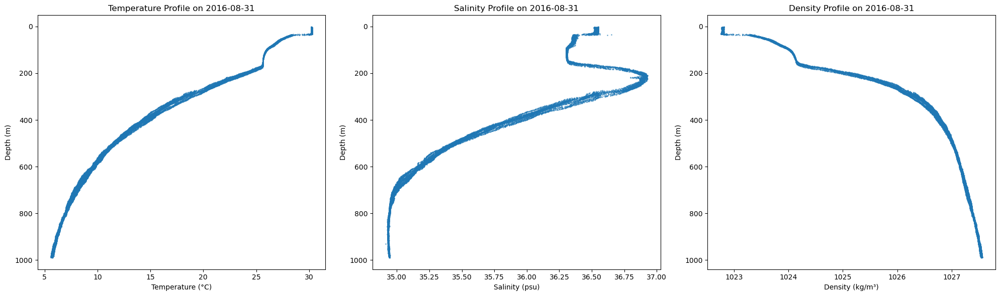

Closest time index: 0
_show_var_names = True


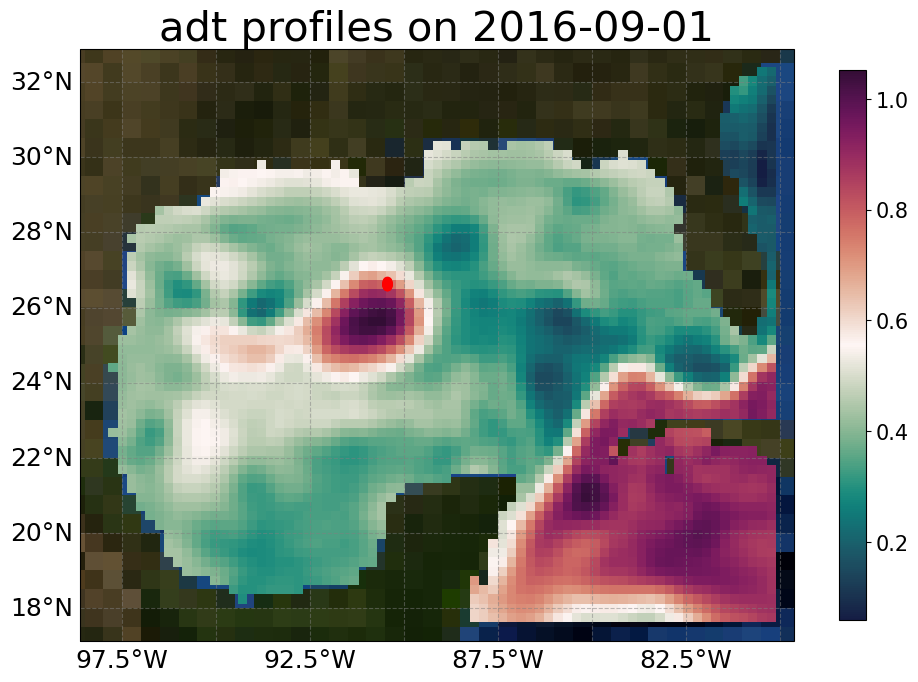

lat			lon			altimetry_value
26.604966956956417	-90.45997708153938	0.7744304416987149
26.612373559486116	-90.45732942985262	0.770691698411001
26.592488079043157	-90.46362674177212	0.7806247973949532
26.59878319397084	-90.46100588526144	0.7774106974987819
26.619999659302742	-90.45640197379468	0.7670510389910068
26.627894421921496	-90.45666216184122	0.7633900847043256
26.577983549851425	-90.46581492401813	0.7875767786634635
26.58480112414594	-90.46433329106034	0.7842582006499123
26.650037338251874	-90.45066222085646	0.7521485535246134
26.657353949685845	-90.44820586135245	0.7483813935935159
26.635878090409694	-90.4542139557167	0.7593013566091525
26.643362843595337	-90.45199616702956	0.7554792552242631
26.664136473192812	-90.44660978659934	0.7449709653443767
26.671601899179485	-90.44597410613515	0.7413497586696582
26.679546097503742	-90.44566779864752	0.7375400544711141
26.68810031265557	-90.44419747094847	0.7333056190185123
26.69445960191552	-90.44043007335884	0.7298488381225499


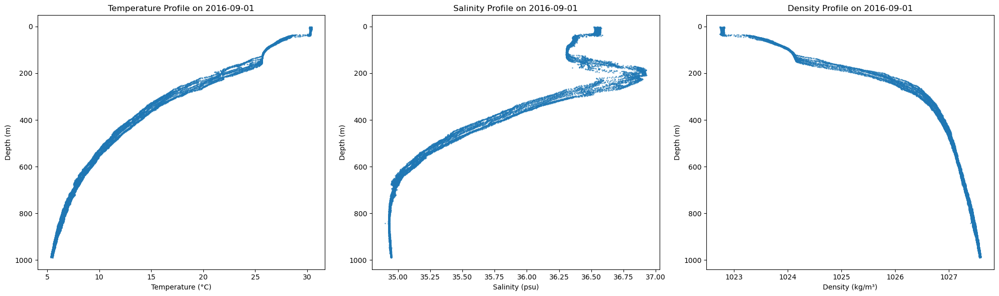

Closest time index: 1
_show_var_names = True


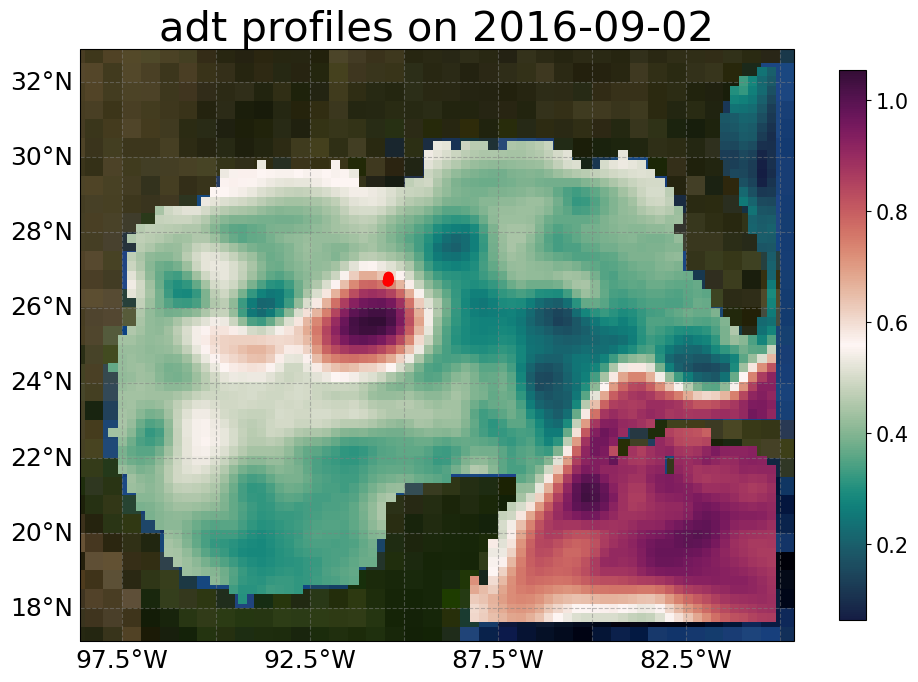

lat			lon			altimetry_value
26.69445960191552	-90.44043007335884	0.7017267038633644
26.70221824576135	-90.44061822451742	0.6980986509519517
26.709718642956762	-90.43835956580139	0.6942633861002371
26.71594733773803	-90.43976483717812	0.691519406187881
26.739373813751843	-90.43756519810803	0.6801978822088177
26.747216466957425	-90.43750276988877	0.6764980745555881
26.723480624395417	-90.43761745484345	0.6876858450107799
26.7304115930339	-90.4376464375614	0.6844272426225971
26.789013281216892	-90.4288697750948	0.6557074945563133
26.79829359828618	-90.43074473191172	0.6515857160917502
26.770404176347014	-90.43156022288902	0.6648079542168341
26.77937208053865	-90.4311607976661	0.6605381734258866
26.755642077426273	-90.43255516357658	0.671881785621804
26.76152002861238	-90.432405509717	0.6690972308860996
26.808377984001254	-90.43076622180561	0.6468460006788812
26.81884407404806	-90.4299265935687	0.6418169537490894
26.828776471516527	-90.42740086502013	0.6368259926980951


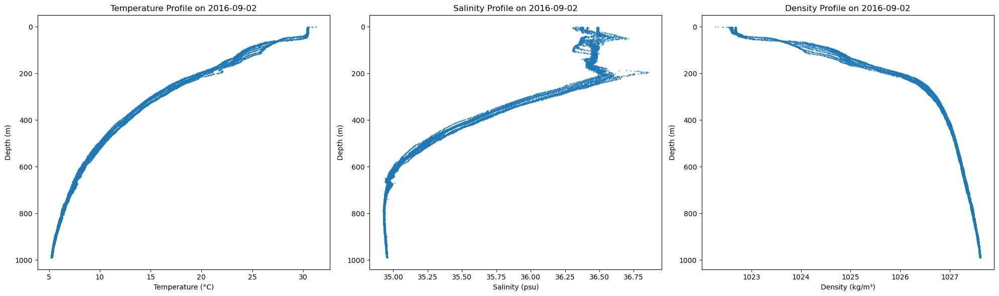

Closest time index: 2
_show_var_names = True


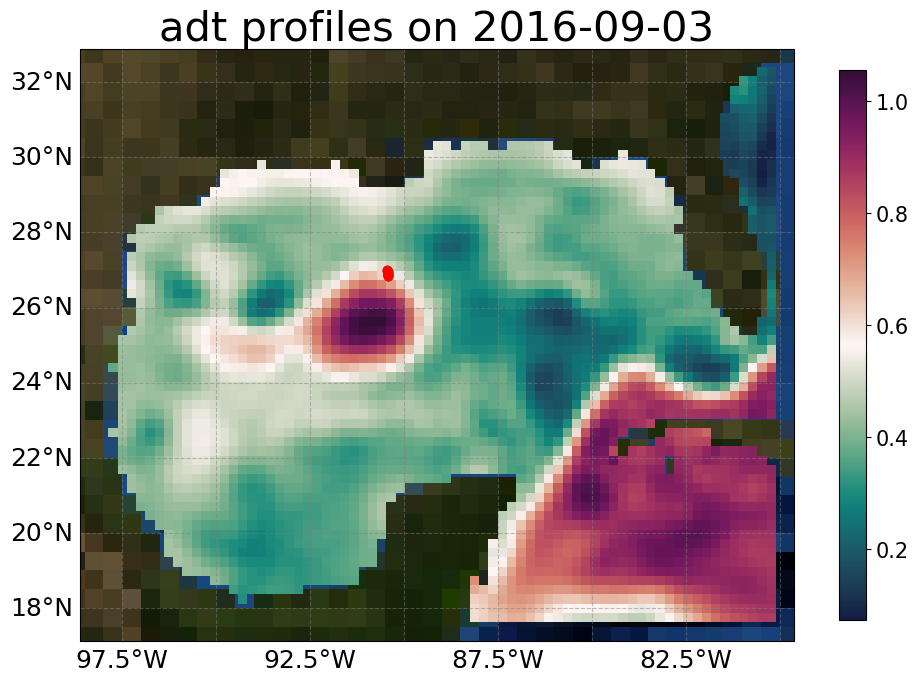

lat			lon			altimetry_value
26.848555800902947	-90.42583419654692	0.6023406173619856
26.85881996220246	-90.42587830245003	0.5976949759976244
26.828776471516527	-90.42740086502013	0.6115302970915977
26.838471969708	-90.4267201054687	0.6070372683849066
26.91301559172029	-90.42841613923135	0.5765942155059622
26.9233393072786	-90.42910083805415	0.5728479333107412
26.88785146805801	-90.42646784790327	0.5856755475208169
26.899689249900053	-90.4280939043639	0.5815008690956216
26.86770143228224	-90.4239067357548	0.5933945010163888
26.877501629105577	-90.42524660549272	0.5893466975690148
26.961933018946638	-90.4369437770525	0.5594556805766105
26.977075020033904	-90.44027845327423	0.5541975070927696
26.935359830404142	-90.43211772963782	0.5687626699558418
26.947978313310998	-90.43466048805757	0.5643808421677028
26.99394572053204	-90.4406527869869	0.5479327671878765
27.01118442833743	-90.4443204507397	0.5418923190565256


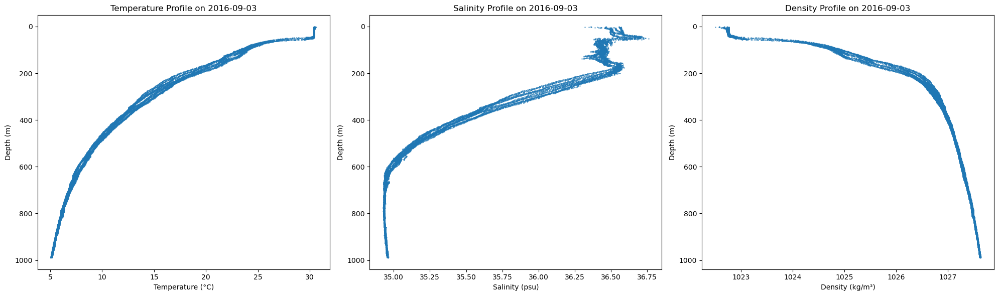

Closest time index: 3
_show_var_names = True


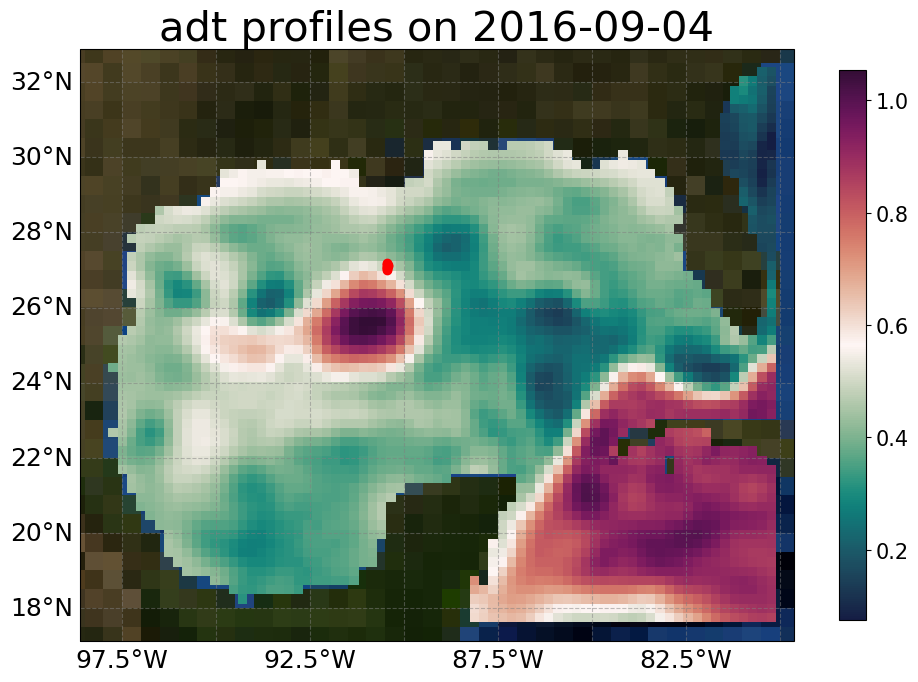

lat			lon			altimetry_value
27.01118442833743	-90.4443204507397	0.5197914571656387
27.02966238214493	-90.44427655084628	0.5134144008046487
27.048574926167056	-90.44387785585893	0.5068475141350562
27.06909455117075	-90.44165691590196	0.49953269345146856
27.087307156558406	-90.44154479544274	0.4932530290582514
27.10608241231934	-90.43942589558824	0.48658169750794283
27.123864874340633	-90.43932651456906	0.48046241204256046
27.186414682176203	-90.44143674980674	0.4658297988350423
27.14432566160735	-90.44049096601866	0.47563950275197026
27.16255218277785	-90.4437965062879	0.4716559519764113


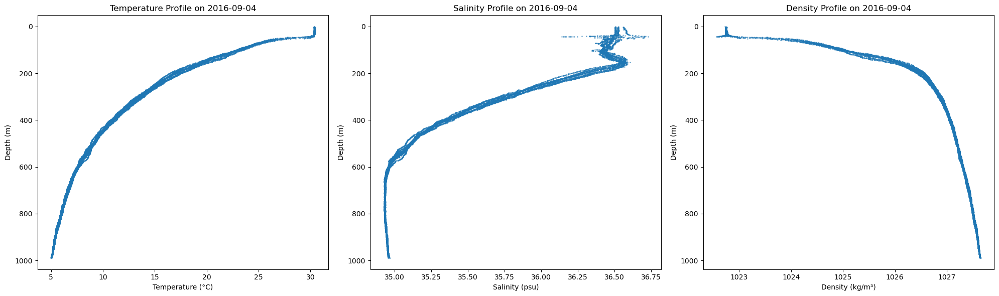

Closest time index: 4
_show_var_names = True


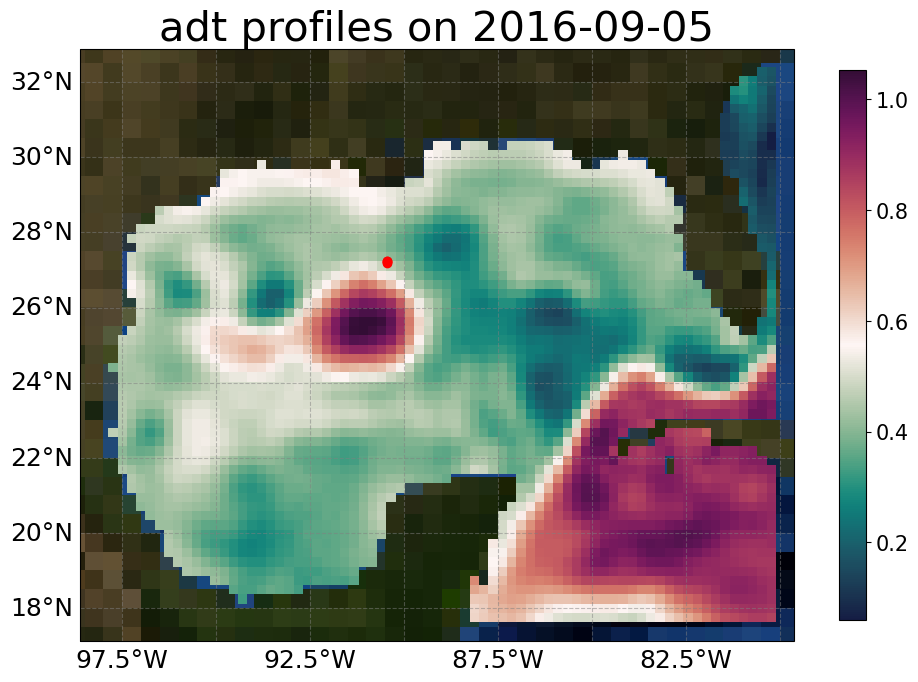

lat			lon			altimetry_value
27.186414682176203	-90.44143674980674	0.45147845400125064
27.205638273629983	-90.44156710850625	0.44739619085739396
27.22809080299998	-90.44052468869332	0.4425229583511936
27.248107997361156	-90.4410380411617	0.43830571728610235


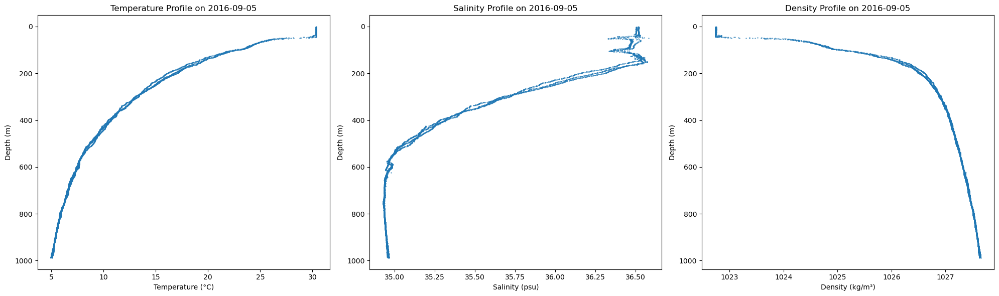

In [9]:
# load/plot aviso data (2016-08-06 - 2016-09-05) 
aviso_folder = "/unity/f1/ozavala/DATA/GOFFISH/AVISO/GoM/"
bbox = [17.5, 32.5, -110, -80]

start_date = datetime.datetime(2016, 8, 6)
end_date = datetime.datetime(2016, 9, 5)
delta = datetime.timedelta(days=1)
date_of_interest = start_date

while date_of_interest <= end_date:
    date_string = date_of_interest.strftime("%Y-%m-%d")
    aviso_data, lats, lons = get_aviso_by_date(aviso_folder, date_of_interest, bbox)
    # print(aviso_data["time"]) # check date

    # Filter the medians DataFrame for profiles from the desired date
    # profiles_on_date = ds['profile_id'].unique()
    profiles_on_date = ds[ds.index.date == date_of_interest.date()]['profile_id'].unique()
    medians_on_date = medians.loc[profiles_on_date]

    viz_obj = EOAImageVisualizer(lats=lats, lons=lons, disp_images=True, output_folder="outputs",  show_var_names=True)
    # viz_obj.plot_2d_data_np(aviso_data.adt, ['adt'], 'LC', 'filepref', plot_mode=PlotMode.RASTER)

    # # Plot the locations of the profiles
    # Assuming medians_on_date contains the 'lat' and 'lon' data
    prof_med_lat = medians_on_date['lat'].values
    prof_med_lon = medians_on_date['lon'].values

    # Create the multipoint variable by combining prof_med_lat and prof_med_lon
    additional_poly = [Point(lon, lat) for lat, lon in zip(prof_med_lat, prof_med_lon)]

    viz_obj.__setattr__('additional_polygons', additional_poly)
    viz_obj.plot_2d_data_np(aviso_data.adt, ['adt'], f'profiles on {date_string}', 'filepref')

    print("lat\t\t\tlon\t\t\taltimetry_value")

    for i in range(len(prof_med_lat)):
        lat = prof_med_lat[i]
        lon = prof_med_lon[i]
        altimetry_value = get_altimetry(lat, lon, aviso_data.adt, lats, lons)
        print(f"{lat}\t{lon}\t{altimetry_value}")

    plot_profiles(ds, date_of_interest.date())
    date_of_interest += delta